In [3]:
from matplotlib import pyplot as plt
import numpy as np
import seaborn
import pandas as pd
from datetime import datetime
from collections import Counter, defaultdict
import json

In [537]:
bw_df = pd.read_csv("data_blue_waters.csv")
mira_df_2 = pd.read_csv("data_mira.csv")
hl_df = pd.read_csv("data_helios.csv")
philly_df = pd.read_csv("data_philly.csv")

In [533]:
# bw_df.to_csv("data_blue_waters.csv")
# mira_df_2.to_csv("data_mira.csv")
# hl_df.to_csv("data_helios.csv")
# philly_df.to_csv("data_philly.csv")

In [4]:
columns=["job", "user", "project", "state", "gpu_num", "cpu_num", "node_num", "submit_time", "wait_time", "run_time", "wall_time", "node_hour"]

In [5]:
def date2stamp(d):
    return datetime.strptime(d, '%Y-%m-%d %H:%M:%S').timestamp()
def date2stamp2(d):
    return datetime.strptime(d, '%Y-%m-%d %I:%M:%S %p').timestamp()

In [6]:
# df = pd.read_csv("cluster_log.csv")
# # 83349, 246707
# df = df.loc[83349:]
# df["wait_time"] = df.apply(lambda row:(datetime.strptime(row["start_time"], '%Y-%m-%d %H:%M:%S') - datetime.strptime(row["submit_time"], '%Y-%m-%d %H:%M:%S')).total_seconds(), axis=1)
# df["core_hour"] = df.apply(lambda row: row["node_num"]*row["duration"], axis=1)
# df["submit_time"] = df.apply(lambda row: date2stamp(row["submit_time"]), axis=1)
# df["start_time"] = df.apply(lambda row: date2stamp(row["start_time"]), axis=1)
# df["end_time"] = df.apply(lambda row: date2stamp(row["end_time"]), axis=1)

In [7]:
# gpu_num_df = pd.read_csv("cluster_gpu_number.csv")
# gpu_date = []
# gpu_num_total = []
# for _, row in gpu_num_df.iterrows():
#     gpu_date.append(datetime.strptime(row["date"], "%Y-%m-%d").timestamp())
#     gpu_num_total.append(row["total"])

# Plot runtime prediction

In [538]:
def plot_runtime_predict2(a):
    
    datasets = ["LR","XGboost", "MLP", "Torbit", "Last2"]
    num_datasets = len(datasets)

    performance_c_A = np.array([a[i] for i in range(0, len(a), 4)])*100 
    performance_c_B = np.array([a[i] for i in range(1, len(a), 4)])*100  
    performance_c_C = np.array([a[i] for i in range(2, len(a), 4)])*100
    performance_c_D = np.array([a[i] for i in range(3, len(a), 4)])*100
#     improved = -(performance_c_B-performance_c_A)/performance_c_A*100

    bar_width = 0.2

    x = np.arange(num_datasets)

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    colors=['#1f77b4', '#ff7f0e', '#2ca02c']
    for i in range(num_datasets):
        ax.bar(x[i] - bar_width, performance_c_A[i], bar_width, color='#1f77b4', hatch='-', edgecolor="black")
        ax.bar(x[i], performance_c_B[i], bar_width, color='#ff7f0e', hatch='.',edgecolor="black")
        ax.bar(x[i] + bar_width, performance_c_C[i], bar_width, color='#2ca02c',hatch='xx', edgecolor="black")
        ax.bar(x[i] + 2 * bar_width, performance_c_D[i], bar_width, color='#d62728',hatch='o', edgecolor="black")

    ax.set_ylabel('Average Accuracy (%)', fontsize=20)

    ax.set_xticks(x-bar_width/2)
    ax.set_xticklabels(datasets, fontsize=20)
    ax.set_ylim([0, 100])
    
#     ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis

#     color = '#2ca02c'
#     ax2.set_ylabel('Improvement (%)', color=color, fontsize=20)  # we already handled the x-label with ax1
#     ax2.set_yticks([-200, -70, -50, -30, -10, 10])
#     ax2.plot(x-bar_width/2, improved, color=color,marker="d")
#     ax2.plot([-1, num_datasets], [0]*2, color="black", linestyle="--")
#     ax2.tick_params(axis='y', labelcolor=color)
#     ax2.set_ylim([-140, 60])
#     ax2.set_xlim([-0.8, num_datasets-0.6])
#     l = ax.get_ylim()
#     l2 = ax2.get_ylim()
#     f = lambda x : l2[0]+(x-l[0])/(l[1]-l[0])*(l2[1]-l2[0])
#     ticks = f(ax.get_yticks())
#     ax2.yaxis.set_major_locator(matplotlib.ticker.FixedLocator(ticks))
#     ax.legend(["Without Elapsed Time", "With 1/8 Elapsed Time", "With 1/4 Elapsed Time", "With 1/2 Elapsed Time"],fontsize=30, bbox_to_anchor=(0.5, 2.05),
#           ncol=4, fancybox=True, shadow=True)

    plt.show()

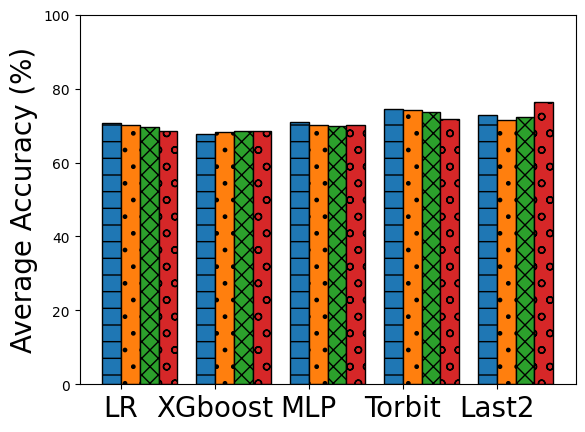

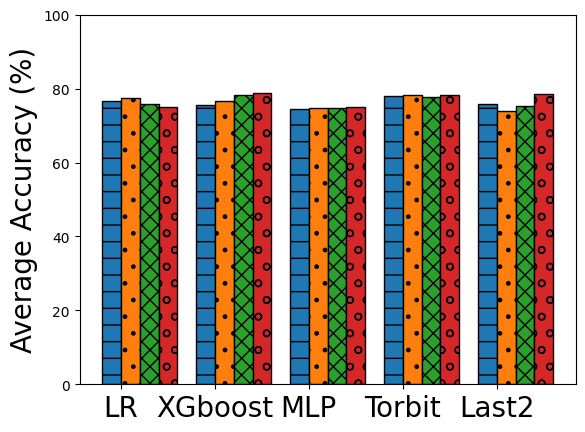

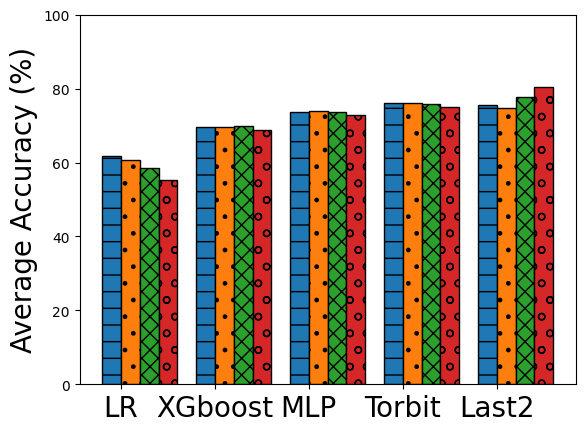

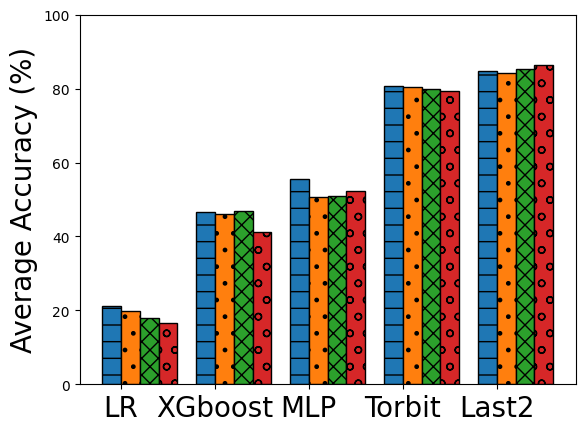

In [539]:
plot_runtime_predict2([0.707789829,0.701651364,0.697189021,0.684670447,0.676492771,0.683550948,0.685515268,0.686208826,0.710644345,0.700744912,0.699970677,0.702321837,0.743519496,0.742906733,0.736953198,0.719000961,0.727657002,0.714137799,0.722348809,0.764528979])
plot_runtime_predict2([0.76563103,0.7737006,0.757159239,0.749824339,0.754715154,0.765376185,0.784014376,0.788173985,0.746123539,0.748363602,0.747025052,0.750222168,0.779226215,0.782743322,0.77750738,0.782944346,0.757565785,0.740371105,0.753055682,0.784958189])
plot_runtime_predict2([0.616333934,0.606280709,0.584241939,0.553080712,0.696262076,0.696612946,0.697934536,0.688542366,0.736126672,0.740203895,0.737497447,0.729599379,0.762218207,0.761412308,0.758063093,0.750342698,0.75697418,0.74663953,0.778020557,0.804005823])
plot_runtime_predict2([0.213024082,0.197649389,0.178437632,0.166298629,0.466546797,0.459658392,0.46889938,0.412183114,0.554877823,0.505894583,0.508975117,0.522433906,0.807604184,0.805638105,0.797798521,0.79222452,0.848444362,0.843058217,0.852907174,0.865136978])

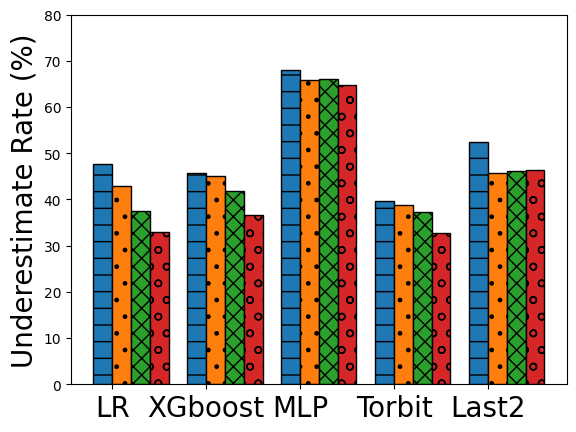

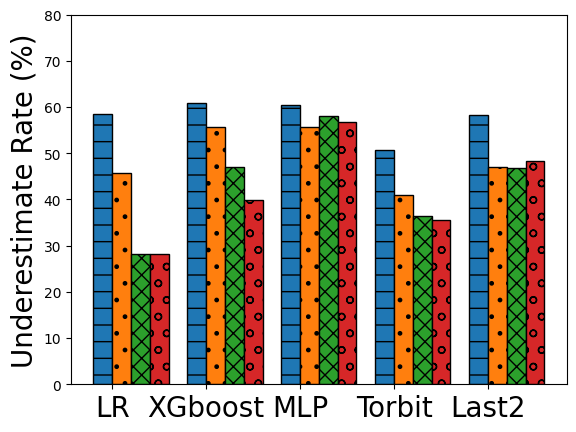

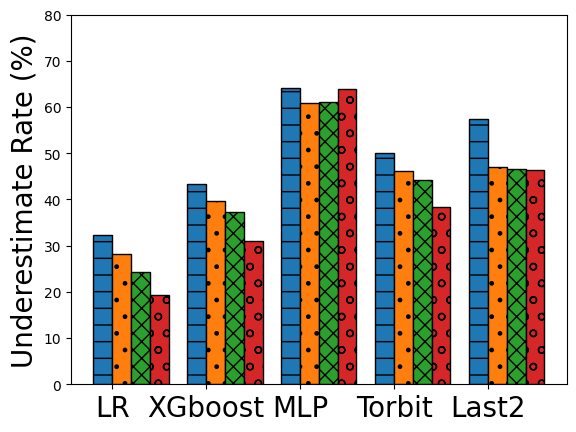

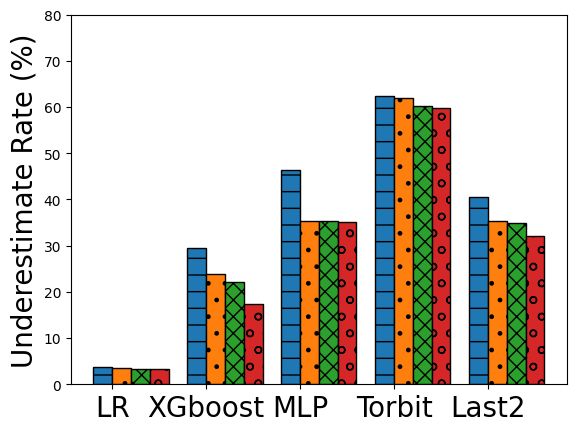

In [407]:
plot_runtime_predict2([0.475761851,0.428550577,0.375679138,0.328954411,0.456770301,0.450688464,0.41787898,0.366110381,0.679219579,0.658022349,0.66176876,0.647237224,0.396324949,0.387940122,0.371932727,0.327073096,0.525438298,0.456794036,0.461619796,0.463208939])
plot_runtime_predict2([0.58410319,0.456858986,0.282900471,0.282377549,0.609377724,0.557608506,0.470454942,0.398989019,0.605194352,0.557608506,0.581488583,0.568066934,0.507756667,0.408924525,0.3643019,0.356458079,0.583405961,0.470322216,0.467844943,0.482482134])
plot_runtime_predict2([0.323222589,0.282362011,0.242441034,0.192208543,0.433035392,0.396728263,0.372780495,0.310815043,0.640325728,0.608475679,0.610692172,0.639482497,0.500421616,0.461825716,0.442696413,0.384392994,0.574505505,0.469983146,0.465002904,0.464716795])
plot_runtime_predict2([0.036475578,0.034634128,0.033090287,0.032922882,0.294129683,0.238960604,0.221066925,0.174509877,0.462724601,0.354243555,0.353948886,0.350396191,0.624865146,0.619191994,0.601670325,0.598192032,0.405546669,0.352844536,0.349689227,0.321918827])

In [342]:
import matplotlib
def plot_runtime_predict(a):
    
    # 数据
    datasets = ["LR","XGboost", "MLP", "Torbit", "Last2"]
    num_datasets = len(datasets)

    performance_c_A = np.array([a[i] for i in range(0, len(a), 2)])*100 # 在C评价标准上的方法A表现
    performance_c_B = np.array([a[i] for i in range(1, len(a), 2)])*100  # 在C评价标准上的方法B表现
    improved = -(performance_c_B-performance_c_A)/performance_c_A*100

#     performance_d_A = [90, 85, 95, 80, 92, 88]  # 在D评价标准上的方法A表现
#     performance_d_B = [40, 45, 35, 42, 38, 44]  # 在D评价标准上的方法B表现

    # 设置宽度
    bar_width = 0.4

    # 设置x轴的位置
    x = np.arange(num_datasets)

    # 绘制柱状图
    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    colors=['#1f77b4', '#ff7f0e', '#2ca02c']
    for i in range(num_datasets):
        ax.bar(x[i] - bar_width, performance_c_A[i], bar_width, color='#1f77b4', hatch='-', edgecolor="black", label='Without Feature E' if i == 0 else "")
        ax.bar(x[i], performance_c_B[i], bar_width, color='#ff7f0e', hatch='.',edgecolor="black",label='With Feature E' if i == 0 else "")
#         ax.bar(x[i] + bar_width, performance_d_A[i], bar_width, color='r', label='Criterion D, Method A' if i == 0 else "")
#         ax.bar(x[i] + 2 * bar_width, performance_d_B[i], bar_width, color='y', label='Criterion D, Method B' if i == 0 else "")

    # 添加描述信息
#     ax.set_xlabel('Datasets')
#     ax.set_ylabel('Average Accuracy (%)', fontsize=20)
    ax.set_ylabel('Underestimate Rate (%)', fontsize=20)
#     ax.set_title('Comparison of Methods A and B on Criteria C and D Across Datasets')
    ax.set_xticks(x-bar_width/2)
    ax.set_xticklabels(datasets, fontsize=20)
    ax.set_ylim([0, 100])
    
    ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis

    color = '#2ca02c'
    ax2.set_ylabel('Improvement (%)', color=color, fontsize=20)  # we already handled the x-label with ax1
    ax2.set_yticks([-200, -70, -50, -30, -10, 10])
    ax2.plot(x-bar_width/2, improved, color=color,marker="d")
    ax2.plot([-1, num_datasets], [0]*2, color="black", linestyle="--")
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.set_ylim([-140, 60])
    ax2.set_xlim([-0.8, num_datasets-0.6])
    l = ax.get_ylim()
    l2 = ax2.get_ylim()
    f = lambda x : l2[0]+(x-l[0])/(l[1]-l[0])*(l2[1]-l2[0])
    ticks = f(ax.get_yticks())
    ax2.yaxis.set_major_locator(matplotlib.ticker.FixedLocator(ticks))
#     ax.legend(["Without Elapsed Time", "With Elapsed Time"],fontsize=30, bbox_to_anchor=(0.5, 2.05),
#           ncol=4, fancybox=True, shadow=True)

    # 显示图形
    plt.show()


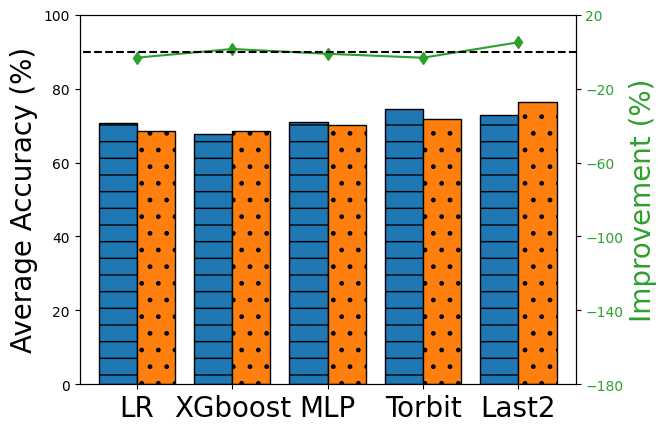

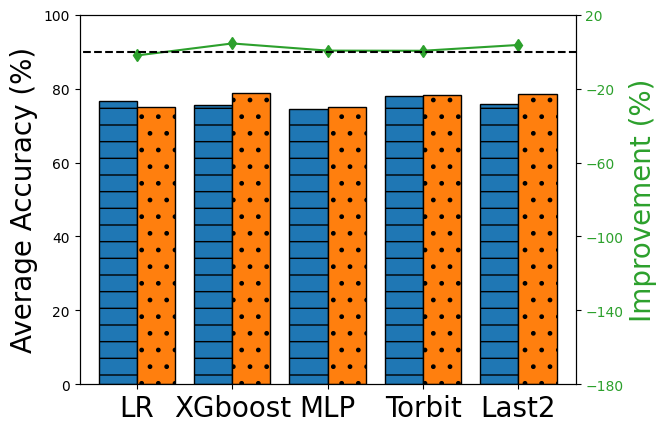

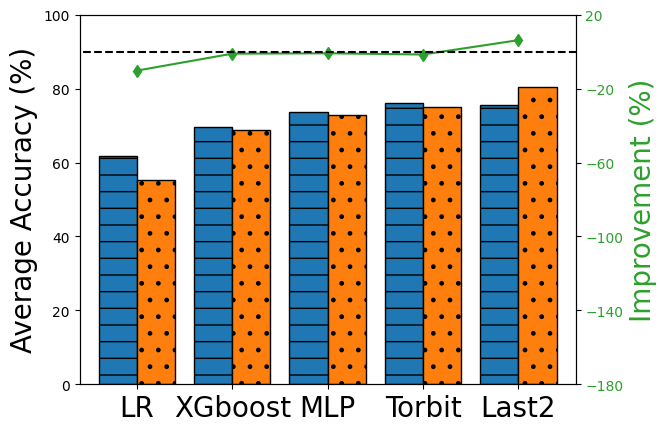

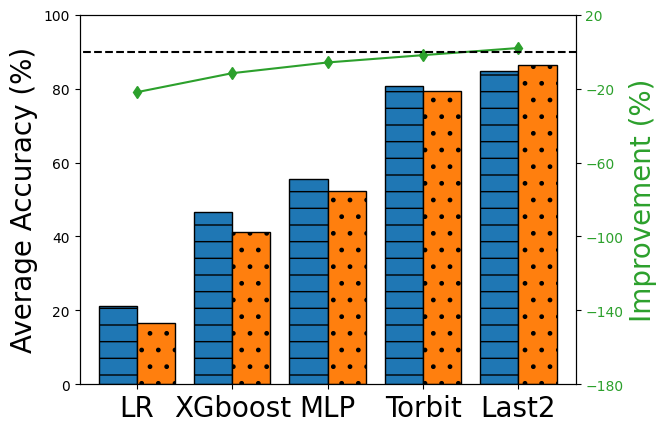

In [336]:
plot_runtime_predict([0.707789829,0.684670447,0.676492771,0.686208826,0.710644345,0.702321837,0.743519496,0.719000961,0.727657002,0.764528979])
plot_runtime_predict([0.76563103,0.749824339,0.754715154,0.788173985,0.746123539,0.750222168,0.779226215,0.782944346,0.757565785,0.784958189])
plot_runtime_predict([0.616333934,0.553080712,0.696262076,0.688542366,0.736126672,0.729599379,0.762218207,0.750342698,0.75697418,0.804005823])
plot_runtime_predict([0.213024082,0.166298629,0.466546797,0.412183114,0.554877823,0.522433906,0.807604184,0.79222452,0.848444362,0.865136978])

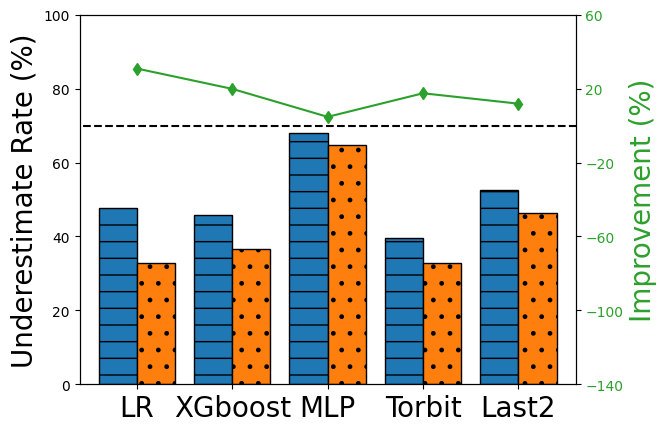

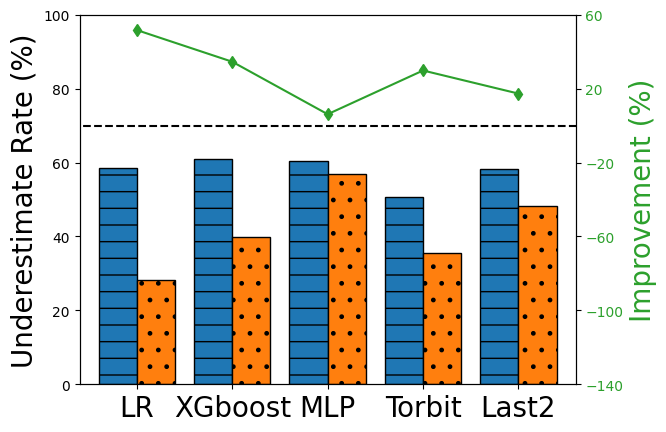

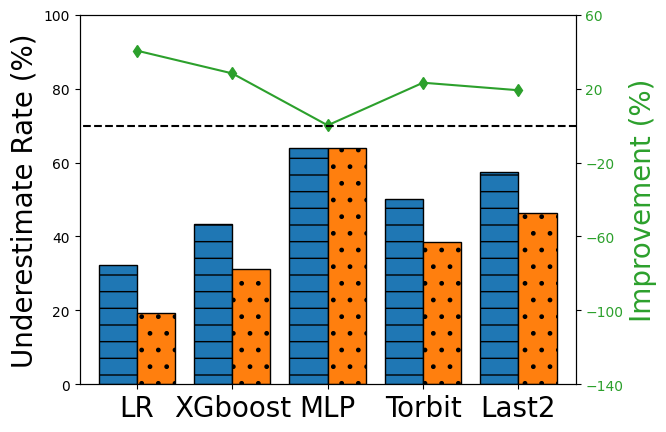

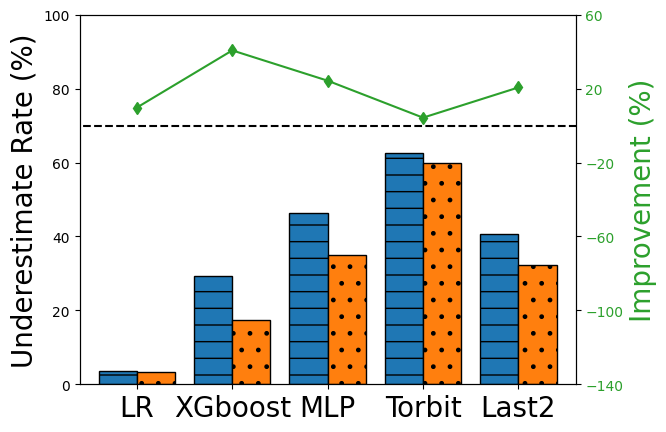

In [343]:
plot_runtime_predict([0.475761851,0.328954411,0.456770301,0.366110381,0.679219579,0.647237224,0.396324949,0.327073096,0.525438298,0.463208939])
plot_runtime_predict([0.58410319,0.282377549,0.609377724,0.398989019,0.605194352,0.568066934,0.507756667,0.356458079,0.583405961,0.482482134])
plot_runtime_predict([0.323222589,0.192208543,0.433035392,0.310815043,0.640325728,0.639482497,0.500421616,0.384392994,0.574505505,0.464716795])
plot_runtime_predict([0.036475578,0.032922882,0.294129683,0.174509877,0.462724601,0.350396191,0.624865146,0.598192032,0.405546669,0.321918827])

In [ ]:
plot_runtime_predict([0.7041,0.6819,0.6692,0.6778,0.7038,0.7153,0.733,0.7131,0.6909,0.7519])
plot_runtime_predict([0.7497,0.7419,0.7394,0.7509,0.7297,0.7358,0.7602,0.7439,0.7321,0.7555])
plot_runtime_predict([0.6177,0.582,0.6934,0.6853,0.6975,0.7369,0.7479,0.7147,0.7244,0.793])
plot_runtime_predict([0.2111,0.1892,0.389,0.3105,0.695,0.4738,0.7921,0.7944,0.8237,0.8514])

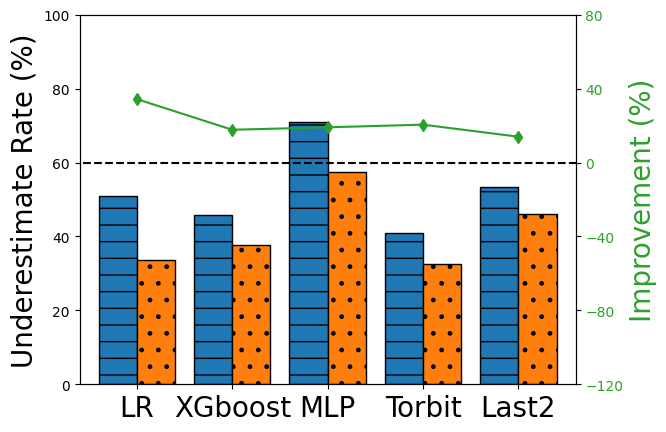

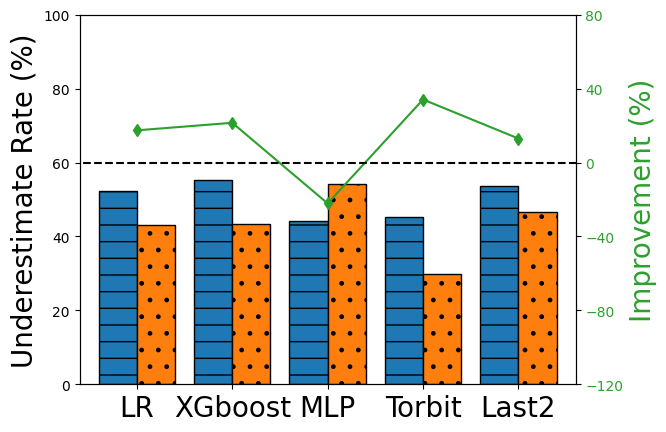

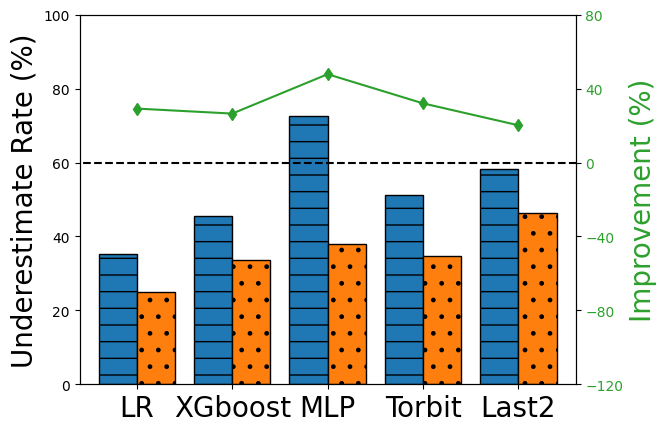

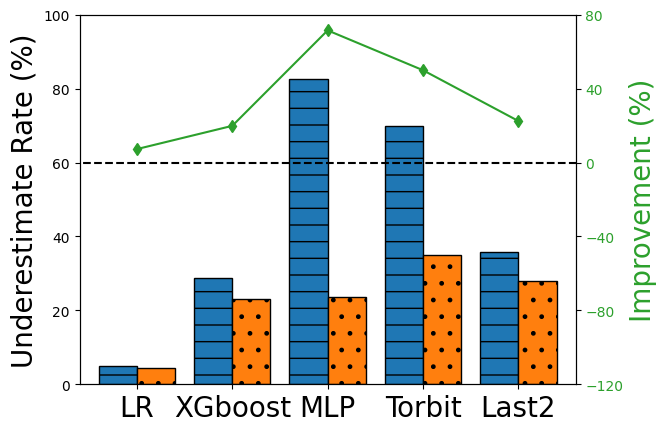

In [216]:
plot_runtime_predict([0.5105,0.3354,0.458,0.3768,0.7108,0.5754,0.41,0.3260,0.535,0.4603,])
plot_runtime_predict([0.5232,0.4321,0.5517,0.4331,0.443,0.5411,0.4531,0.2986,0.5368,0.4671,])
plot_runtime_predict([0.3536,0.2504,0.4566,0.3357,0.7265,0.3793,0.5111,0.3475,0.5812,0.4641,])
plot_runtime_predict([0.0482,0.0447,0.2872,0.2302,0.8265,0.2355,0.6997,0.3503,0.3589,0.2783,])

# Status dist over size, runtime

In [321]:
def calc_status_over(data, a, b,status=["Pass", "Failed", "Killed"], col="run_time", col2="state"):
    data = data.copy()
#     data["core_hour"] = data.apply(lambda row: row[col]*row["run_time"], axis=1)
    data = data[data[col]!=0]
#     data = data.sort_values(col)
#     plt.plot(data[col], data["core_hour"])
#     plt.xscale("log")
    data_a = data[data[col]<=a]
    data_b = data[(data[col]>a) & (data[col]<=b)]
    data_c = data[data[col]>b]
    qs = [[] for _ in range(3)]
    for index, d in enumerate([data_a, data_b, data_c]):
        q = d[col2].value_counts(normalize=True) * 100
        for i in status:
            if i not in q:
                qs[index].append(0)
            else:
                qs[index].append(q[i])
    return qs

In [295]:
calc_status_over(bw_df, 22636*32//10, 3*22636*32//10, col2="new_status")

[[67.00871394770195, 7.114774934564608, 25.876511117733443],
 [47.096774193548384, 1.2903225806451613, 51.61290322580645],
 [67.36842105263158, 4.2105263157894735, 28.421052631578945]]

In [294]:
calc_status_over(mira_df_2, 49152*16//10, 3*49152*16//10,col2="new_status")

[[70.73658165207462, 8.288922725542443, 20.974495622382946],
 [58.49765258215962, 19.342723004694836, 22.15962441314554],
 [65.33957845433255, 13.817330210772832, 20.843091334894616]]

In [296]:
calc_status_over(philly_df, 1, 8, col="gpu_num")

[[67.6981199964019, 24.18899801287136, 8.112881990726734],
 [26.483950799689726, 58.283160344254426, 15.232888856055848],
 [20.27687296416938, 63.27361563517915, 16.449511400651463]]

In [297]:
calc_status_over(hl_df, 1, 8, col="gpu_num")

[[57.48994568597371, 21.9826692648949, 20.527385049131393],
 [45.79295637720701, 22.9936964907329, 31.213347132060086],
 [36.688236653570605, 13.173099144904091, 50.13866420152531]]

In [315]:
calc_status_over(bw_df, 3600, 3600*24, col2="new_status")

[[77.38959920341603, 10.274344986835594, 12.336055809748379],
 [53.084873994352385, 5.706217699397944, 41.20890830624967],
 [59.617663499161544, 2.222470653996646, 38.15986584684181]]

In [322]:
calc_status_over(mira_df_2, 3600, 3600*24, col2="new_status")

[[76.86672302056917, 15.995115995115993, 7.13816098431483],
 [64.34694050751082, 2.5799881184757703, 33.07307137401341],
 [2.564102564102564, 0, 97.43589743589743]]

In [323]:
calc_status_over(philly_df, 3600, 3600*24,)

[[60.49915507604315, 32.72672126175311, 6.774123662203735],
 [60.98551323079041, 22.593854306458827, 16.420632462750763],
 [39.69247516668935, 35.07960266702953, 25.227922166281125]]

In [324]:
calc_status_over(hl_df, 3600, 3600*24, )

[[65.05428807036834, 15.161489829576691, 19.784222100054976],
 [64.9508786495088, 4.849868548498685, 30.199252801992525],
 [49.60118168389956, 8.951255539143279, 41.44756277695716]]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(67.00871394770195, 70.73658165207462, 67.6981199964019, 57.48994568597371) (7.114774934564608, 8.288922725542443, 24.18899801287136, 21.9826692648949) (25.876511117733443, 20.974495622382946, 8.112881990726734, 20.527385049131393)
(47.096774193548384, 58.49765258215962, 26.483950799689726, 45.79295637720701) (1.2903225806451613, 19.342723004694836, 58.283160344254426, 22.9936964907329) (51.61290322580645, 22.15962441314554, 15.232888856055848, 31.213347132060086)
(67.36842105263158, 65.33957845433255, 20.27687296416938, 36.688236653570605) (4.2105263157894735, 13.817330210772832, 63.27361563517915, 13.173099144904091) (28.421052631578945, 20.843091334894616, 16.449511400651463, 50.13866420152531)


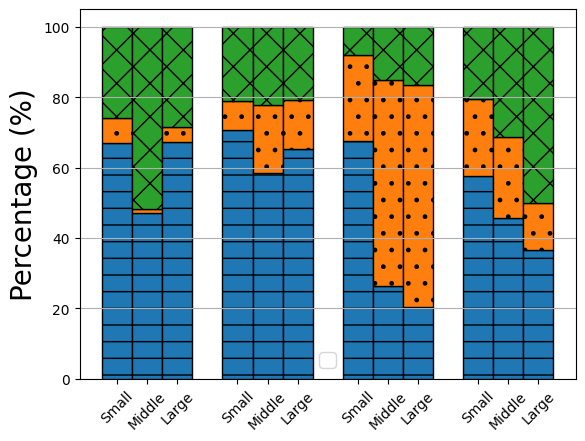

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(77.38959920341603, 76.86672302056917, 60.49915507604315, 65.05428807036834) (10.274344986835594, 15.995115995115993, 32.72672126175311, 15.161489829576691) (12.336055809748379, 7.13816098431483, 6.774123662203735, 19.784222100054976)
(53.084873994352385, 64.34694050751082, 60.98551323079041, 64.9508786495088) (5.706217699397944, 2.5799881184757703, 22.593854306458827, 4.849868548498685) (41.20890830624967, 33.07307137401341, 16.420632462750763, 30.199252801992525)
(59.617663499161544, 2.564102564102564, 39.69247516668935, 49.60118168389956) (2.222470653996646, 0, 35.07960266702953, 8.951255539143279) (38.15986584684181, 97.43589743589743, 25.227922166281125, 41.44756277695716)


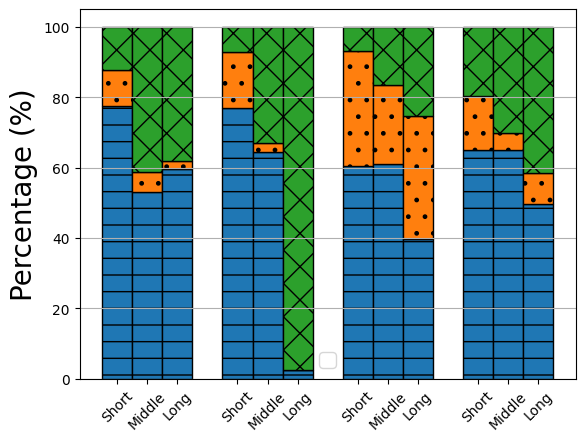

In [327]:
def plot_status_over(run_time=False):
    
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if run_time:
        bw = [[77.38959920341603, 10.274344986835594, 12.336055809748379],
 [53.084873994352385, 5.706217699397944, 41.20890830624967],
 [59.617663499161544, 2.222470653996646, 38.15986584684181]]
        mira = [[76.86672302056917, 15.995115995115993, 7.13816098431483],
 [64.34694050751082, 2.5799881184757703, 33.07307137401341],
 [2.564102564102564, 0, 97.43589743589743]]
        philly = [[60.49915507604315, 32.72672126175311, 6.774123662203735],
 [60.98551323079041, 22.593854306458827, 16.420632462750763],
 [39.69247516668935, 35.07960266702953, 25.227922166281125]]
        hl = [[65.05428807036834, 15.161489829576691, 19.784222100054976],
 [64.9508786495088, 4.849868548498685, 30.199252801992525],
 [49.60118168389956, 8.951255539143279, 41.44756277695716]]
        z = ["Short","Middle","Long"]

    else:
        bw = [[67.00871394770195, 7.114774934564608, 25.876511117733443],
     [47.096774193548384, 1.2903225806451613, 51.61290322580645],
     [67.36842105263158, 4.2105263157894735, 28.421052631578945]]
        mira = [[70.73658165207462, 8.288922725542443, 20.974495622382946],
     [58.49765258215962, 19.342723004694836, 22.15962441314554],
     [65.33957845433255, 13.817330210772832, 20.843091334894616]]
        philly = [[67.6981199964019, 24.18899801287136, 8.112881990726734],
     [26.483950799689726, 58.283160344254426, 15.232888856055848],
     [20.27687296416938, 63.27361563517915, 16.449511400651463]]
        hl = [[57.48994568597371, 21.9826692648949, 20.527385049131393],
     [45.79295637720701, 22.9936964907329, 31.213347132060086],
     [36.688236653570605, 13.173099144904091, 50.13866420152531]]
        z = ["Small","Middle","Large"]
        status = {
            'Small': (15.61, 12.22, 5.68, 0.3),
            'Middle': (143.62, 50.96, 15.84, 0.4),
            'Large': (53.33, 42.83, 13.26, 0.53),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    colors=['#1f77b4', '#ff7f0e', '#2ca02c']
    for i, (measurement) in enumerate(zip(bw, mira, philly, hl)):
        offset = width * multiplier
        prev = np.array([0.0]*4)
        print(*zip(*measurement))
        for k, j in enumerate(zip(*measurement)):
            rects = ax.bar(x + offset, j, width, hatch=hatches[k], color=colors[k], edgecolor='black', bottom=prev)
            prev += np.array(j)
#         ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Percentage (%)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(np.delete(np.arange(16)*0.25, [3,7,11,15]), 4*z, fontsize=10, rotation=45)
#     ax.set_xticks(x + width, traces, fontsize=15)

#     ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.show()
plot_status_over()
plot_status_over(True)

# wait time

In [396]:
def plot_size_wait(data, a, b, col="cpu_num"):
    data = data.copy()
#     data["core_hour"] = data.apply(lambda row: row[col]*row["run_time"], axis=1)
    data = data[data[col]!=0]
#     data = data.sort_values(col)
#     plt.plot(data[col], data["core_hour"])
#     plt.xscale("log")
    data_a = data[data[col]<=a]
    data_b = data[(data[col]>a) & (data[col]<=b)]
    data_c = data[data[col]>b]
    s = 3600
    print([data_a["wait_time"].mean()/s, data_b["wait_time"].mean()/s, data_c["wait_time"].mean()/s])

In [397]:
plot_size_wait(bw_df, 22636*32//10, 3*22636*32//10)

[15.610580829115587, 143.61881720430108, 53.33277777777778]


In [398]:
plot_size_wait(mira_df_2, 49152*16//10, 3*49152*16//10)

[12.21851212568202, 50.95563719353156, 42.83301327088213]


In [399]:
plot_size_wait(philly_df, 1, 8, col="gpu_num")

[5.6783026495957145, 15.844315164349887, 13.263183134274339]


In [400]:
plot_size_wait(hl_df, 1, 8, col="gpu_num")

[0.325380278802788, 0.38627875170306253, 0.5382344387951622]


In [401]:
plot_size_wait(bw_df, 3600, 3600*24, col="run_time")

[13.285402474799616, 24.828667705613867, 35.33365300912987]


In [402]:
plot_size_wait(mira_df_2, 3600, 3600*24, col="run_time")

[7.2123573672291625, 20.935813412920684, 75.19285612535613]


In [403]:
plot_size_wait(philly_df, 3600, 3600*24, col="run_time")

[4.97759122049386, 8.841229740889853, 44.14692331534147]


In [404]:
plot_size_wait(hl_df, 3600, 3600*24, col="run_time")

[0.20340148547736853, 1.6412862644711959, 1.5331307237813885]


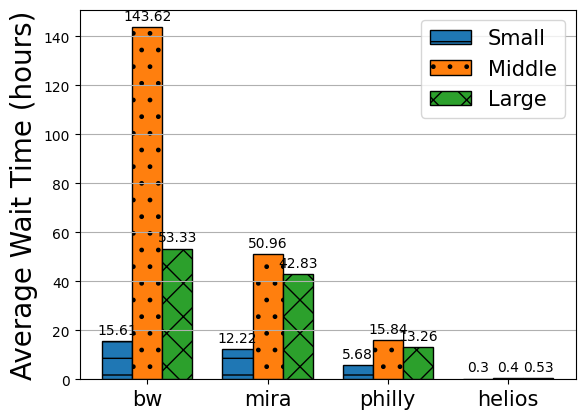

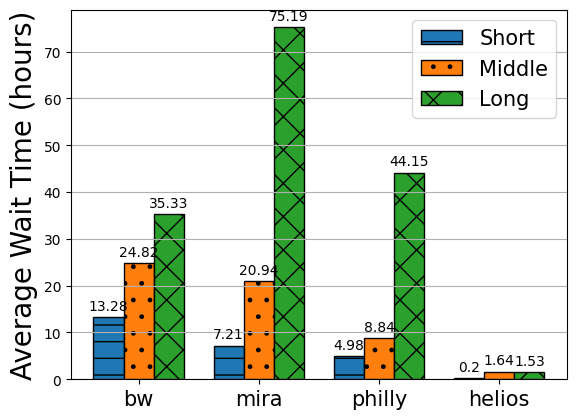

In [228]:
def plot_size_wait_figure(run_time=False):
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if run_time:
        status = {
            'Short': (13.28, 7.21, 4.98, 0.20),
            'Middle': (24.82, 20.94, 8.84, 1.64),
            'Long': (35.33, 75.19, 44.15, 1.53),

        }
    else:
        status = {
            'Small': (15.61, 12.22, 5.68, 0.3),
            'Middle': (143.62, 50.96, 15.84, 0.4),
            'Large': (53.33, 42.83, 13.26, 0.53),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    for i, (attribute, measurement) in enumerate(status.items()):
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute, hatch=hatches[i], edgecolor='black')
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Average Wait Time (hours)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(x + width, traces, fontsize=15)
    ax.legend(fontsize=15)
#     ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.show()
plot_size_wait_figure()
plot_size_wait_figure(True)

# job geometry groups

In [187]:
from collections import defaultdict
from bisect import bisect
def plot_groups(data, col):
    d = {}
    g = {}
    for index, row in data.iterrows():
        if row["user"] not in d:
            d[row["user"]] = defaultdict(list)
            g[row["user"]] = defaultdict(list)
        d[row["user"]][row[col]].append([row["run_time"], row[col]*row["run_time"]])
    
    for i in d:
        for j in d[i]:
            d[i][j].sort()
            for k in range(1, len(d[i][j])):
                d[i][j][k][1] += d[i][j][k-1][1]
            index = 0
            while index < len(d[i][j]):
                new_index = bisect(d[i][j], [d[i][j][index][0]*1.2, 0])
                if index >= 1:
                    g[i][j].append([d[i][j][index], d[i][j][new_index-1][1]-d[i][j][index-1][1]])
                else:
                    g[i][j].append([d[i][j][index], d[i][j][new_index-1][1]])
                index = new_index
    s = 0
    a = [0]*10
    for i in g:
        t = 0
        for j in g[i]:
            g[i][j].sort(key=lambda x:-x[1])
            t += len(g[i][j])
            for k in range(10):
                if k < len(g[i][j]):
                    a[k] += g[i][j][k][1]
        s += t
    for i in range(1, 10):
        a[i] += a[i-1]
    print(list(np.array(a)/(data[col]*data["run_time"]).sum()))
#         print(i, t)
    print(s/len(g), len(data)/len(set(data["user"])))

In [188]:
plot_groups(mira_df_2, "cpu_num")

[0.6918350088912488, 0.8533482445948762, 0.921081711512026, 0.9533918131448507, 0.9710197995695022, 0.9810033596267114, 0.9872495542508333, 0.9916599140171835, 0.9944420135092896, 0.9964546220465884]
15.15 140.675


In [189]:
plot_groups(bw_df, "cpu_num")

[0.6194840399786984, 0.7729370934866642, 0.8425218118648454, 0.8906973579175446, 0.9238788917664792, 0.9479635533005115, 0.9659413769736639, 0.9788211703158228, 0.9842781315514204, 0.987734831866639]
40.14468864468864 656.7326007326008


In [190]:
plot_groups(philly_df, "gpu_num")

[0.28569096620357964, 0.4384045247520146, 0.545916628344075, 0.6263372405355048, 0.6897181499719287, 0.7429051624867624, 0.7877784887121456, 0.8257544812862695, 0.8583802658301265, 0.8858856158005057]
32.275862068965516 475.91222570532915


In [191]:
plot_groups(hl_df, "gpu_num")

[0.3412589175944932, 0.5253771632298813, 0.6401852895114848, 0.7268169396811582, 0.7918618794877094, 0.8394237557838181, 0.8733033543091736, 0.9005927265133411, 0.9214560290971314, 0.9370205635505027]
55.42622950819672 669.5040983606557


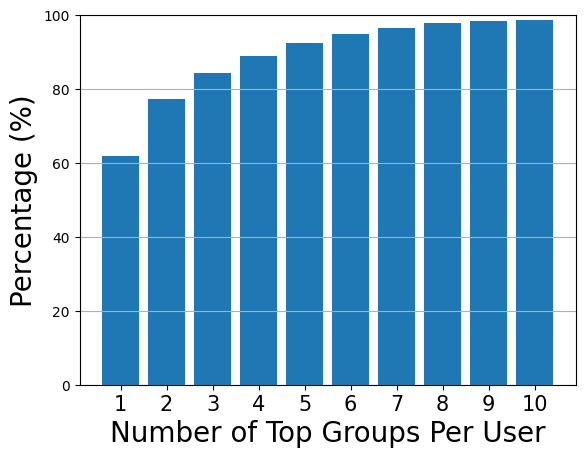

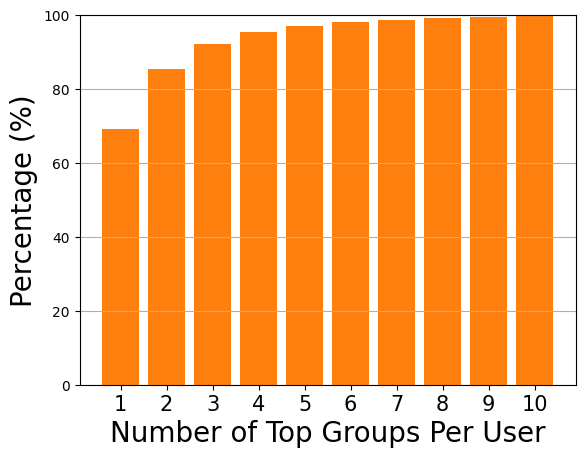

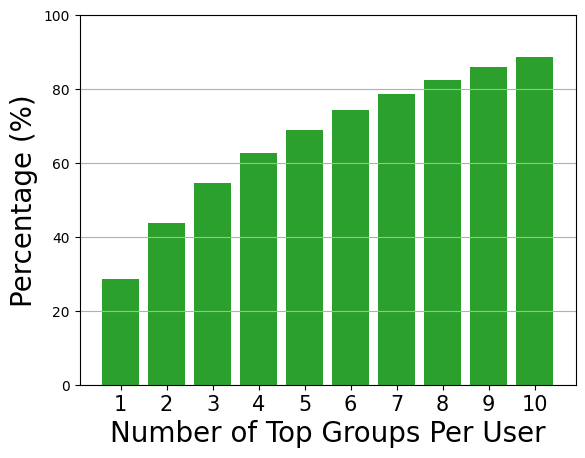

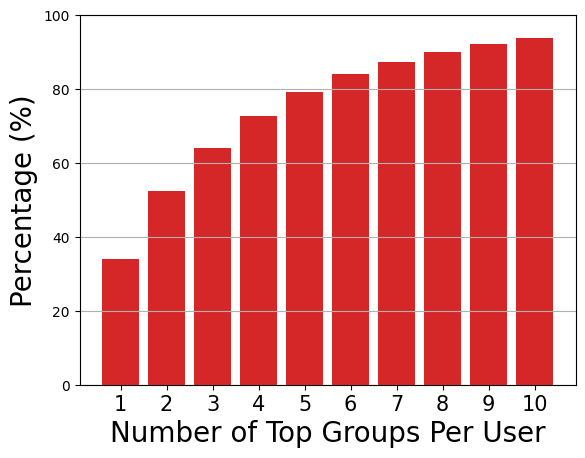

In [201]:
def plot_123(a, color):
    plt.grid(axis="y")

    plt.bar(list(range(1, 11)), np.array(a)*100, color=color)
    plt.ylabel('Percentage (%)', fontsize=20)
    plt.xlabel('Number of Top Groups Per User', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    plt.xticks(list(range(1, 11)), list(range(1, 11)), fontsize=15)
#     plt.legend(fontsize=15)
    plt.ylim(0, 100)
    plt.show()
    
a =[0.6194840399786984, 0.7729370934866642, 0.8425218118648454, 0.8906973579175446, 0.9238788917664792, 0.9479635533005115, 0.9659413769736639, 0.9788211703158228, 0.9842781315514204, 0.987734831866639]
b =[0.6918350088912488, 0.8533482445948762, 0.921081711512026, 0.9533918131448507, 0.9710197995695022, 0.9810033596267114, 0.9872495542508333, 0.9916599140171835, 0.9944420135092896, 0.9964546220465884]
c =[0.28569096620357964, 0.4384045247520146, 0.545916628344075, 0.6263372405355048, 0.6897181499719287, 0.7429051624867624, 0.7877784887121456, 0.8257544812862695, 0.8583802658301265, 0.8858856158005057]
d = [0.3412589175944932, 0.5253771632298813, 0.6401852895114848, 0.7268169396811582, 0.7918618794877094, 0.8394237557838181, 0.8733033543091736, 0.9005927265133411, 0.9214560290971314, 0.9370205635505027]
x = [a,b,c,d]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

for i, j in zip(x, colors):
    plot_123(i,j)    
    

# Who dominates system utilization

In [122]:
# bw-cpu: <32, 32~192, >192
# mira: 8192.0, 16384.0
# philly: =1, >1
# helios: =1, >1
bw_df["gpu_num"].quantile(100/100)

4228.0

In [ ]:
def plot_cdf_util(x, y, xlabel, ylabel="Frequency (%)",color="", linestyle="--"):
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    #y, x = np.histogram(y, bins=bins, range=None, normed=None, weights=None, density=None)
#     y = [1]*len(x)
#     cdf = np.cumsum(y)
#     cdf = 100*cdf/cdf[-1]
    y = np.array(y)
    cdf = 100*y/y.sum()
    if color:
        plt.plot(x, cdf, linestyle=linestyle, linewidth=5, color=color)
    else:
        plt.plot(x, cdf, linestyle=linestyle, linewidth=5)
    plt.xlabel(xlabel, fontsize=20)
    plt.ylabel(ylabel, fontsize=20)
    plt.margins(0)
    plt.ylim(0, 100)
    plt.grid(True)

In [149]:
def plot_size_util(data, a, b, col="cpu_num"):
    data = data.copy()
    data["core_hour"] = data.apply(lambda row: row[col]*row["run_time"], axis=1)
    data = data[data[col]!=0]
#     data = data.sort_values(col)
#     plt.plot(data[col], data["core_hour"])
#     plt.xscale("log")
    data_a = data[data[col]<=a]
    data_b = data[(data[col]>a) & (data[col]<=b)]
    data_c = data[data[col]>b]
    s = data["core_hour"].sum()
    print(data_a["core_hour"].sum()/s, data_b["core_hour"].sum()/s, data_c["core_hour"].sum()/s)
    
def plot_runtime_util(data, a, b, col="cpu_num"):
    data = data.copy()
    data["core_hour"] = data.apply(lambda row: row[col]*row["run_time"], axis=1)
    data = data[data[col]!=0]
#     data = data.sort_values(col)
#     plt.plot(data[col], data["core_hour"])
#     plt.xscale("log")
    data_a = data[data["run_time"]<=a]
    data_b = data[(data["run_time"]>a) & (data["run_time"]<=b)]
    data_c = data[data["run_time"]>b]
    s = data["core_hour"].sum()
    print(data_a["core_hour"].sum()/s, data_b["core_hour"].sum()/s, data_c["core_hour"].sum()/s)

## cores

In [133]:
plot_size_util(bw_df, 22636*32//10, 3*22636*32//10)

0.8621423238064212 0.04481752861242556 0.09304014758115327


In [134]:
plot_size_util(mira_df_2, 49152*16//10, 3*49152*16//10)

0.3411881311390447 0.4663087544440705 0.1925031144168848


In [119]:
plot_size_util(philly_df, 1, 8, col="gpu_num")

0.18481045448312355 0.6886604459099681 0.12652909960690828


In [120]:
plot_size_util(hl_df, 1, 8, col="gpu_num")

0.04568505506303716 0.37927467415543625 0.5750402707815265


## run time

In [157]:
plot_runtime_util(bw_df, 3600, 3600*24)

0.017430919037431256 0.6207234657441186 0.3618456152184501


In [158]:
plot_runtime_util(mira_df_2, 3600, 3600*24)

0.047029823384298675 0.8124005341263553 0.14056964248934609


In [153]:
plot_runtime_util(philly_df, 3600, 3600*24, col="gpu_num")

0.011747226083204582 0.14327646330814822 0.8449763106086472


In [154]:
plot_runtime_util(hl_df, 3600, 3600*24,col="gpu_num")

0.01967755349409303 0.2228495442384417 0.7574729022674653


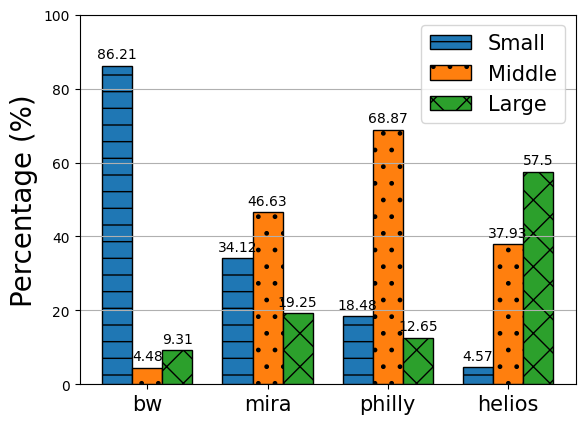

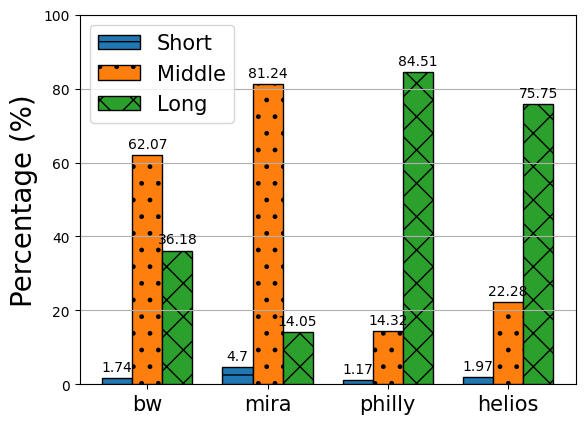

In [160]:
def plot_percentage_corehour(run_time=False):
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if run_time:
        status = {
            'Short': (1.74, 4.70, 1.17, 1.97),
            'Middle': (62.07, 81.24, 14.32, 22.28),
            'Long': (36.18, 14.05, 84.51, 75.75),

        }
    else:
        status = {
            'Small': (86.21, 34.12, 18.48, 4.57),
            'Middle': (4.48, 46.63, 68.87, 37.93),
            'Large': (9.31, 19.25, 12.65, 57.50),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    for i, (attribute, measurement) in enumerate(status.items()):
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute, hatch=hatches[i], edgecolor='black')
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Percentage (%)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(x + width, traces, fontsize=15)
    ax.legend(fontsize=15)
    ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.show()
plot_percentage_corehour()
plot_percentage_corehour(True)

# Job status distribution.

In [284]:
a = hl_df.groupby("state")["core_hour"].sum()
a/a.sum()*100

state
Failed     6.635605
Killed    40.943660
Pass      52.420735
Name: core_hour, dtype: float64

In [31]:
hl_df["state"].replace({ 'COMPLETED' : "Pass", 'FAILED' : "Failed", 'CANCELLED' : "Killed", "NODE_FAIL":"Failed","TIMEOUT":"Failed"}, inplace=True)

In [1445]:
a = philly_df.groupby("state")["core_hour"].sum()
a/a.sum()*100

state
Failed    33.405257
Killed    32.818374
Pass      33.776369
Name: core_hour, dtype: float64

In [287]:
a = bw_df.groupby("new_status")["node_hour"].sum()
a/a.sum()*100

new_status
Failed     4.905878
Killed    41.454704
Pass      53.639418
Name: node_hour, dtype: float64

In [32]:
bw_df["new_status"].replace({ 'NM' : "Pass", 'SIGABRT' : "Failed", 'SIGTERM' : "Killed", 'SIGKILL' : "Killed", "SIGSEGV":"Failed","Unknown":"Failed"}, inplace=True)

In [289]:
a = mira_df_2.groupby("new_status")["node_hour"].sum()
a/a.sum()*100

new_status
Failed     5.769631
Killed    37.286633
Pass      56.943736
Name: node_hour, dtype: float64

In [33]:
mira_df_2["new_status"].replace({ 'NM' : "Pass", 'SIGABRT' : "Failed", 'SIGTERM' : "Killed", 'SIGKILL' : "Killed", "SIGSEGV":"Failed","Unknown":"Failed"}, inplace=True)

In [1435]:
def percentage_of_status(data, col="state"):
    return data[col].value_counts(normalize=True) * 100

In [1436]:
percentage_of_status(hl_df)

COMPLETED    64.724931
CANCELLED    21.154635
FAILED       14.064729
NODE_FAIL     0.028771
TIMEOUT       0.026935
Name: state, dtype: float64

In [1437]:
percentage_of_status(philly_df)

Pass      59.581335
Failed    30.901223
Killed     9.517442
Name: state, dtype: float64

In [1453]:
percentage_of_status(bw_df, col="new_status")

NM         64.995426
SIGTERM    24.124314
Unknown     4.428908
SIGKILL     3.523102
No          2.390288
SIGABRT     0.436449
SIGSEGV     0.101513
Name: new_status, dtype: float64

In [1454]:
percentage_of_status(mira_df_2, col="new_status")

NM         70.055092
SIGTERM    20.939222
Unknown     3.638706
No          2.967834
SIGSEGV     1.501688
SIGABRT     0.808601
SIGKILL     0.088857
Name: new_status, dtype: float64

In [1477]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


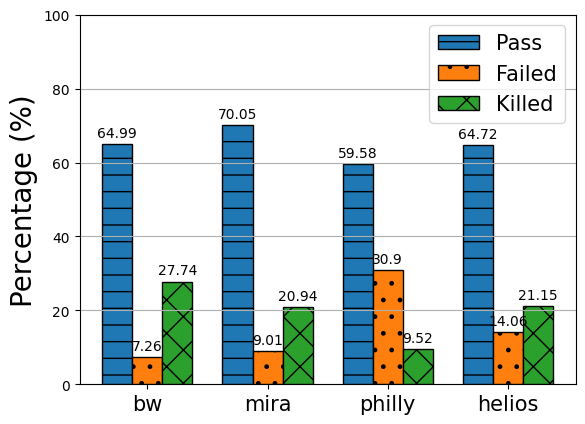

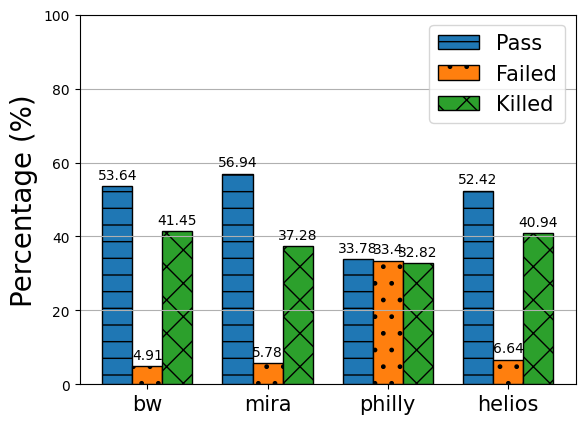

In [371]:


from matplotlib import pyplot as plt
def plot_percentage_status(job_counts=True):
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if job_counts:
        status = {
            'Pass': (64.99, 70.05, 59.58, 64.72),
            'Failed': (7.26, 9.01, 30.90, 14.06),
            'Killed': (27.74, 20.94, 9.52, 21.15),

        }
    # core hours
    else:
        status = {
            'Pass': (53.64, 56.94, 33.78, 52.42),
            'Failed': (4.91, 5.78, 33.40, 6.64),
            'Killed': (41.45, 37.28, 32.82, 40.94),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    for i, (attribute, measurement) in enumerate(status.items()):
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute, hatch=hatches[i], edgecolor='black')
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Percentage (%)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(x + width, traces, fontsize=15)
    ax.legend(fontsize=15)
#     plt.legend(loc="lower left", )
    ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.show()
plot_percentage_status()
plot_percentage_status(False)

# mean runtime of status

In [117]:
def runtime_of_status(data, col="state", col2="run_time"):
    print(data.groupby(col)[col2].mean())
runtime_of_status(bw_df, col="new_status")
runtime_of_status(mira_df_2,col="new_status")
runtime_of_status(philly_df)
runtime_of_status(hl_df)

new_status
Failed    14789.555892
Killed    45974.495224
Pass      27727.047692
Name: run_time, dtype: float64
new_status
Failed     2749.400598
Killed    13483.073104
Pass       7120.680873
Name: run_time, dtype: float64
state
Failed    25828.329056
Killed    85791.817081
Pass      12825.084806
Name: run_time, dtype: float64
state
Failed     5979.821737
Killed    15762.824701
Pass       5775.136077
Name: run_time, dtype: float64


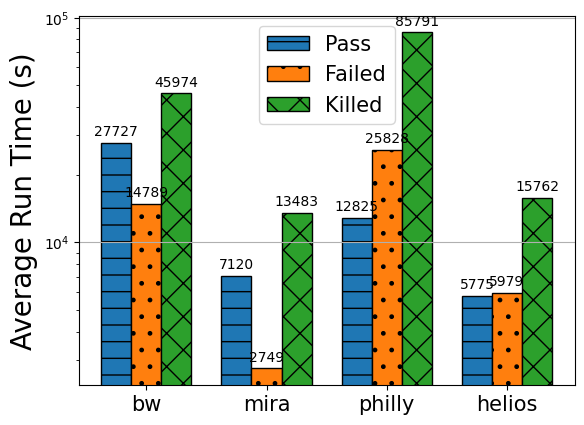

In [119]:
def plot_runtime_of_status(runtime=False):
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if runtime:
        status = {
            'Pass': (27727, 7120, 12825, 5775),
            'Failed': (14789, 2749, 25828, 5979),
            'Killed': (45974, 13483, 85791, 15762),

        }
    # core hours
    else:
        status = {
            'Pass': (53.64, 56.94, 33.78, 52.42),
            'Failed': (4.91, 5.78, 33.40, 6.64),
            'Killed': (41.45, 37.28, 32.82, 40.94),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    for i, (attribute, measurement) in enumerate(status.items()):
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute, hatch=hatches[i], edgecolor='black')
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Average Run Time (s)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(x + width, traces, fontsize=15)
    ax.legend(fontsize=15)
#     plt.legend(loc="lower left", )
#     ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.yscale("log")
    plt.show()
# plot_percentage_status()
plot_runtime_of_status(True)

In [411]:
runtime_of_status(bw_df, col2="cpu_num", col="new_status")
runtime_of_status(mira_df_2,col2="cpu_num",col="new_status")
runtime_of_status(philly_df,col2="gpu_num",)
runtime_of_status(hl_df,col2="gpu_num")

new_status
Failed    32
Killed    64
Pass      32
Name: cpu_num, dtype: int64
new_status
Failed    16384.0
Killed     8192.0
Pass       8192.0
Name: cpu_num, dtype: float64
state
Failed    1
Killed    1
Pass      1
Name: gpu_num, dtype: int64
state
Failed    1
Killed    1
Pass      0
Name: gpu_num, dtype: int64


In [428]:
def runtime_of_status_per_user(data, col="state"):
    data =data.copy()
    
    rows = list(data.groupby("user").count().sort_values(by="job", ascending=False).index[:10])
#     print(data.groupby("user")["run_time"].median())
    z = [data.groupby("user").get_group(i) for i in rows]
    for i in z:
        print(i.groupby(col)["run_time"].median())

# runtime_of_status_per_user(bw_df, col="new_status")
runtime_of_status_per_user(hl_df, col="state")

state
Failed    170.0
Killed    170.0
Pass       93.0
Name: run_time, dtype: float64
state
Failed      2.0
Killed    246.0
Pass        1.0
Name: run_time, dtype: float64
state
Failed    153.0
Killed    379.0
Pass      124.0
Name: run_time, dtype: float64
state
Failed     46.5
Killed    116.0
Pass      116.0
Name: run_time, dtype: float64
state
Failed     86.5
Killed     48.0
Pass      233.0
Name: run_time, dtype: float64
state
Failed     30.0
Killed    207.0
Pass      963.0
Name: run_time, dtype: float64
state
Failed      92.0
Killed     503.0
Pass      1468.0
Name: run_time, dtype: float64
state
Failed      1.0
Killed    152.5
Pass       32.0
Name: run_time, dtype: float64
state
Failed       30.0
Killed     1344.0
Pass      16775.0
Name: run_time, dtype: float64
state
Failed     48.0
Killed    279.0
Pass      445.5
Name: run_time, dtype: float64


In [ ]:

from matplotlib import pyplot as plt
def plot_runtime_status():
    plt.style.use("default")
    traces = ("bw", "mira", "philly", "helios")
    if job_counts:
        status = {
            'Pass': (64.99, 70.05, 59.58, 64.72),
            'Failed': (7.26, 9.01, 30.90, 14.06),
            'Killed': (27.74, 20.94, 9.52, 21.15),

        }
    # core hours
    else:
        status = {
            'Pass': (53.64, 56.94, 33.78, 52.42),
            'Failed': (4.91, 5.78, 33.40, 6.64),
            'Killed': (41.45, 37.28, 32.82, 40.94),

        }

    x = np.arange(len(traces))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots()
    hatches= ["-", ".", "x", "-"]
    for i, (attribute, measurement) in enumerate(status.items()):
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute, hatch=hatches[i], edgecolor='black')
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Percentage (%)', fontsize=20)
#     ax.set_xlabel('Traces', fontsize=20)
#     ax.set_title('Penguin attributes by species')
    ax.set_xticks(x + width, traces, fontsize=15)
    ax.legend(fontsize=15)
#     plt.legend(loc="lower left", )
    ax.set_ylim(0, 100)
    plt.grid(axis="y")
    plt.show()
plot_percentage_status()
plot_percentage_status(False)

In [8]:
# hl_df_data = []
# for index, row in df.iterrows():
#     temp = [row["job_id"], 
#             row["user"],
#             row["vc"],
#             row["state"],
#             row["gpu_num"],
#             row["cpu_num"],
#             row["node_num"],
#             row["submit_time"],
#             row["start_time"]-row["submit_time"],
#             row["end_time"]-row["start_time"],
#             0,
#             row["node_num"]*(row["end_time"]-row["start_time"])]
#     hl_df_data.append(temp)
# hl_df = pd.DataFrame(hl_df_data, columns=columns)

In [531]:
def plot_util(data, total_nodes, key="node_num", color='b'):
    data = data.copy()
    start_time = list(data["submit_time"])[0]
    end_time = list(data["submit_time"])[-1]
    duration = end_time - start_time
    days = int(duration/(24*3600))
    days_usage = [0]*days
    data["start_time"] = data.apply(lambda row: row["submit_time"] + row["wait_time"]-start_time, axis=1)
    data["end_time"] = data.apply(lambda row: row["start_time"] + row["run_time"], axis=1)
    data["start_day"] = data.apply(lambda row: int(row["start_time"]/(24*3600)), axis=1)
    data["end_day"] = data.apply(lambda row: int(row["end_time"]/(24*3600))+1, axis=1)
#     print(data[data["start_day"]==60])
#     print(data[data["start_day"]==90])
    for index, row in data.iterrows():
        for i in range(int(row["start_day"]), int(row["end_day"])):
            if i <len(days_usage):
                days_usage[i] += row[key]*(min(row["end_time"], (i+1)*24*3600)-max(row["start_time"], i*24*3600))
#     for i in range(len(days_usage)):
#         days_usage[i] = min((total_nodes*24*3600), days_usage[i])
#     days_usage = days_usage[10:130]
    print(np.mean(np.array(days_usage)/(total_nodes*24*3600)))
    plt.bar(range(len(days_usage)), 100*np.array(days_usage)/(total_nodes*24*3600), color=color)
    plt.plot([-10, 150], [80]*2, color="black", linestyle="--")
    plt.ylim([0, 100])
    plt.xlim([-5, 121])
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

    plt.xlabel("Time (Days)", fontsize=26)
    plt.ylabel("System Utilization(%)", fontsize=26)

def plot_wait(data, total_nodes, key="node_num", color='b'):
    data = data.copy()
    start_time = list(data["submit_time"])[0]
    end_time = list(data["submit_time"])[-1]
    duration = end_time - start_time
    days = int(duration/(24*3600))
    days_usage = [0]*days
    data["start_time"] = data.apply(lambda row: row["submit_time"] + row["wait_time"]-start_time, axis=1)
    data["end_time"] = data.apply(lambda row: row["start_time"] + row["run_time"], axis=1)
    data["start_day"] = data.apply(lambda row: int(row["start_time"]/(24*3600)), axis=1)
    data["end_day"] = data.apply(lambda row: int(row["end_time"]/(24*3600))+1, axis=1)
    c = [1]*days
    for index, row in data.iterrows():
        if row["start_day"]<days:
            days_usage[row["start_day"]] += row["wait_time"]
            c[row["start_day"]] += 1
#     for i in range(len(days_usage)):
#         days_usage[i] = min((total_nodes*24*3600), days_usage[i])
#     days_usage = days_usage[10:140]
    print(np.mean(np.array(days_usage)/np.array(c)))
    plt.bar(range(len(days_usage)), np.array(days_usage)/np.array(c), color=color)
#     plt.ylim([0, 100])
    plt.xlabel("Time (Days)", fontsize=20)
    plt.ylabel("Average Wait Time (s)", fontsize=20)

222.67535079884215


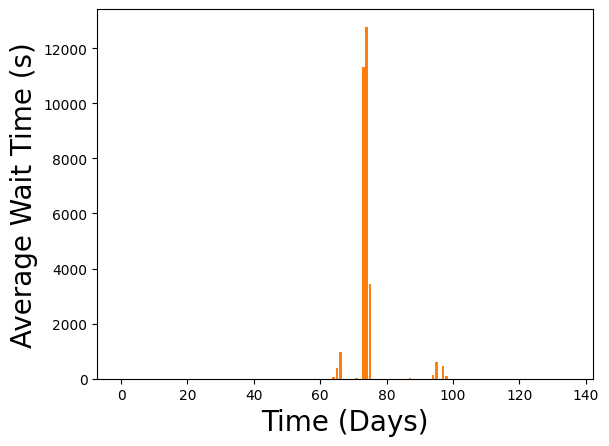

In [369]:
plot_wait(ppppp, 2490, "gpu_num", color='#ff7f0e')

66277.31366003235


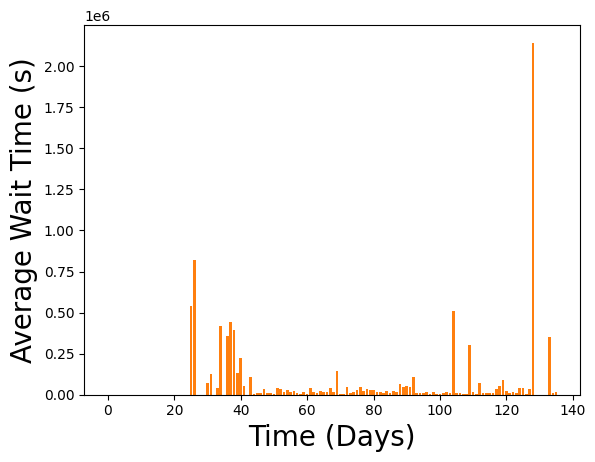

In [370]:
plot_wait(philly_df, 2490, "gpu_num", color='#ff7f0e')

0.4463612165870271


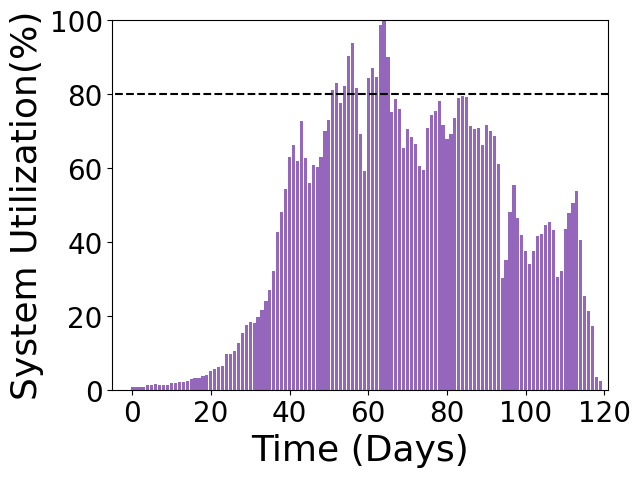

In [524]:
ppppp = pd.read_csv("philly_df_schedule.csv")
plot_util(ppppp, 2490, "gpu_num", color='#9467bd')
#[23364:93542]

0.8495548523715731


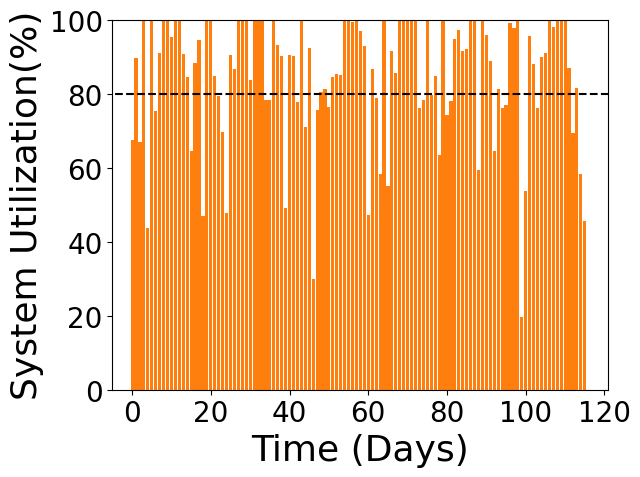

In [525]:
plot_util(mira_df_2, 49152, color='#ff7f0e')

0.8596086415059663


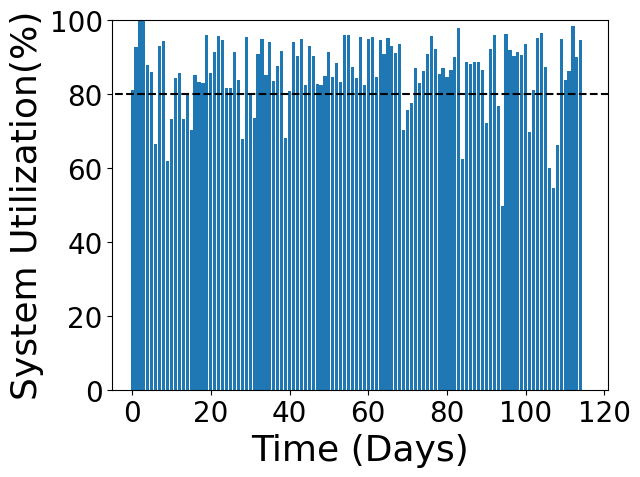

In [529]:
plot_util(bw_df[1000:], 22636*32, "cpu_num", color="#1f77b4")

0.8557046916728749


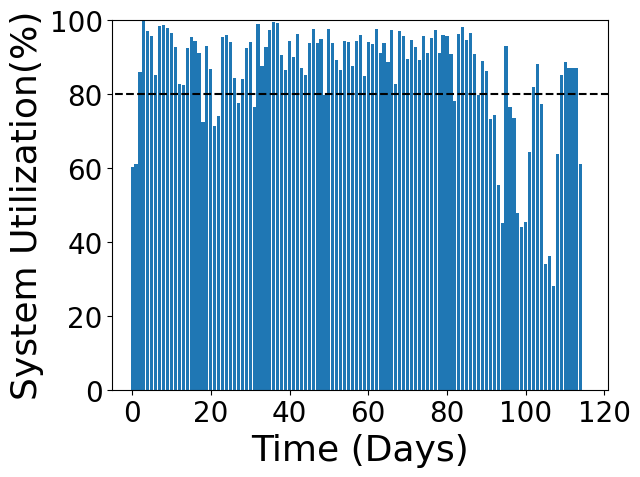

In [530]:
plot_util(bw_df[1000:], 4228, "gpu_num", color="#1f77b4")

0.4451143022708116


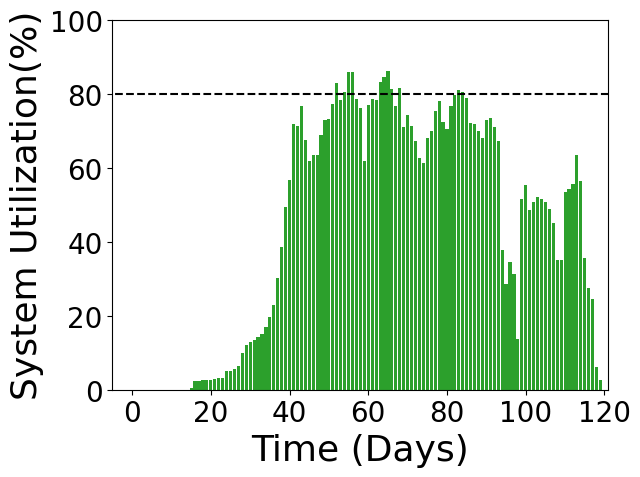

In [528]:
plot_util(philly_df, 2490, "gpu_num", color='#2ca02c')

0.7857616520304235


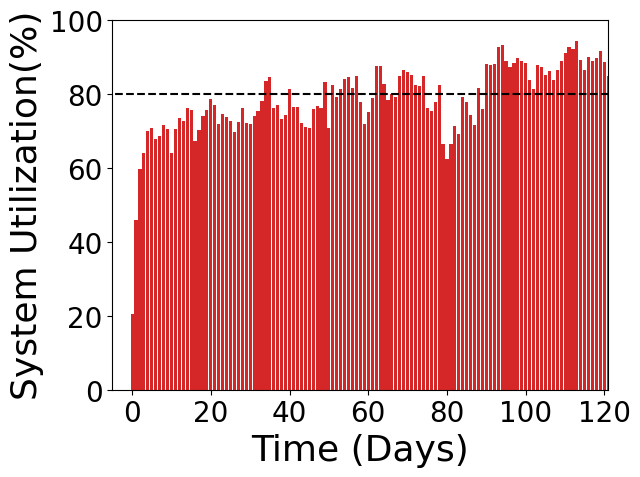

In [532]:
plot_util(hl_df, np.array(gpu_num_total[-123:]), "gpu_num", color='#d62728')

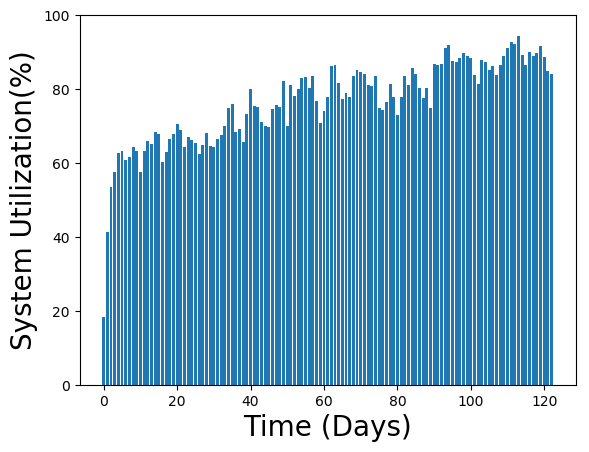

In [1399]:
plot_util(hl_df, 1080, "gpu_num")

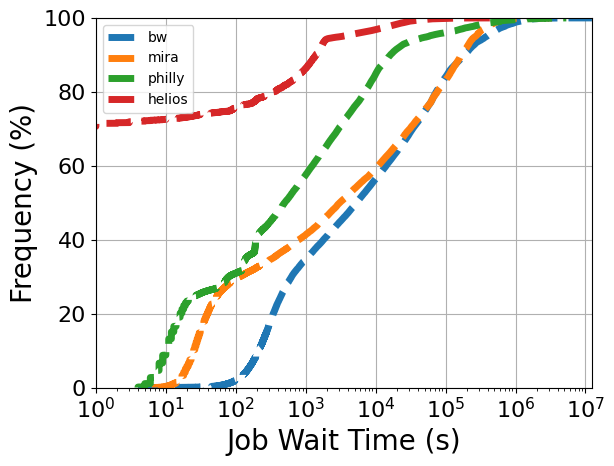

In [47]:
plot_cdf(bw_df["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(mira_df_2["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(philly_df[10000:130000]["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(hl_df["wait_time"], 100000, "Job Wait Time (s)")
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")

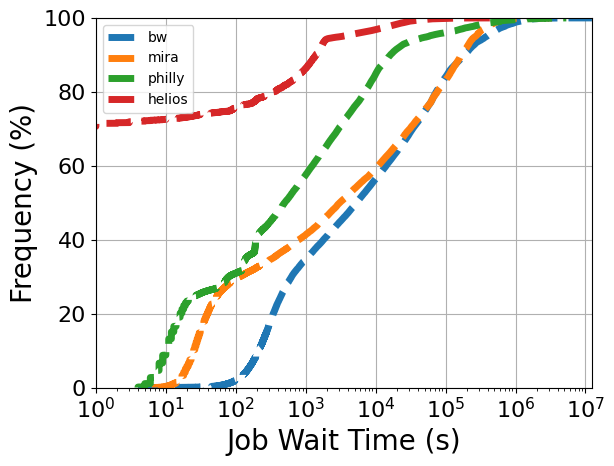

In [50]:
plot_cdf(bw_df["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(mira_df_2["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(philly_df[10000:130000]["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(hl_df["wait_time"], 100000, "Job Wait Time (s)")
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")

In [1379]:
bw_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,wall_time,node_hour
0,9090703,USER272409U,GRP119081G,0,0,86464,2702,1539154542,11818241,233,43200,1021852389824
1,9106378,USER272409U,GRP119081G,0,0,86464,2702,1539558167,12363931,242,43200,1069034929984
2,9329046,USER330089U,GRP119109G,0,12,0,12,1544046589,2250476,57845,86400,432091392
3,9329047,USER330089U,GRP119109G,0,12,0,12,1544046591,2308432,58188,86400,443218944
4,9329048,USER330089U,GRP119109G,0,12,0,12,1544046593,2366688,57947,86400,454404096
5,9329049,USER330089U,GRP119109G,0,12,0,12,1544046595,2424709,57111,86400,465544128
6,9329050,USER330089U,GRP119109G,0,12,0,12,1544046597,2481879,57798,86400,476520768
7,9329051,USER330089U,GRP119109G,0,12,0,12,1544046598,2539926,57690,86400,487665792
8,9329052,USER330089U,GRP119109G,0,12,0,12,1544046600,2597789,61559,86400,498775488
9,9329053,USER330089U,GRP119109G,0,12,0,12,1544046602,2659489,64501,86400,510621888


In [110]:
from heapq import *
from collections import defaultdict, Counter
from matplotlib import pyplot as plt
import seaborn as sns
import bisect
import numpy as np
def analyze_util_and_user_behavior(data, total_nodes, gpu=False):
    # waiting:0, running:1
    queue = []
    # util, time, user
    util_time_user = defaultdict(list)
    util_node_user = defaultdict(list)
    util_time = []
    cur_util = 0
    for index, row in data.iterrows():
        row["start_time"] = row["submit_time"] + row["wait_time"]
        row["end_time"] = row["start_time"] + row["run_time"]
        row["index"] = index
        # only for helios
        total_nodes = gpu_num_total[bisect.bisect(gpu_date, row["submit_time"])-1]
        while queue and queue[0][0]<=row["submit_time"]:
            temp = heappop(queue)
            cur_time = temp[0]
            job_type = temp[1]
            job = temp[3]
            if job_type == "waiting":
                heappush(queue, (job["end_time"], "running", job["index"], job))
                cur_util += job["gpu_num"] if gpu else job["node_num"]
            elif job_type == "running":
                cur_util -= job["gpu_num"] if gpu else job["node_num"]
            else:
                raise NotImplementedError
            if util_time and util_time[-1][0] == cur_time:
                util_time[-1][1] = cur_util/total_nodes
            else:
                util_time.append([cur_time, cur_util/total_nodes])
        heappush(queue, (row["start_time"], "waiting", row["index"] , row))
        util_time_user[row["user"]].append([row["submit_time"], cur_util/total_nodes])
        util_node_user[row["user"]].append([row["gpu_num"] if gpu else row["node_num"], cur_util/total_nodes])
        if index % 10000 == 0:
            print(index)
    return util_time, util_time_user, util_node_user  

def analyze_queue_and_user_behavior(data, gpu=False):
    data = data.copy()
    data["index"] = data.index
    # waiting:0, running:1
    queue = []
    # util, time, user
    util_time_user = defaultdict(list)
    util_node_user = defaultdict(list)
    util_time = []
    cur_wait = 0
    for index, row in data.iterrows():
        start_time = row["submit_time"] + row["wait_time"]
        end_time = start_time + row["run_time"]
        # only for helios
#         total_nodes = gpu_num_total[bisect.bisect(gpu_date, row["submit_time"])-1]
        while queue and queue[0][0]<=row["submit_time"]:
            temp = heappop(queue)
            cur_time = temp[0]
            job_type = temp[1]
            job = temp[3]
            if job_type == "waiting":
                heappush(queue, (job["submit_time"] + job["wait_time"]+job["run_time"], "running", job["index"], job))
                cur_wait -= 1
            elif job_type == "running":
                pass
#                 cur_util -= job["gpu_num"] if gpu else job["node_num"]
            else:
                raise NotImplementedError
            util_time.append([cur_time, cur_wait])
        heappush(queue, (start_time, "waiting", index, row))
        util_time_user[row["user"]].append([row["run_time"], cur_wait])
        util_node_user[row["user"]].append([row["gpu_num"] if gpu else row["node_num"], cur_wait])
        cur_wait += 1
        if index % 10000 == 0:
            print(index)
    return util_time, util_time_user, util_node_user 

def plot_util_node(un, data, bars, user="per", xlabel="mira"):
    hatches= ["-", ".", "x", "-"]
    if user == "per":
        users = list(data.groupby("user").count().sort_values(by="job", ascending=False).index[:6])
        stride = 0.2
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))

        for ui, user in enumerate(users):
            print(ui, user)

            x = ["{:.0%}".format((1+index)*stride)
                                      for index in range(int(1/stride))]
            buckets = [Counter() for _ in range(int(1/stride))]
            for node, util in un[user]:
                b = int(min(1/stride-1, util/stride))
                buckets[b][node] += 1
            for i in buckets:
                s = sum(i.values())
                for j in i:
                    i[j] /= s
            prevy = np.array([0]*len(x))
            prev_bar = -1
            for bar in bars:
                y = np.array([sum(i[j] for j in i.keys() if prev_bar<j <=bar) for i in buckets])
                axes[ui//3, ui%3].bar(x, y, bottom=prevy)
                prevy = y+prevy
                prev_bar = bar
            axes[ui//3, ui%3].legend(bars)
    else:
        all_un = []
        for i in un:
            all_un.extend(un[i])
        max_wait = max(all_un, key=lambda x: x[1])[1]
        stride = 1/3
        fig, axes = plt.subplots(1, 1, figsize=(3, 5))

        x = ["{}".format((1+index)*stride*max_wait)
                                  for index in range(int(1/stride))]
        buckets = [Counter() for _ in range(int(1/stride))]
        for node, util in all_un:
            b = int(min(1/stride-1, (util/max_wait)/stride))
            buckets[b][node] += 1
        for i in buckets:
            i[0] = 0
            s = sum(list(i.values()))
            for j in i:
                i[j] /= s*0.01
        prevy = np.array([0]*len(x))
        prev_bar = -1
        for index, bar in enumerate(bars):
            y = np.array([sum(i[j] for j in i.keys() if prev_bar<j <=bar) for i in buckets])
            axes.bar(x, y, bottom=prevy, hatch=hatches[index], edgecolor="black")
            prevy = y+prevy
            prev_bar = bar
        axes.set_xticks(x, ["Short Queue", "Middle Queue", "Long Queue"], rotation=45)
        axes.set_xlabel(xlabel, fontsize=20)
        axes.set_ylabel("Percentage (%)", fontsize=20)
#         axes.legend([ "Minimal", "Short", "Middle", "Long"], fontsize=30, bbox_to_anchor=(0.5, 2.05),
#           ncol=4, fancybox=True, shadow=True)
    

In [63]:
mira_queue_time, mira_queue_time_user, mira_queue_node_user = analyze_queue_and_user_behavior(mira_df_2, gpu=False)

0
10000
20000


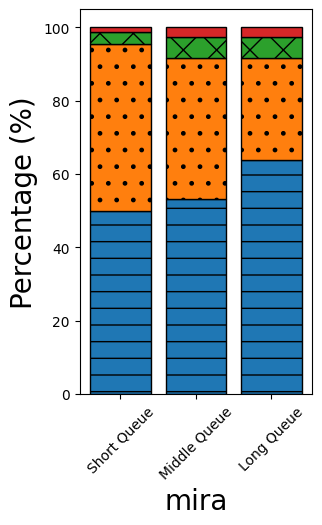

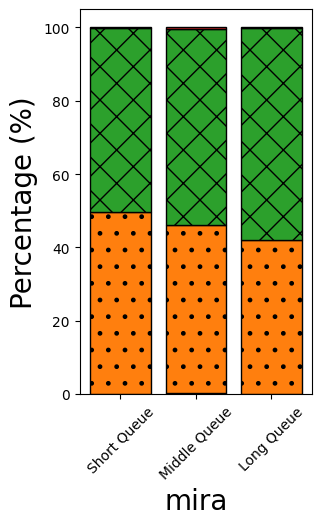

In [112]:
bars = [ 512, 49152//10, 3*49152//10, 49152]
# bars = [ 49152*16//10, 3*49152*16//10, 10000000]
plot_util_node(mira_queue_node_user, mira_df_2, bars, "all", "mira")
bars = [60, 3600, 3600*24, 100000000]
plot_util_node(mira_queue_time_user, mira_df_2, bars, "all", "mira")

In [71]:
bw_queue_time, bw_queue_time_user,bw_queue_node_user = analyze_queue_and_user_behavior(bw_df, gpu=False)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000


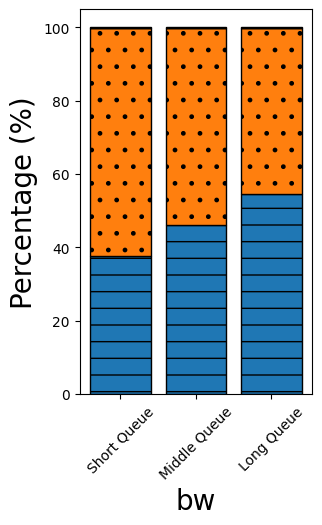

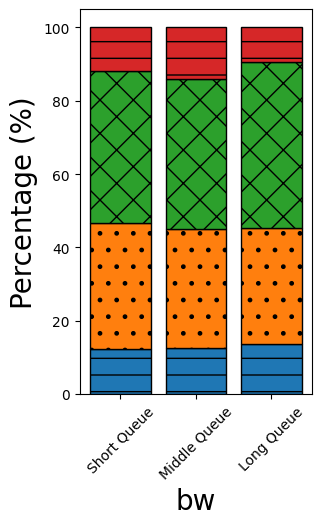

In [114]:
bars = [1, 22636//10, 3*22636//10, 1000000]
plot_util_node(bw_queue_node_user, bw_df, bars, "all", "bw")
bars = [60, 3600, 3600*24, 1000000000]
plot_util_node(bw_queue_time_user, bw_df, bars, "all", "bw")

In [64]:
queue_time, queue_time_user,queue_node_user = analyze_queue_and_user_behavior(hl_df, gpu=True)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000


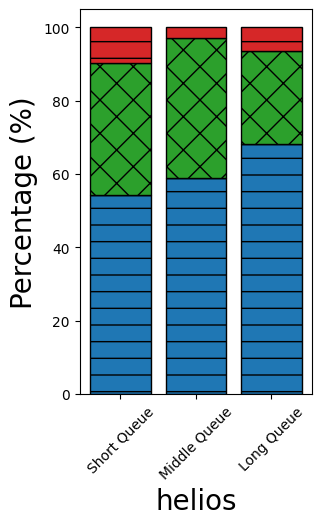

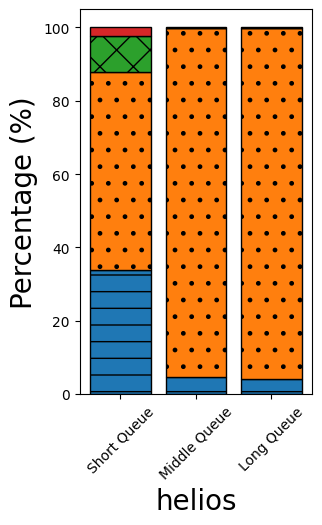

In [115]:
bars = [1, 1, 8, 256]
plot_util_node(queue_node_user, hl_df, bars, "all", "helios")
bars = [60, 3600, 3600*24, 1000000000]
plot_util_node(queue_time_user, hl_df, bars, "all", "helios")

In [65]:
phi_queue_time, phi_queue_time_user,phi_queue_node_user = analyze_queue_and_user_behavior(philly_df, gpu=True)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000


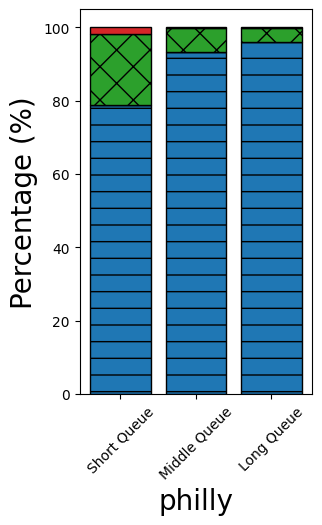

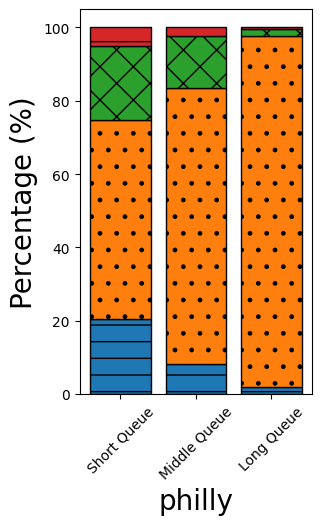

In [116]:
bars = [1, 1, 8, 256]
plot_util_node(phi_queue_node_user, philly_df, bars, "all", "philly")
bars = [60, 3600, 3600*24, 10000000]
plot_util_node(phi_queue_time_user, philly_df, bars, "all", "philly")

# Legacy Code. Just ignore everything .

In [855]:
print("user number")
print(len(bw_util_node_user))
print(len(mira_util_node_user))
print(len(phi_util_node_user))
print(len(util_node_user))

546
160
319
244


In [857]:
print("job counts")
print(len(bw_df))
print(len(mira_df_2))
print(len(philly_df))
print(len(hl_df))

job counts
358576
22508
151816
163359


In [849]:
phi_util_time, phi_util_time_user,phi_util_node_user = analyze_util_and_user_behavior(philly_df, 2490, gpu=True)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000


0 ae8ed1
1 066e99
2 e8d0f2
3 2c46d5
4 4f257b
5 0067d1


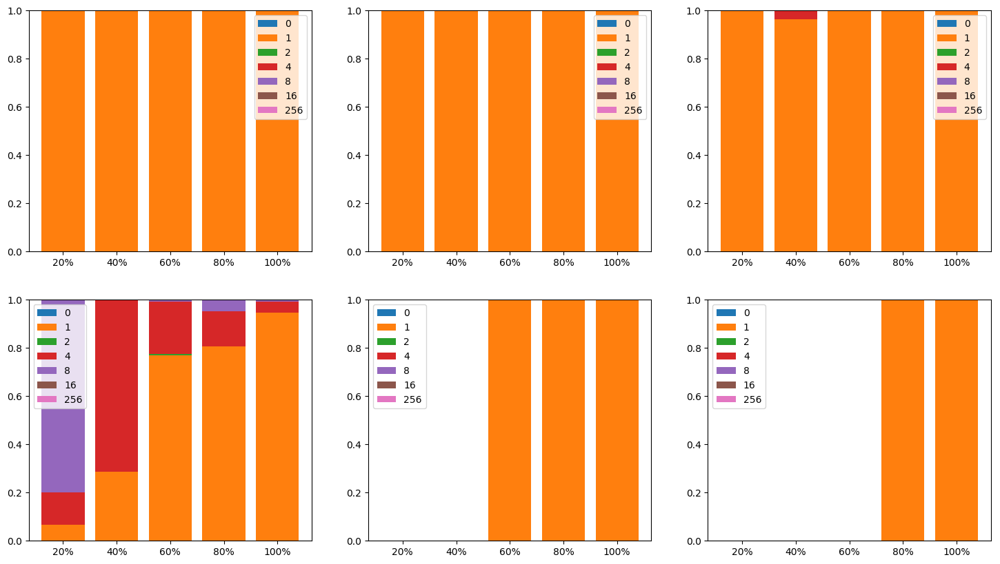

In [852]:
bars = [0, 1, 2, 4, 8, 16, 256]
plot_util_node(phi_util_node_user, philly_df, bars, "per")

In [837]:
bw_util_time, bw_util_time_user,bw_util_node_user = analyze_util_and_user_behavior(bw_df, 26864, gpu=False)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000


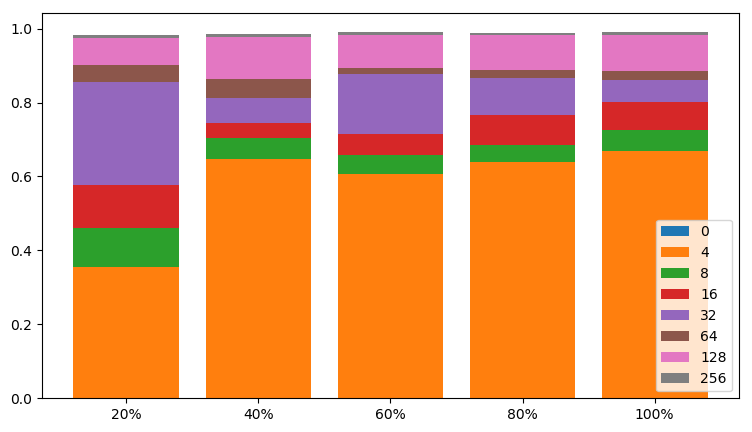

In [840]:
bars = [0, 4, 8, 16, 32, 64, 128, 256]
plot_util_node(bw_util_node_user, bw_df, bars, "all")

In [956]:
util_time, util_time_user,util_node_user = analyze_util_and_user_behavior(hl_df, 1080, gpu=True)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000


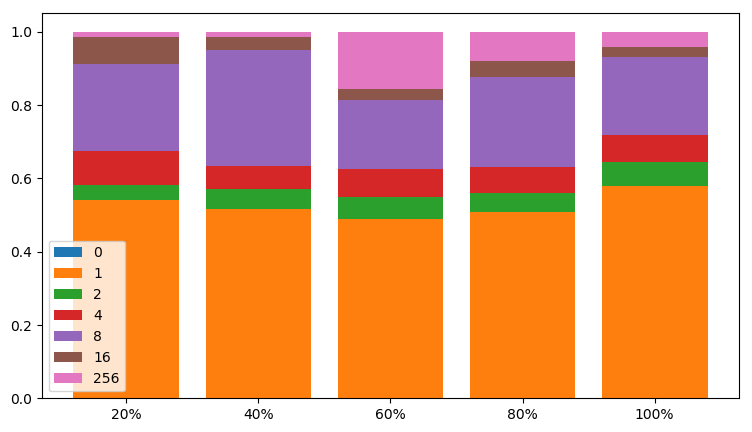

In [957]:
bars = [0, 1, 2, 4, 8, 16, 256]
plot_util_node(util_node_user, hl_df, bars, "all")

In [829]:
mira_util_time, mira_util_time_user, mira_util_node_user = analyze_util_and_user_behavior(mira_df_2, 49152, gpu=False)

0
10000
20000


,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,node_hour
0,9090703,USER272409U,GRP119081G,0,0,86464,2702,1539154542,11818241,233,1021852389824
1,9106378,USER272409U,GRP119081G,0,0,86464,2702,1539558167,12363931,242,1069034929984
2,9329046,USER330089U,GRP119109G,0,12,0,12,1544046589,2250476,57845,432091392
3,9329047,USER330089U,GRP119109G,0,12,0,12,1544046591,2308432,58188,443218944
4,9329048,USER330089U,GRP119109G,0,12,0,12,1544046593,2366688,57947,454404096
5,9329049,USER330089U,GRP119109G,0,12,0,12,1544046595,2424709,57111,465544128
6,9329050,USER330089U,GRP119109G,0,12,0,12,1544046597,2481879,57798,476520768
7,9329051,USER330089U,GRP119109G,0,12,0,12,1544046598,2539926,57690,487665792
8,9329052,USER330089U,GRP119109G,0,12,0,12,1544046600,2597789,61559,498775488
9,9329053,USER330089U,GRP119109G,0,12,0,12,1544046602,2659489,64501,510621888


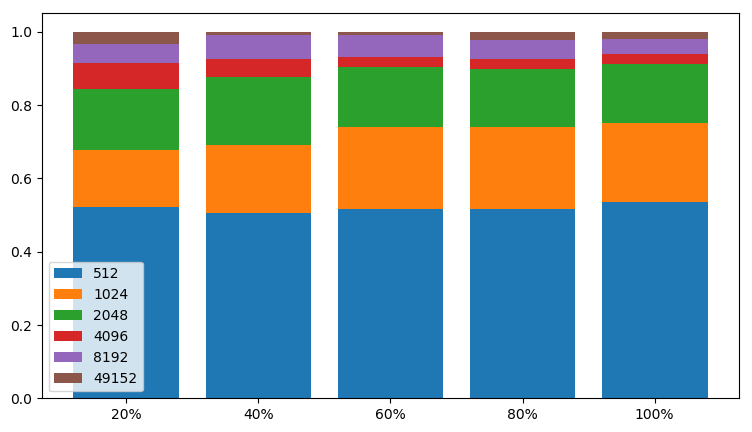

In [836]:
bars = [512, 1024, 2048, 4096, 8192, 49152]
plot_util_node(mira_util_node_user, mira_df_2, bars, "all")

In [770]:
util_node_user["uJjMX"]

[[32, 0.14074074074074075],
 [32, 0.17037037037037037],
 [0, 0.22962962962962963],
 [32, 0.30277777777777776],
 [4, 0.5083333333333333],
 [4, 0.5074074074074074],
 [32, 0.5046296296296297],
 [32, 0.5046296296296297],
 [32, 0.5046296296296297],
 [2, 0.5055555555555555],
 [8, 0.5083333333333333],
 [8, 0.5148148148148148],
 [8, 0.5166666666666667],
 [8, 0.5166666666666667],
 [8, 0.5166666666666667],
 [8, 0.5166666666666667],
 [0, 0.524074074074074],
 [8, 0.524074074074074],
 [8, 0.5157407407407407],
 [8, 0.5157407407407407],
 [8, 0.5138888888888888],
 [4, 0.5194444444444445],
 [8, 0.5203703703703704],
 [8, 0.5203703703703704],
 [4, 0.5203703703703704],
 [8, 0.5203703703703704],
 [8, 0.5194444444444445],
 [8, 0.524074074074074],
 [4, 0.5601851851851852],
 [8, 0.5564814814814815],
 [8, 0.5657407407407408],
 [8, 0.5657407407407408],
 [8, 0.5509259259259259],
 [8, 0.5435185185185185],
 [8, 0.5435185185185185],
 [8, 0.5435185185185185],
 [40, 0.5694444444444444],
 [32, 0.6101851851851852],
 [8

start plotting


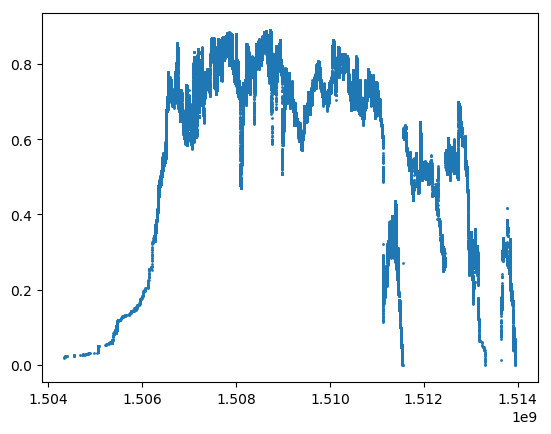

In [850]:
print("start plotting")
plt.scatter(*zip(*phi_util_time), s=1)
# plt.scatter(*zip(*util_time_user[94435408522577]), s=3)
# plt.scatter(*zip(*util_time_user[86960219911746]), s=3, c="red")
# plt.ylim([0,1])
plt.show()

(0, 1)

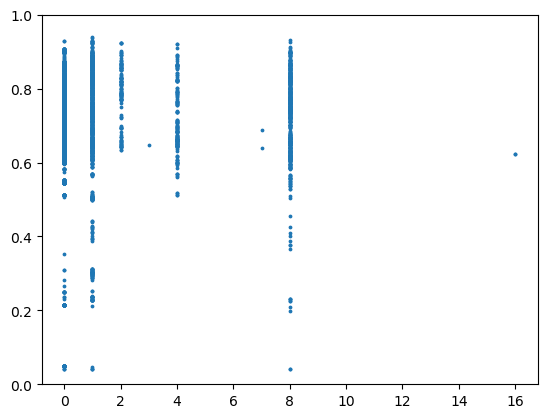

In [564]:
util_node_user["ujWZX"]
plt.scatter(*zip(*util_node_user["uJcI8"]), s=3)
plt.ylim([0,1])


[[1, 0.7981481481481482],
 [1, 0.75],
 [1, 0.7944444444444444],
 [1, 0.7944444444444444],
 [1, 0.7962962962962963],
 [0, 0.7888888888888889],
 [0, 0.7888888888888889],
 [0, 0.8268518518518518],
 [0, 0.8194444444444444],
 [0, 0.8268518518518518],
 [0, 0.8222222222222222],
 [0, 0.8222222222222222],
 [0, 0.8212962962962963],
 [0, 0.8212962962962963],
 [0, 0.8314814814814815],
 [0, 0.8435185185185186],
 [0, 0.825925925925926],
 [0, 0.8277777777777777],
 [0, 0.8268518518518518],
 [0, 0.75],
 [0, 0.7435185185185185],
 [0, 0.7518518518518519],
 [0, 0.7518518518518519],
 [1, 0.7537037037037037],
 [1, 0.7796296296296297],
 [0, 0.7833333333333333],
 [0, 0.7824074074074074],
 [0, 0.8074074074074075],
 [0, 0.8074074074074075],
 [0, 0.8296296296296296],
 [0, 0.8296296296296296],
 [0, 0.8342592592592593],
 [0, 0.8342592592592593],
 [0, 0.7944444444444444],
 [0, 0.7944444444444444],
 [0, 0.8018518518518518],
 [0, 0.8018518518518518],
 [0, 0.7972222222222223],
 [0, 0.7972222222222223],
 [0, 0.79814814

In [471]:
hl_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,node_hour
0,582026,u4TfD,vcWoR,COMPLETED,1,1,1,1.590638e+09,0.0,84.0,84.0
1,582027,u4TfD,vcWoR,COMPLETED,1,1,1,1.590638e+09,0.0,87.0,87.0
2,582028,u4TfD,vcWoR,COMPLETED,1,1,1,1.590639e+09,0.0,83.0,83.0
3,582029,ubfUm,vcJLV,FAILED,1,1,1,1.590639e+09,0.0,30.0,30.0
4,582030,uqOcl,vchbv,COMPLETED,8,40,1,1.590639e+09,0.0,656.0,656.0
5,582031,uDfFG,vcHvQ,FAILED,0,1,1,1.590639e+09,0.0,2.0,2.0
6,582032,uDfFG,vcHvQ,COMPLETED,0,1,1,1.590639e+09,0.0,42.0,42.0
7,582033,u7czv,vcP2J,CANCELLED,1,1,1,1.590639e+09,0.0,2115.0,2115.0
8,582034,u4TfD,vcWoR,COMPLETED,1,1,1,1.590639e+09,0.0,84.0,84.0
9,582035,ubfUm,vcJLV,FAILED,1,1,1,1.590639e+09,0.0,25.0,25.0


In [87]:
def time2hour(st):
    h, st = divmod(st, 3600)
    m, st = divmod(st, 60)
    return ":".join([str(h), str(m), str(st)])

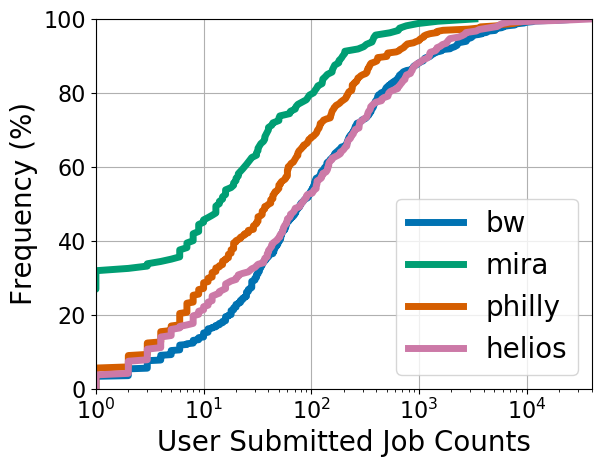

In [152]:
import seaborn as sns
from collections import Counter
# mira_df.groupby("UserID")["ProjectID"].count()
plot_cdf(list(Counter(i.d[j] for i in jobs for j in i.d if j.endswith("user")).values()), 10000, '1')
plot_cdf(list(mira_df.groupby("UserID")["ProjectID"].count()), 10000, '1')
plot_cdf(list(Counter(i["user"] for i in philly_logs).values()), 10000, '1')
plot_cdf(list(df.groupby("user")["job_id"].count()), 10000, 'User Submitted Job Counts')
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale('log')

In [253]:
class HL_Job:
    def __init__(self, row):
        self.d = {"job_id":row["job_id"], "qtime":row["submit_time"], "start":row["start_time"], "end":row["end_time"],
            "total_execution_slots":row["node_num"], "unique_node_count":row['node_num'], "Resource_List.walltime":time2hour(row["duration"]),
                 "queue":"high"}
hl_cpu_jobs = [ HL_Job(row) for _, row in df_cpu.iterrows()]
hl_gpu_jobs = [ HL_Job(row) for _, row in df_gpu.iterrows()]

In [91]:
#x = [i for i in hl_jobs if 1590897570<=i.d['qtime']<1601265570.0]

161286

In [254]:
len(hl_jobs)
for j in hl_jobs:
    j.d["qtime"] = int(j.d["qtime"])
hl_jobs.sort(key=lambda x:x.d["qtime"])

In [255]:
df_submit_diff = df["submit_time"].diff()
df_cpu_submit_diff = df_cpu["submit_time"].diff()
df_gpu_submit_diff = df_gpu["submit_time"].diff()

229675   -1112516.0
Name: submit_time, dtype: float64

{'status': 'Pass', 'vc': '11cb48', 'jobid': 'application_1506638472019_17235', 'attempts': [{'start_time': '2017-10-09 07:02:05', 'end_time': '2017-10-09 07:03:11', 'detail': [{'ip': 'm372', 'gpus': ['gpu0']}]}], 'submitted_time': '2017-10-09 07:01:55', 'user': '066e99'}


In [342]:
df

,job_id,user,vc,gpu_num,cpu_num,node_num,state,submit_time,start_time,end_time,duration,queue,wait_time,core_hour
83349,582026,u4TfD,vcWoR,1,1,1,COMPLETED,1.590638e+09,1.590638e+09,1.590638e+09,84,0,0.0,84
83350,582027,u4TfD,vcWoR,1,1,1,COMPLETED,1.590638e+09,1.590638e+09,1.590638e+09,87,0,0.0,87
83351,582028,u4TfD,vcWoR,1,1,1,COMPLETED,1.590639e+09,1.590639e+09,1.590639e+09,83,0,0.0,83
83352,582029,ubfUm,vcJLV,1,1,1,FAILED,1.590639e+09,1.590639e+09,1.590639e+09,30,0,0.0,30
83353,582030,uqOcl,vchbv,8,40,1,COMPLETED,1.590639e+09,1.590639e+09,1.590639e+09,656,0,0.0,656
83354,582031,uDfFG,vcHvQ,0,1,1,FAILED,1.590639e+09,1.590639e+09,1.590639e+09,2,0,0.0,2
83355,582032,uDfFG,vcHvQ,0,1,1,COMPLETED,1.590639e+09,1.590639e+09,1.590639e+09,42,0,0.0,42
83356,582033,u7czv,vcP2J,1,1,1,CANCELLED,1.590639e+09,1.590639e+09,1.590641e+09,2115,0,0.0,2115
83357,582034,u4TfD,vcWoR,1,1,1,COMPLETED,1.590639e+09,1.590639e+09,1.590639e+09,84,0,0.0,84
83358,582035,ubfUm,vcJLV,1,1,1,FAILED,1.590639e+09,1.590639e+09,1.590639e+09,25,0,0.0,25


In [159]:
philly_logs[0]['attempts']

[{'start_time': 'None',
  'end_time': '2017-09-12 18:15:06',
  'detail': [{'ip': 'm345', 'gpus': ['gpu0']}]},
 {'start_time': '2017-09-12 18:15:16',
  'end_time': '2017-09-28 20:09:19',
  'detail': [{'ip': 'm180', 'gpus': ['gpu0']}]}]

In [168]:
# x = []
# y = []
# for i in philly_logs:
#     if i['attempts']:
#         for j in i["attempts"]:
#             if j['detail']:
#                 for k in j['detail']:
#                     if not k['gpus']:
#                         print(j)
#                         break

In [99]:
#x = [i for i in philly_logs if date2stamp('2017-08-22 08:02:11')<=date2stamp(i["submitted_time"])<=date2stamp("2017-12-22 08:02:11")]

In [101]:
len(x)

117308

In [102]:
len(philly_logs)

117325

In [414]:
list(mira_df)

['Unnamed: 0',
 'UserID',
 'ProjectID',
 'QueueName',
 '#NodesRequested',
 '#CoresRequested',
 'WallTimeRequested',
 'QueuedTimestamp',
 'StartTimestamp',
 'EndTimestamp',
 'EligibleQueueTime',
 'Runtime',
 'State']

In [416]:
len(mira_df)

22508

In [9]:
mira_df = pd.read_csv("sc20_hpc_workload_dataset/Mira/2018/2018_with_state.csv")
mira_df["QueuedTimestamp"] = mira_df.apply(lambda row: date2stamp(row["QueuedTimestamp"]), axis=1)
mira_df = mira_df.sort_values(by=['QueuedTimestamp'])
mira_df["StartTimestamp"] = mira_df.apply(lambda row: date2stamp(row["StartTimestamp"]), axis=1)
mira_df["EndTimestamp"] = mira_df.apply(lambda row: date2stamp(row["EndTimestamp"]), axis=1)
mira_df = mira_df[35193:]

In [10]:
mira_df

,Unnamed: 0,UserID,ProjectID,QueueName,#NodesRequested,#CoresRequested,WallTimeRequested,QueuedTimestamp,StartTimestamp,EndTimestamp,EligibleQueueTime,Runtime,State
35079,35079,35012304659472,45081100820135,prod-short,512.0,8192.0,18000.0,1.535348e+09,1.535485e+09,1.535502e+09,102306,17348.0,0
35088,35088,35012304659472,45081100820135,prod-short,512.0,8192.0,18000.0,1.535348e+09,1.535493e+09,1.535509e+09,102363,15780.0,0
35004,35004,12702668417572,94192855243660,prod-short,512.0,8192.0,16200.0,1.535348e+09,1.535373e+09,1.535386e+09,1620,12393.0,0
34988,34988,64814064402512,24995707918422,prod-short,2048.0,32768.0,12600.0,1.535348e+09,1.535367e+09,1.535377e+09,19362,9586.0,0
34948,34948,80824296493467,47915730042343,prod-short,1024.0,16384.0,11400.0,1.535348e+09,1.535348e+09,1.535357e+09,20,9210.0,228
34949,34949,94435408522577,80954500977394,prod-short,512.0,8192.0,6000.0,1.535351e+09,1.535354e+09,1.535358e+09,30,3586.0,0
35109,35109,12702668417572,94192855243660,prod-short,512.0,8192.0,21600.0,1.535352e+09,1.535504e+09,1.535521e+09,130479,17556.0,0
34957,34957,80824296493467,47915730042343,prod-short,1024.0,16384.0,11400.0,1.535354e+09,1.535354e+09,1.535363e+09,44,8983.0,228
34984,34984,80824296493467,47915730042343,prod-short,1024.0,16384.0,11400.0,1.535354e+09,1.535368e+09,1.535377e+09,13893,9137.0,228
34972,34972,80824296493467,25297754036866,prod-short,1024.0,16384.0,10800.0,1.535354e+09,1.535363e+09,1.535372e+09,9059,8960.0,228


In [11]:
mira_df_data = []
for index, row in mira_df.iterrows():
    timeout = 1 if row["Runtime"]>= row["WallTimeRequested"] else 0
    temp = [index, 
            row["UserID"],
            row["ProjectID"],
            1000*timeout+int(row["State"]),
            0,
            row["#CoresRequested"],
            row["#NodesRequested"],
            row["QueuedTimestamp"],
            row["EligibleQueueTime"],
            row["Runtime"],
            row["WallTimeRequested"],
            row["#NodesRequested"]*row["Runtime"]]
    mira_df_data.append(temp)
mira_df_2 = pd.DataFrame(mira_df_data, columns=columns)

In [927]:
mira_df_2

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,wall_time,node_hour
0,35079,35012304659472,45081100820135,0,0,8192.0,512.0,1.535348e+09,102306,17348.0,18000.0,8882176.0
1,35088,35012304659472,45081100820135,0,0,8192.0,512.0,1.535348e+09,102363,15780.0,18000.0,8079360.0
2,35004,12702668417572,94192855243660,0,0,8192.0,512.0,1.535348e+09,1620,12393.0,16200.0,6345216.0
3,34988,64814064402512,24995707918422,0,0,32768.0,2048.0,1.535348e+09,19362,9586.0,12600.0,19632128.0
4,34948,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535348e+09,20,9210.0,11400.0,9431040.0
5,34949,94435408522577,80954500977394,0,0,8192.0,512.0,1.535351e+09,30,3586.0,6000.0,1836032.0
6,35109,12702668417572,94192855243660,0,0,8192.0,512.0,1.535352e+09,130479,17556.0,21600.0,8988672.0
7,34957,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535354e+09,44,8983.0,11400.0,9198592.0
8,34984,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535354e+09,13893,9137.0,11400.0,9356288.0
9,34972,80824296493467,25297754036866,228,0,16384.0,1024.0,1.535354e+09,9059,8960.0,10800.0,9175040.0


In [605]:
# mira_df_2.groupby(["user", "state"]).count()
# for index, row in mira_df_2.groupby(["user", "state"]).count().loc[94435408522577]["job"].iteritems():
#     print(index, row)
hl_df.groupby(["state"]).count().sort_values(by="job", ascending=False)
# philly_df.groupby(["state"]).count().sort_values(by="job", ascending=False)

# bw_df.groupby(["state"]).count().sort_values(by="job", ascending=False)

,job,user,project,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,node_hour
state,,,,,,,,,,
COMPLETED,105734,105734,105734,105734,105734,105734,105734,105734,105734,105734
CANCELLED,34558,34558,34558,34558,34558,34558,34558,34558,34558,34558
FAILED,22976,22976,22976,22976,22976,22976,22976,22976,22976,22976
NODE_FAIL,47,47,47,47,47,47,47,47,47,47
TIMEOUT,44,44,44,44,44,44,44,44,44,44


In [505]:
from matplotlib import ticker as mticker
import seaborn as sns

def analyze_attribute_per(u, data):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:10])
    job_counts = list(data.groupby(u).count().sort_values(by="job", ascending=False)["job"][:10])
    sum_of_node_hour = [data.groupby(u).sum()["node_hour"].loc[i]//3600 for i in rows]
    mean_nodes = [data.groupby(u).mean()["node_num"].loc[i] for i in rows]
    mean_run_time = [data.groupby(u).mean()["run_time"].loc[i] for i in rows]
    temp_df = pd.DataFrame(list(zip(rows, job_counts, sum_of_node_hour, mean_nodes, mean_run_time)),
                           columns=[u, "job_count", "sum_of_node_hour", "mean_nodes", "mean_run_time"])
    return temp_df

def analyze_attribute_per_ml(u, data, status=["Pass","Failed","Killed"]):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:10])
    job_counts = list(data.groupby(u).count().sort_values(by="job", ascending=False)["job"][:10])
    sum_of_node_hour = [data.groupby(u).sum()["node_hour"].loc[i]//3600 for i in rows]
    mean_nodes = [data.groupby(u).mean()["node_num"].loc[i] for i in rows]
    mean_run_time = [data.groupby(u).mean()["run_time"].loc[i] for i in rows]
    st0_run_time = [data.groupby([u, "state"]).mean()["run_time"].loc[i].get(status[0],0) for i in rows]
    st1_run_time = [data.groupby([u, "state"]).mean()["run_time"].loc[i].get(status[1],0) for i in rows]
    st2_run_time = [data.groupby([u, "state"]).mean()["run_time"].loc[i].get(status[2],0) for i in rows]

    temp_df = pd.DataFrame(list(zip(rows, job_counts, sum_of_node_hour, mean_nodes, mean_run_time, st0_run_time,
                                   st1_run_time, st2_run_time )),
                           columns=[u, "job_count", "sum_of_node_hour", "mean_nodes", "mean_run_time", 
                                    "mean_run_time ({})".format(status[0]),
                                   "mean_run_time ({})".format(status[1]),
                                   "mean_run_time ({})".format(status[2])])
    return temp_df

def plot_attribute_per_ml(u, data, state="state", status=["Pass","Failed","Killed"],all_user=False):
    plt.style.use("default")
    rows = list(data.groupby(u).sum().sort_values(by="node_hour", ascending=False).index[:3])
#     job_counts = list(data.groupby(u).count().sort_values(by="job", ascending=False)["job"][:10])
#     sum_of_node_hour = [data.groupby(u).sum()["node_hour"].loc[i]//3600 for i in rows]
#     mean_nodes = [data.groupby(u).mean()["node_num"].loc[i] for i in rows]
    if all_user:
        mean_run_time = [data["run_time"]]
        st0_run_time = [data.groupby([state])["run_time"].apply(list).get(status[0],0)]
        st1_run_time = [data.groupby([state])["run_time"].apply(list).get(status[1],0)]
        st2_run_time = [data.groupby([state])["run_time"].apply(list).get(status[2],0)]
        fig, axes = plt.subplots(1, 1, figsize=(4, 3))

        for index, i in enumerate(zip(st0_run_time, st1_run_time, st2_run_time)):
            k = [np.log10(np.array(j)+1) for j in i]
#             k = pd.DataFrame(k, columns=[])
#             k[-2] = k[-2]+(k[-1] if k[-1] else [])
            sns.violinplot(data=k,ax=axes, scale="width")
        ax = axes
        ax.yaxis.set_major_formatter(mticker.StrMethodFormatter("$10^{{{x:.0f}}}$"))
        ymin, ymax = ax.get_ylim()
        tick_range = np.arange(np.floor(ymin), ymax)
        ax.yaxis.set_ticks(tick_range)
        ax.yaxis.set_ticks([np.log10(x) for p in tick_range for x in np.linspace(10 ** p, 10 ** (p + 1), 10)], minor=True)
        ax.yaxis.grid(True)
        ax.set_xticks([y for y in range(3)])
        ax.set_xticklabels([ "Pass", "Failed", "Killed"], fontsize=24)
    #         ax.set_xticks([y + 1 for y in range(4)])
    #         ax.set_xticklabels(['all', *status])
#         ax.set_xlabel('User '+str(index+1), fontsize=20)

        ax.set_ylabel('Job Run time (s)', fontsize=20)
#         ax.set_xticks([y + 1 for y in range(4)])
#         ax.set_xticklabels(['all', *status])
    else:
        mean_run_time = [data.groupby(u)["run_time"].apply(list).loc[i] for i in rows]
        st0_run_time = [data.groupby([u, state])["run_time"].apply(list).loc[i].get(status[0],0) for i in rows]
        st1_run_time = [data.groupby([u, state])["run_time"].apply(list).loc[i].get(status[1],0) for i in rows]
        st2_run_time = [data.groupby([u, state])["run_time"].apply(list).loc[i].get(status[2],0) for i in rows]
        fig, axes = plt.subplots(1, 3, figsize=(12, 3))

        for index, i in enumerate(zip(st0_run_time, st1_run_time, st2_run_time)):
            k = [np.log10(np.array(j)+1) for j in i]
#             k = pd.DataFrame(k, columns=[])
#             k[-2] = k[-2]+(k[-1] if k[-1] else [])
            sns.violinplot(data=k,ax=axes[index%3], scale="width")
        for index, ax in enumerate(axes.flatten()):
            ax.yaxis.set_major_formatter(mticker.StrMethodFormatter("$10^{{{x:.0f}}}$"))
            ymin, ymax = ax.get_ylim()
            tick_range = np.arange(np.floor(ymin), ymax)
            ax.yaxis.set_ticks(tick_range, fontsize=20)
            ax.yaxis.set_ticks([np.log10(x) for p in tick_range for x in np.linspace(10 ** p, 10 ** (p + 1), 10)], minor=True,)
            ax.yaxis.grid(True)
            ax.set_xticks([y for y in range(3)])
            ax.set_xticklabels([ "Pass", "Failed", "Killed"], fontsize=15)
    #         ax.set_xticks([y + 1 for y in range(4)])
    #         ax.set_xticklabels(['all', *status])
            ax.set_xlabel('User '+str(index+1), fontsize=20)

            if index == 0:
                ax.set_ylabel('Job Run time (s)', fontsize=20)
    plt.show()

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


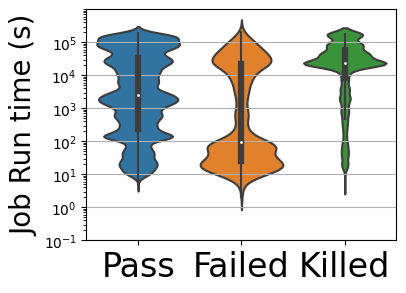

In [506]:
plot_attribute_per_ml("user", data=bw_df, state="new_status", all_user=True)

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


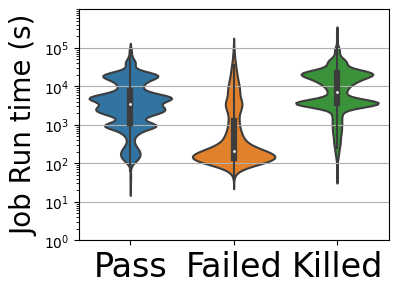

In [507]:
plot_attribute_per_ml("user", data=mira_df_2, state="new_status", all_user=True)

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


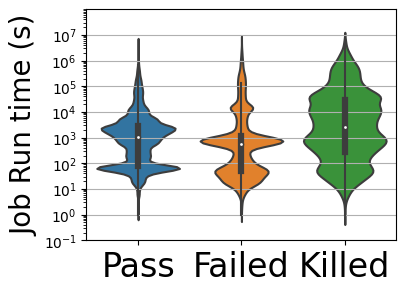

In [508]:
plot_attribute_per_ml("user", data=philly_df, state="state", all_user=True)

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


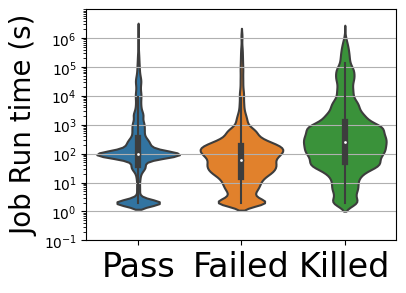

In [509]:
plot_attribute_per_ml("user", data=hl_df, state="state", all_user=True)

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


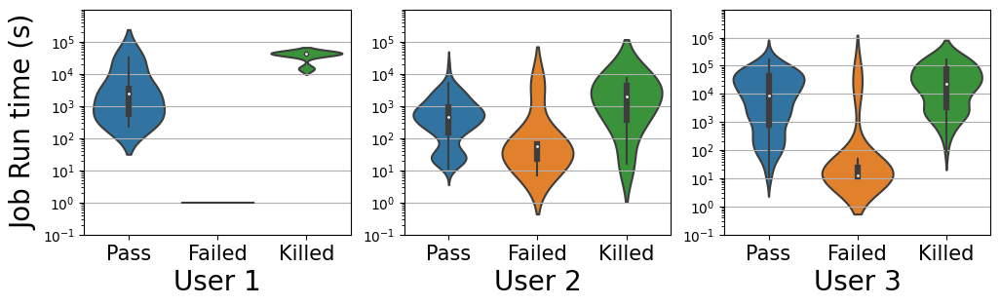

In [123]:
plot_attribute_per_ml("user", data=bw_df, state="new_status") 

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


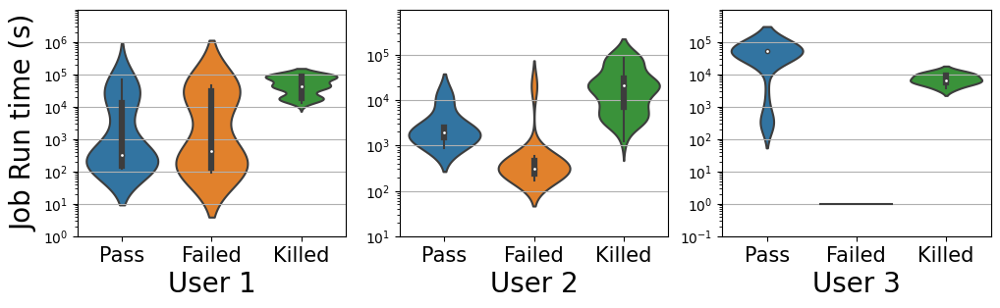

In [124]:
plot_attribute_per_ml("user", data=mira_df_2, state="new_status") 

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


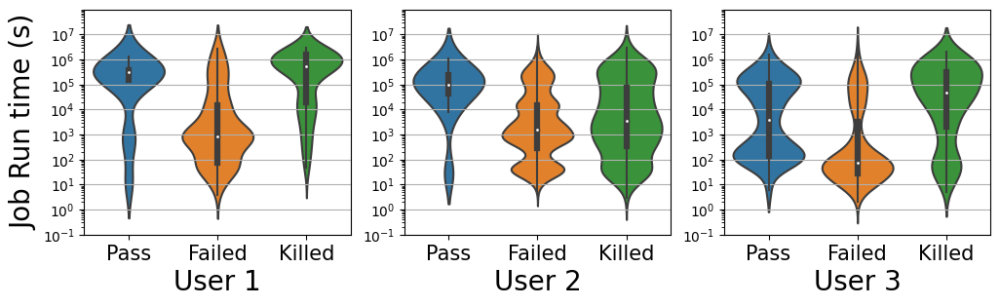

In [125]:
plot_attribute_per_ml(u="user", data=philly_df, status=["Pass", "Failed", "Killed"]) 

/home/dzhang16/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


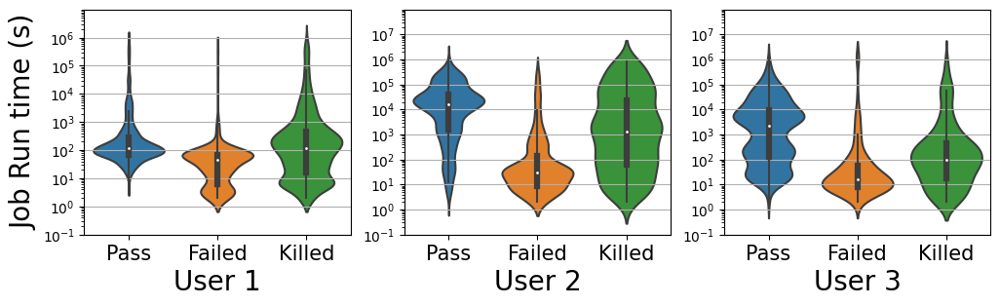

In [126]:
plot_attribute_per_ml("user", data=hl_df) 

In [88]:
def get_one_week(index, year_week_day_list):
    if index >= len(year_week_day_list):
        return index
    start = year_week_day_list[index]
    for i in range(index, len(year_week_day_list)):
        if year_week_day_list[i][1] == start[1]:
            continue
        else:
            return i
    return len(year_week_day_list)

def plot_fail_prob(data, u="user", state="state", normal="NM"):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:6])
    ratio = 0.7
    run_time_list = [data.groupby(u)["run_time"].apply(list).loc[i] for i in rows]
    submit_time_list = [data.groupby(u)["submit_time"].apply(list).loc[i] for i in rows]
    state_list = [data.groupby(u)[state].apply(list).loc[i] for i in rows]
    data_list = [list(zip(i, j)) for i, j in zip(run_time_list, state_list)]
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    #list(map(lambda x: (datetime(x).isocalendar().year, datetime(x).isocalendar().week, datetime(x).isocalendar().weekday),
                               
    for index, cur in enumerate(data_list):
        #year_week_day_list = list(map(lambda x: (datetime.fromtimestamp(x).isocalendar()[0], datetime.fromtimestamp(x).isocalendar()[1], datetime.fromtimestamp(x).isocalendar()[2]), submit_time_list[index]))
        year_week_day_list = list(map(lambda x: (datetime.fromtimestamp(x).year, datetime.fromtimestamp(x).month, datetime.fromtimestamp(x).day), submit_time_list[index]))

        # train
#         train_start = 0
#         train_end = get_one_week(get_one_week(train_start, year_week_day_list), year_week_day_list)
#         assert train_end > 0
#         print("user:", index, "train_size:", train_end-train_start)
#         test_end = get_one_week(train_end, year_week_day_list)
#         assert test_end > train_end
#         print("user:", index, "test_size:", test_end-train_end)
#         train = cur[train_start:train_end]
#         test = cur[train_end:test_end]
#         train.sort(key=lambda x: -x[0])
#         test.sort(key=lambda x: -x[0])
#         def get_time_prob(train):
#             time = []
#             prob = []
#             bad = []
#             cur_good = 0
#             total = 0
#             for row in train:
#                 if row[1] == normal:
#                     cur_good += 1
#                 total += 1
#                 time.append(row[0])
#                 prob.append((total-cur_good)/total)
#                 bad.append(total-cur_good)
#             return time, prob, bad
#         train_time, train_prob, train_bad = get_time_prob(train)
#         test_time, test_prob, test_bad = get_time_prob(test)
#         axes[index//3, index%3].plot(train_time, train_prob)
#         axes[index//3, index%3].plot(test_time, test_prob)
        ##########
        # iter
        def get_time_prob(train):
            time = []
            prob = []
            bad = []
            cur_good = 0
            total = 0
            for row in train:
                if row[1] == normal:
                    cur_good += 1
                total += 1
                time.append(row[0])
                prob.append((total-cur_good)/total)
                bad.append(total-cur_good)
            return time, prob, bad
        start, end = 0, 0
        for i in range(4):
            end = get_one_week(start, year_week_day_list)
            assert end > 0
            train = cur[start:end]
            train.sort(key=lambda x: -x[0])
            train_time, train_prob, train_bad = get_time_prob(train)
            axes[index//3, index%3].plot(train_time, train_prob)
            start = end
        plt.legend(list(range(6)))
        ##########
        
        
#         ax2=axes[index//3, index%3].twinx()
#         ax2.plot(test_time, test_bad, color="red")
    for ax in axes.flatten():
        ax.yaxis.grid(True)
#         ax.set_xticks([y + 1 for y in range(4)])
#         ax.set_xticklabels(['all', *status])
        ax.set_xscale("log")
        ax.set_xlabel('run_time')
        ax.set_ylabel('fail_probability')
    plt.show()       

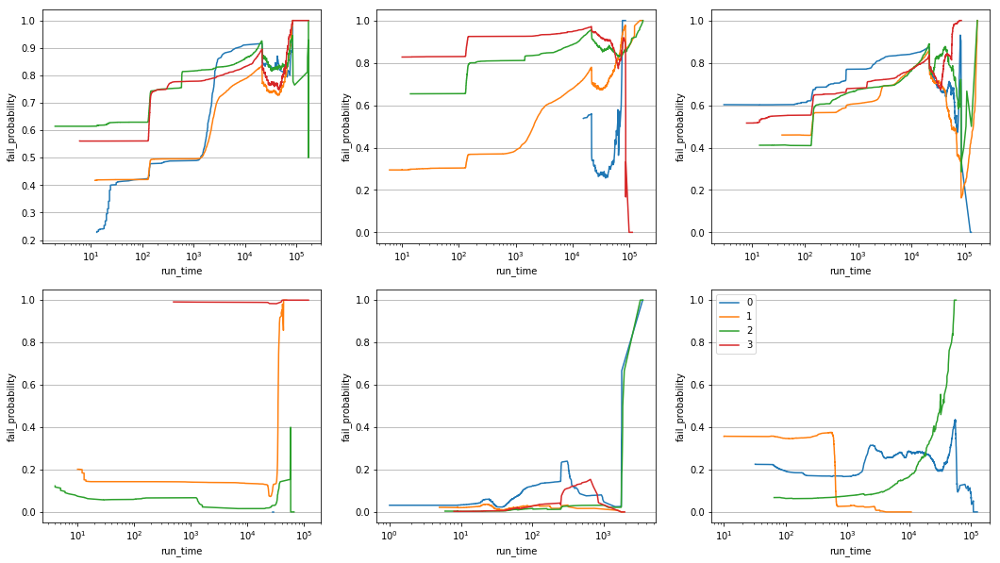

In [89]:
plot_fail_prob(bw_df, u="user", state="new_status", normal="NM")

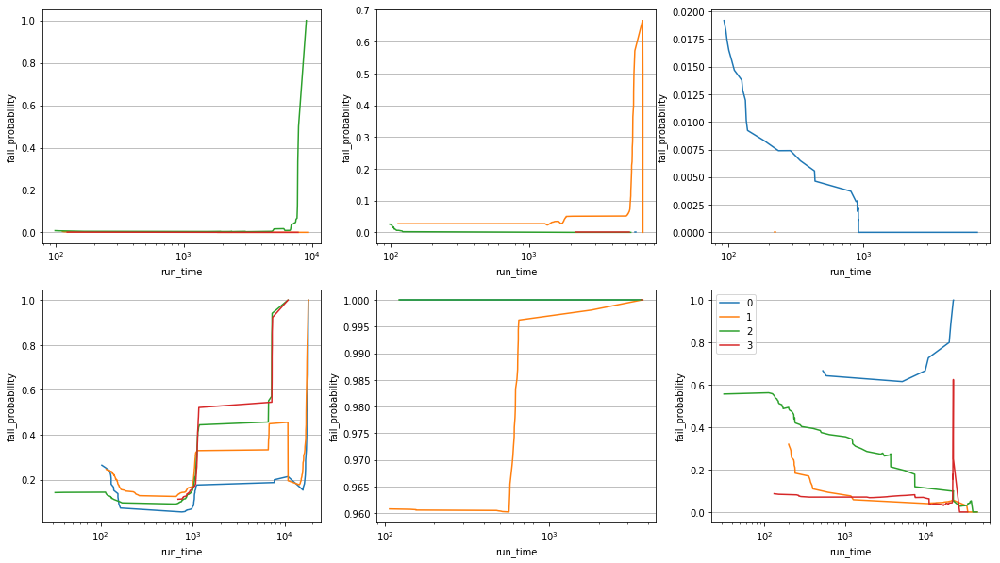

In [90]:
plot_fail_prob(mira_df_2, u="user", state="new_status", normal="NM")

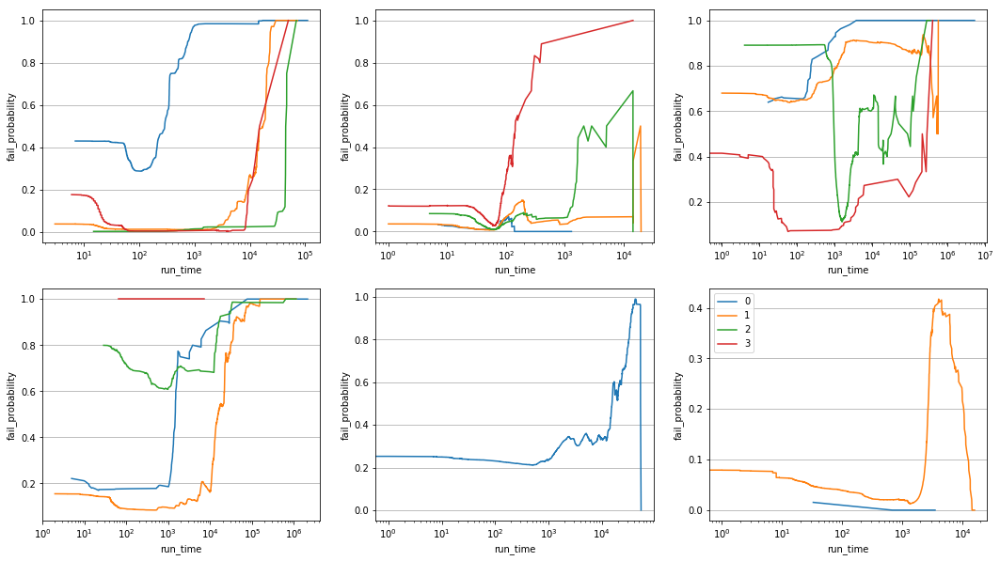

In [91]:
plot_fail_prob(philly_df, u="user", state="state", normal="Pass")

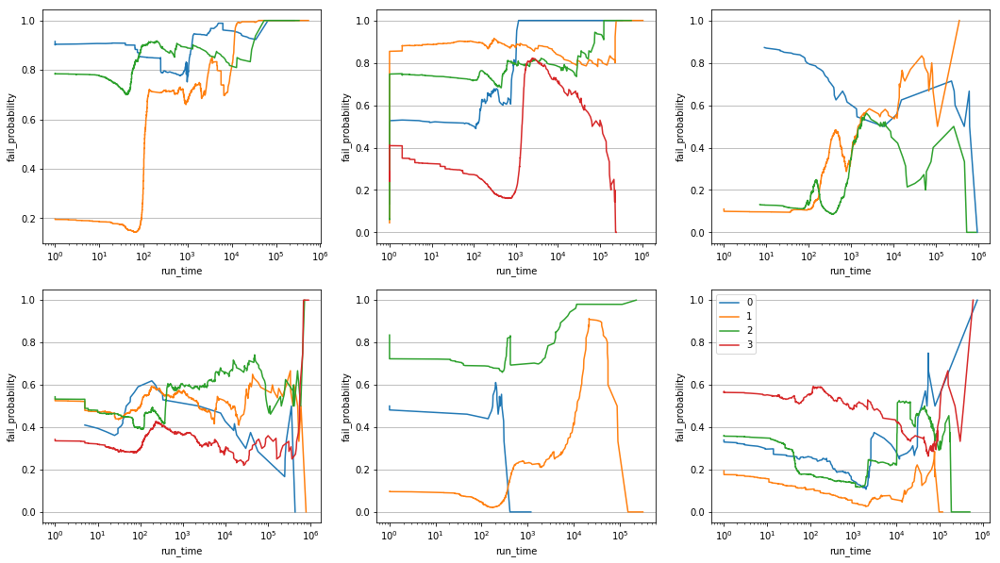

In [92]:
plot_fail_prob(hl_df, u="user", state="state", normal="COMPLETED")

In [432]:
!pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.8/24.8 MB 17.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 28.9 MB/s eta 0:00:00
  Using cached threadpoolctl-3.1.0-py3-none-any.whl (14 kB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.19.2
    Uninstalling scikit-learn-0.19.2:
      Successfully uninstalled scikit-learn-0.19.2

[notice] A new release of pip available: 22.3.1 -> 23.0
[notice] To update, run: pip install --upgrade pip


In [407]:
def plot_run_time(data, u="user", state="state", normal="NM"):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:6])
    run_time_list = [data.groupby(u)["run_time"].apply(list).loc[i] for i in rows]
    submit_time_list = [data.groupby(u)["submit_time"].apply(list).loc[i] for i in rows]
    state_list = [data.groupby(u)[state].apply(list).loc[i] for i in rows]
    user_list = [data.groupby(u).get_group(i) for i in rows]

    data_list = [list(zip(i, j)) for i, j in zip(run_time_list, state_list)]
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    def get_normal_abnormal(cur):
        n = []
        ab = []
        for i, j in cur:
            if j == normal:
                n.append(i)
            else:
                ab.append(i)
        return n, ab
    for index, cur in enumerate(user_list):
        cur = remove_outliers(cur, ["run_time"], 2)

        cur = cur.reset_index()
#         n, ab = get_normal_abnormal(cur)
#         cur = pd.DataFrame(cur, columns=["run_time"])
        for node in pd.unique(cur["gpu_num"]):
            axes[index//3, index%3].scatter(cur[cur["gpu_num"]==node]["run_time"].index, cur[cur["gpu_num"]==node]["run_time"], s=2)
#         axes[index//3, index%3].scatter(range(len(cur)), cur, s=2)
#         axes[index//3+2, index%3].scatter(range(len(ab)), ab, s=2)

    for ax in axes.flatten():
        ax.yaxis.grid(True)
#         ax.set_xticks([y + 1 for y in range(4)])
#         ax.set_xticklabels(['all', *status])
#         ax.set_yscale("log")
        ax.set_xlabel('job id')
        ax.set_ylabel('run_time')
    plt.show()  
    

Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time


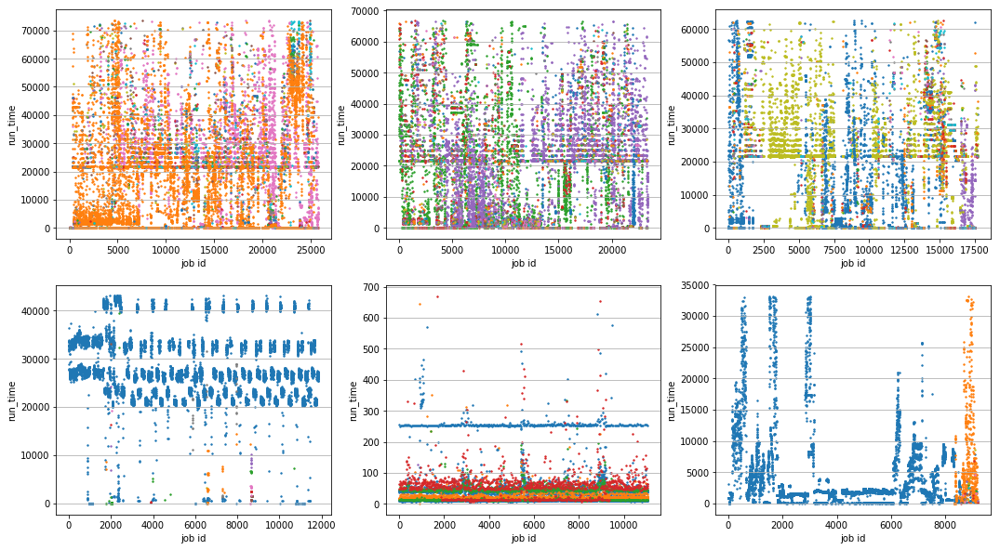

In [403]:
plot_run_time(bw_df, state="new_status", normal="NM")

In [928]:
plot_run_time(mira_df_2, state="new_status", normal="NM")

KeyError: 'Column not found: new_status'

Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time


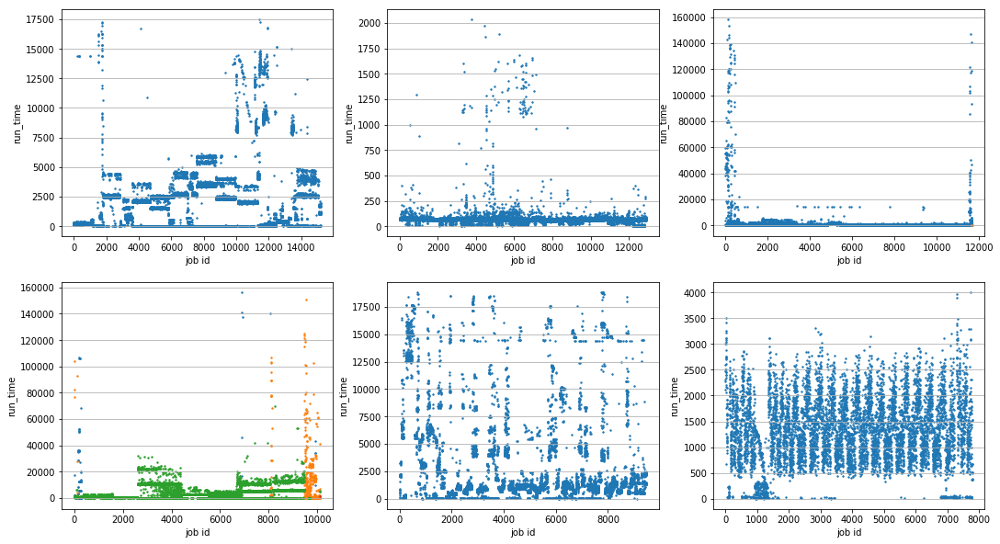

In [408]:
plot_run_time(philly_df, state="state", normal="Pass")

Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time
Working on column: run_time


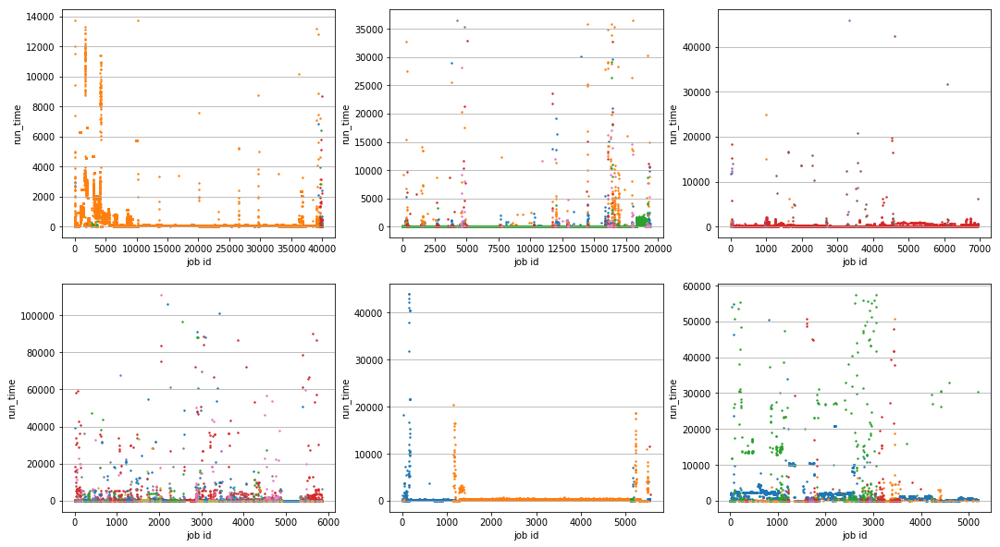

In [409]:
plot_run_time(hl_df, state="state", normal="COMPLETED")

In [448]:
%load_ext autoreload
%autoreload 2
import importlib
importlib.reload(sklearn.utils)
import sklearn
sklearn.__version__

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ImportError: cannot import name 'parse_version' from 'sklearn.utils.fixes' (/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/utils/fixes.py)

In [224]:
import numpy as np
from scipy.optimize import minimize
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
import sklearn
# importlib.reload(sys.modules['tobit'])
from tobit import TobitModel

class LADRegression(BaseEstimator, RegressorMixin):
    def fit(self, X, y):
#         X, y = check_X_y(X, y)
        
        d = X.shape[1]
        mae_loss = lambda coefs: np.mean(np.apply_along_axis(lambda x: np.where(x>0, x*2, -x), axis=0, arr=y - X@coefs[:-1] - coefs[-1]))
        *self.coef_, self.intercept_ = minimize(mae_loss, x0=np.array((d+1)*[0.])).x # the heavy lifting
        
        return self
    
    def predict(self, X):
#         sklearn.utils.validation.check_is_fitted(self)
#         X = check_array(X)
        
        return X@self.coef_ + self.intercept_

In [380]:
from collections import defaultdict
def preprocess2(data):
    # last 2 jobs
    # last 2 jobs above quarters if current is above quarter
    quarters = {}
    data = data.copy()
    previous_job = defaultdict(lambda: [0, 0, 0, 0])
    previous_job_quarter = defaultdict(lambda: [0, 0, 0, 0])
    data['user'] = data.user.astype('category')
    rows = list(data.groupby("user").count().sort_values(by="job", ascending=False).index[:])
    print(len(rows))
    user_list = [data.groupby("user").get_group(i) for i in rows]
    start = time.time()
    for index, i in enumerate(user_list):
        quarter = np.quantile(i["run_time"], 0.25)
        quarters[i['user'].iloc[0]] = quarter
    prev = defaultdict(int)
    prev_above_quarter = defaultdict(int)
    q = []
    l1 = []
    l2 = []
    l3 = []
    p1 = []
    p2 = []
    a1 = []
    for index, row in data.iterrows():
        if index%10000==0:
            print(index/len(data), time.time()-start)
        for i in range(3):
            previous_job[row['user']][i] = previous_job[row['user']][i+1]
        previous_job[row['user']][3] = row["run_time"]
        q.append(quarters[row['user']])
        l1.append(previous_job[row['user']][-2])
        l2.append(previous_job[row['user']][-3])
        l3.append(previous_job[row['user']][-4])
        p1.append((previous_job[row['user']][-2]+previous_job[row['user']][-3])/2)
        p2.append((previous_job[row['user']][-2]+previous_job[row['user']][-3]+previous_job[row['user']][-4])/3)
        if row["run_time"] >= quarters[row['user']]:
            a1.append(1)
        else:
            a1.append(0)
    data["quarter"],data["last1"],data["last2"],data["last3"] = q, l1, l2, l3
    data["pred1"],data["pred2"],data["above_1_4"] = p1, p2, a1
    data = pd.concat([data, pd.get_dummies(data["user"])], axis=1)
    return [data.groupby("user").get_group(i) for i in rows], data

def preprocess3(data):
    # last 2 jobs
    # last 2 jobs above quarters if current is above quarter
    quarters = {}
    qqs = {}
    data = data.copy()
    previous_job = defaultdict(lambda: [0, 0, 0, 0])
    previous_job_quarter = defaultdict(lambda: [0, 0, 0, 0])
    data['user'] = data.user.astype('category')
    rows = list(data.groupby("user").count().sort_values(by="job", ascending=False).index[:])
    print(len(rows))
    user_list = [data.groupby("user").get_group(i) for i in rows]
    start = time.time()
    for index, i in enumerate(user_list):
        quarter = np.quantile(i["run_time"], 0.25)
        one_eight = np.quantile(i["run_time"], 0.125/2)
        quarters[i['user'].iloc[0]] = quarter
        qqs[i['user'].iloc[0]] = one_eight
    prev = defaultdict(int)
    prev_above_quarter = defaultdict(int)
    qq = []
    q = []
    l1 = []
    l2 = []
    l3 = []
    p1 = []
    p2 = []
    a1 = []
    a2 = []
    for index, row in data.iterrows():
        if index%10000==0:
            print(index/len(data), time.time()-start)
        for i in range(3):
            previous_job[row['user']][i] = previous_job[row['user']][i+1]
        previous_job[row['user']][3] = row["run_time"]
        q.append(quarters[row['user']])
        qq.append(qqs[row['user']])
        l1.append(previous_job[row['user']][-2])
        l2.append(previous_job[row['user']][-3])
        l3.append(previous_job[row['user']][-4])
        p1.append((previous_job[row['user']][-2]+previous_job[row['user']][-3])/2)
        p2.append((previous_job[row['user']][-2]+previous_job[row['user']][-3]+previous_job[row['user']][-4])/3)
        if row["run_time"] >= quarters[row['user']]:
            a1.append(1)
        else:
            a1.append(0)
        
        if row["run_time"] >= qqs[row['user']]:
            a2.append(1)
        else:
            a2.append(0)
    data["quarter"],data["one_eight"], data["last1"],data["last2"],data["last3"] = q, qq, l1, l2, l3
    data["pred1"],data["pred2"],data["above_1_4"], data["above_1_8"] = p1, p2, a1, a2
    data = pd.concat([data, pd.get_dummies(data["user"])], axis=1)
    res = [data.groupby("user").get_group(i) for i in rows[:6]]
    res2 = pd.concat(res).sort_values("submit_time")
    print(len(res), rows[:6])
    return res, res2 

In [234]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso,RANSACRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.neural_network import MLPRegressor
import time

from sklearn.tree import DecisionTreeRegressor
def remove_outliers(df,columns,n_std):
    for col in columns:
        print('Working on column: {}'.format(col))
        
        mean = df[col].mean()
        sd = df[col].std()
        
        df = df[(df[col] <= mean+(n_std*sd))]
        
    return df

def last2(data):
    res = [0, 0]
    for i in range(len(data)):
        if i >= 2:
            res.append((data.loc[i-1]+data.loc[i-2])/2)
    return res
def underestimate(y, y_pred):
    n = len(y)
    res = 0
    for i, j in zip(y, y_pred):
        if j<i:
            res += 1
    return res/n

def accuracy(y, y_pred):
    n = len(y)
    res = []
    for i, j in zip(y, y_pred):
        if j<i:
            res.append(j/i)
        else:
            res.append(i/j)
    return np.mean(res)

def preprocess(data, u="user"):
    ratio = 0.8
    data = pd.concat([data, pd.get_dummies(data["user"])], axis=1)
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:6])
    print(len(rows))
    user_list = [data.groupby(u).get_group(i) for i in rows]
    start = time.time()
    for index, i in enumerate(user_list):
        print(index, index/len(rows))
        quarter = np.quantile(i["run_time"][:-int(ratio*len(i))], 0.25)
        one_eight = np.quantile(i["run_time"][:-int(ratio*len(i))], 0.125)
        print(time.time()-start)
        start = time.time()
        
        z = i["run_time"]
        i["quarter"] = quarter
        i["above_8"] = np.where(z>=one_eight,1,0)
        i["above_1_4"] = np.where(z>=quarter,1,0)
        
        print(time.time()-start)
        start = time.time()
        
#         i["above_2_4"] = np.where(z>=two_quarter,1,0)
#         i["above_3_4"] = np.where(z>=three_quarter,1,0)
        i["last1"] = i["run_time"].shift(1).fillna(0)
#         print(type(i["run_time"].iloc[:-1]))
        i["last2"] = i["run_time"].shift(2).fillna(0)
        i["last3"] = i["run_time"].shift(3).fillna(0)
        
        print(time.time()-start)
        start = time.time()
        
        i["pred1"] = (i["last1"]+i["last2"])/2
        i["pred2"] = (i["last1"]+i["last2"]+i["last3"])/3
        
        
    return user_list

def runtime_prediction(user_list, data):
    ratio = 0.8
    columns = ['job', 'user', 'project', 'state', 'gpu_num', 'cpu_num', 'node_num', 'submit_time', 'wait_time', 'run_time', 'node_hour', 'new_status']
#     fig, axes = plt.subplots(4, 3, figsize=(18, 10))
    all_user_train = []
    all_user_test = []
#         for cur in user_list:
#             all_user += cur
    features = ["last1", "last2", "last3", "pred1", "pred2"] #+ list(pd.get_dummies(data["user"]))
    features_2 = features + ["above_1_4"]
    for index, cur in enumerate(user_list):
#         features = ["node_num", "submit_time", "wait_time", "last1", "last2", "last3"]


        train = cur[:-int(ratio*len(cur))]
        all_user_train.append(train)


        test = cur[-int(ratio*len(cur)):]
        test_above_1_4 = test[test["above_1_4"]==1]
        all_user_test.append(test_above_1_4)

    all_user_train = pd.concat(all_user_train)
    all_user_test = pd.concat(all_user_test)
    
    all_user_train = all_user_train.reset_index()
    all_user_test = all_user_test.reset_index()

    x_train, y_train = all_user_train[features], all_user_train["run_time"]
    x_train_feature2, y_train_feature2 = all_user_train[features_2], all_user_train["run_time"]
    x_test, x_test_feature2, y_test = all_user_test[features], all_user_test[features_2], all_user_test["run_time"]
    regs = []
    reg2s = []
    for model in [LinearRegression, XGBRegressor, MLPRegressor, TobitModel]:
    #for model in [TobitModel]:

        print("model")
        total = []
        total_pred = []
        total_last2 = []
        total_last2_2 = []
        total_pred2 = []
        index = 0
        
        
        
        last2_ypred = all_user_test["pred1"]
        last2_ypred2 = last2(y_test)
#         last2train_ypred = last2(y_train)
        if model is MLPRegressor:
            reg = model(hidden_layer_sizes=100, batch_size=64).fit(x_train, y_train)
            reg2 = model(hidden_layer_sizes=100, batch_size=64).fit(x_train_feature2, y_train_feature2)
        elif model is TobitModel:
            cens = pd.Series(np.zeros((len(x_train),)))
            min_y_train = min(y_train)
            cens[y_train<=min_y_train+100] = 1
            reg = model().fit(x_train, y_train, cens)
            cens2 = pd.Series(np.zeros((len(x_train_feature2),)))
            cens2[y_train_feature2<=min_y_train+100] = 1
            reg2 = model().fit(x_train_feature2, y_train_feature2, cens2)
#         elif model is XGBRegressor:
#             reg = model(eval_metric=mean_absolute_error).fit(x_train, y_train)
#             reg2 = model(eval_metric=mean_absolute_error).fit(x_train_feature2, y_train_feature2)
        else:
            reg = model().fit(x_train, y_train)
            reg2 = model().fit(x_train_feature2, y_train_feature2)
        y_pred = reg.predict(x_test)
        y_pred2 = reg2.predict(x_test_feature2)
        
        regs.append(np.maximum(reg.predict(data[features]),0))
        reg2s.append(np.maximum(reg2.predict(data[features_2]),0))
        
        y_pred = np.maximum(y_pred, 0)
        y_pred2 = np.maximum(y_pred2, 0)
#         ytrain_pred = reg.predict(x_train)
#         total.extend(y_test)
#         total_pred.extend(y_pred)
#         total_pred2.extend(y_pred2)
#         total_last2.extend(last2_ypred)
#         total_last2_2.extend(last2_ypred2)
#         print("user: ", index)
#         index += 1
#         print(mean_absolute_error(y_test,all_user_test["wall_time"]), mean_absolute_error(y_test,y_pred2), mean_absolute_error(y_test,y_pred), mean_absolute_error(y_test,last2_ypred2), mean_absolute_error(y_test,last2_ypred))#, mean_absolute_error(y_test,x_test["last1"]), mean_absolute_error(y_test,x_test["pred1"]), mean_absolute_error(y_test,x_test["pred2"]))
#         print(mean_squared_error(y_test,all_user_test["wall_time"]), mean_squared_error(y_test,y_pred2), mean_squared_error(y_test,y_pred), mean_squared_error(y_test,last2_ypred2), mean_squared_error(y_test,last2_ypred))
        print(underestimate(y_test,all_user_test["wall_time"]), underestimate(y_test,y_pred2),underestimate(y_test,y_pred), underestimate(y_test,last2_ypred2), underestimate(y_test,last2_ypred))
        print(accuracy(y_test,all_user_test["wall_time"]), accuracy(y_test,y_pred2),accuracy(y_test,y_pred), accuracy(y_test,last2_ypred2), accuracy(y_test,last2_ypred))
    return regs, reg2s
    #print(mean_absolute_error(y_train,ytrain_pred),mean_absolute_error(y_train,last2train_ypred), mean_absolute_error(y_train,x_train["last1"]),  mean_absolute_error(y_train,x_train["pred1"]), mean_absolute_error(y_train,x_train["pred2"]))
#         print("Total")
#         print(mean_absolute_error(total,total_pred2),mean_absolute_error(total,total_pred), mean_absolute_error(total,total_last2_2), mean_absolute_error(total,total_last2))
#         print(underestimate(total,total_pred2),underestimate(total,total_pred), underestimate(total,total_last2_2), underestimate(total,total_last2))
#         print(accuracy(total,total_pred2),accuracy(total,total_pred), accuracy(total,total_last2_2), accuracy(total,total_last2))

In [389]:
def runtime_prediction2(user_list, data):
    ratio = 0.8
    columns = ['job', 'user', 'project', 'state', 'gpu_num', 'cpu_num', 'node_num', 'submit_time', 'wait_time', 'run_time', 'node_hour', 'new_status']
#     fig, axes = plt.subplots(4, 3, figsize=(18, 10))
    all_user_train = []
    all_user_test = []
#         for cur in user_list:
#             all_user += cur
    features = ["last1", "last2", "last3", "pred1", "pred2"] #+ list(pd.get_dummies(data["user"]))
    features_2 = features + ["above_1_8"]
    
    for model in [LinearRegression, XGBRegressor, MLPRegressor,  LADRegression]:
#     for model in [ LinearRegression]:

        regs = []
        reg2s = []
        ys = []
        l2s = []
        l22s = []
        print("model")
        for index, cur in enumerate(user_list):
    #         features = ["node_num", "submit_time", "wait_time", "last1", "last2", "last3"]


            train = cur[:-int(ratio*len(cur))]
            all_user_train = train.reset_index()


            test = cur[-int(ratio*len(cur)):]
            test_above_1_4 = test[test["above_1_4"]==1]
            all_user_test = test_above_1_4.reset_index()

    #     all_user_train = pd.concat(all_user_train)
    #     all_user_test = pd.concat(all_user_test)

    #     all_user_train = all_user_train.reset_index()
    #     all_user_test = all_user_test.reset_index()

            x_train, y_train = all_user_train[features], all_user_train["run_time"]
            x_train_feature2, y_train_feature2 = all_user_train[features_2], all_user_train["run_time"]
            x_test, x_test_feature2, y_test = all_user_test[features], all_user_test[features_2], all_user_test["run_time"]


            #for model in [TobitModel]:

            
            total = []
            total_pred = []
            total_last2 = []
            total_last2_2 = []
            total_pred2 = []
            index = 0



            last2_ypred = all_user_test["pred1"]
            last2_ypred2 = last2(y_test)
#             selected = np.argwhere(last2_ypred>=all_user_train["quarter"][0]).flatten()

#             last2_ypred = last2_ypred.loc[selected]
#             last2_ypred2 = np.array(last2_ypred2)[selected]
            
            l2s.append(last2_ypred)
            
            l22s.append(last2_ypred2)
    #         last2train_ypred = last2(y_train)
            if model is MLPRegressor:
                reg = model().fit(x_train, y_train)
                reg2 = model().fit(x_train_feature2, y_train_feature2)
            elif model is TobitModel:
                cens = pd.Series(np.zeros((len(x_train),)))
                min_y_train = min(y_train)
                cens[y_train<=min_y_train+100] = 1
                reg = model().fit(x_train, y_train, cens)
                cens2 = pd.Series(np.zeros((len(x_train_feature2),)))
                cens2[y_train_feature2<=min_y_train+100] = 1
                reg2 = model().fit(x_train_feature2, y_train_feature2, cens2)
    #         elif model is XGBRegressor:
    #             reg = model(eval_metric=mean_absolute_error).fit(x_train, y_train)
    #             reg2 = model(eval_metric=mean_absolute_error).fit(x_train_feature2, y_train_feature2)
            elif model is LinearRegression:    
                reg = model().fit(x_train, y_train)
                reg2 = model().fit(x_train_feature2, y_train_feature2)
            else:
                reg = model().fit(x_train, y_train)
                reg2 = model().fit(x_train_feature2, y_train_feature2)
            y_pred = reg.predict(x_test)
            y_pred2 = reg2.predict(x_test_feature2)
            
#             selected = np.argwhere(y_pred>=all_user_train["quarter"][0]).flatten()

#             y_pred = y_pred[selected]
#             y_pred2 = y_pred2[selected]
#             y_test = y_test[selected]
            
            ys.append(y_test)
            regs.append(np.maximum(y_pred,0))
            reg2s.append(np.maximum(y_pred2,0))

            y_pred = np.maximum(y_pred, 0)
            y_pred2 = np.maximum(y_pred2, 0)
        #         ytrain_pred = reg.predict(x_train)
        #         total.extend(y_test)
        #         total_pred.extend(y_pred)
        #         total_pred2.extend(y_pred2)
        #         total_last2.extend(last2_ypred)
        #         total_last2_2.extend(last2_ypred2)
        #         print("user: ", index)
        #         index += 1
        #         print(mean_absolute_error(y_test,all_user_test["wall_time"]), mean_absolute_error(y_test,y_pred2), mean_absolute_error(y_test,y_pred), mean_absolute_error(y_test,last2_ypred2), mean_absolute_error(y_test,last2_ypred))#, mean_absolute_error(y_test,x_test["last1"]), mean_absolute_error(y_test,x_test["pred1"]), mean_absolute_error(y_test,x_test["pred2"]))
        #         print(mean_squared_error(y_test,all_user_test["wall_time"]), mean_squared_error(y_test,y_pred2), mean_squared_error(y_test,y_pred), mean_squared_error(y_test,last2_ypred2), mean_squared_error(y_test,last2_ypred))
        y_test = np.concatenate(ys)
#         print(y_test)
        y_pred2 = np.concatenate(reg2s)
        y_pred = np.concatenate(regs)
#         print(y_pred)
#         print(y_pred2)
        last2_ypred2 = np.concatenate(l22s)
        last2_ypred = np.concatenate(l2s)
        print(underestimate(y_test,y_pred2),underestimate(y_test,y_pred), underestimate(y_test,last2_ypred2), underestimate(y_test,last2_ypred))
        print(accuracy(y_test,y_pred2),accuracy(y_test,y_pred), accuracy(y_test,last2_ypred2), accuracy(y_test,last2_ypred))
    return regs, reg2s

In [381]:
bw_df_user_list, bw_df_features = preprocess3(bw_df)

546
0.0 0.33498549461364746
0.027888090669760387 2.000535488128662
0.055776181339520774 3.686258554458618
0.08366427200928116 5.368467807769775
0.11155236267904155 7.038912057876587
0.13944045334880192 8.717177391052246
0.16732854401856231 10.39986515045166
0.1952166346883227 12.100499391555786
0.2231047253580831 13.780872583389282
0.25099281602784346 15.451781988143921
0.27888090669760385 17.091614246368408
0.30676899736736424 18.73144292831421
0.33465708803712463 20.37797236442566
0.362545178706885 22.01773738861084
0.3904332693766454 23.659773111343384
0.4183213600464058 25.297878980636597
0.4462094507161662 26.937988996505737
0.4740975413859266 28.590433359146118
0.5019856320556869 30.228288888931274
0.5298737227254473 31.86827278137207
0.5577618133952077 33.50899815559387
0.5856499040649681 35.15141177177429
0.6135379947347285 36.79194355010986
0.6414260854044889 38.42988991737366
0.6693141760742493 40.06514763832092
0.6972022667440096 41.69966650009155
0.72509035741377 43.3374741

In [390]:
bw_regs, bw_reg2s = runtime_prediction2(bw_df_user_list, bw_df_features)

model
0.4285505765581667 0.4757618514734264 0.46320893948977443 0.5254382977343129
0.7016513638942656 0.7077898293168302 0.7645289787441396 0.7276570017215398
model
0.45068846397119644 0.4567703011725782 0.46320893948977443 0.5254382977343129
0.6835509478627936 0.6764927709750744 0.7645289787441396 0.7276570017215398
model


/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


0.658022348724436 0.6611038129064695 0.46320893948977443 0.5254382977343129
0.7007449118307522 0.7116035724448562 0.7645289787441396 0.7276570017215398
model
0.3879401222854733 0.3963249485071117 0.46320893948977443 0.5254382977343129
0.7429067327051083 0.7435194963201259 0.7645289787441396 0.7276570017215398


In [383]:
mira_df_user_list, mira_df_features = preprocess3(mira_df_2)

160
0.0 0.06309294700622559
0.444286475919673 1.7194302082061768
0.888572951839346 3.3747079372406006
6 [94435408522577, 86960219911746, 91248026253305, 35012304659472, 54249523279373, 23849056951631]


In [391]:
mira_regs, mira_reg2s = runtime_prediction2(mira_df_user_list, mira_df_features)

model
0.45685898553250825 0.5841031898204636 0.48248213351926095 0.5834059613038173
0.7737006000736926 0.7656310297537735 0.784958189030665 0.7575657850184525
model
0.557608506187903 0.6093777235488932 0.48248213351926095 0.5834059613038173
0.7653761852570339 0.7547151542214171 0.784958189030665 0.7575657850184525
model


/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang

0.557608506187903 0.5915983963744117 0.48248213351926095 0.5834059613038173
0.7483636017457347 0.7474637435069137 0.784958189030665 0.7575657850184525
model
0.408924525013073 0.5077566672476904 0.48248213351926095 0.5834059613038173
0.7827433222737376 0.7792262147926197 0.784958189030665 0.7575657850184525


In [385]:
philly_df_user_list, philly_df_features = preprocess3(philly_df)

319
0.0 0.1550891399383545
0.06586921009643253 1.7994403839111328
0.13173842019286505 3.4459118843078613
0.19760763028929756 5.087558269500732
0.2634768403857301 6.731699466705322
0.32934605048216264 8.370544910430908
0.39521526057859513 10.01343321800232
0.46108447067502767 11.650973796844482
0.5269536807714602 13.29432487487793
0.5928228908678927 14.938571453094482
0.6586921009643253 16.58091974258423
0.7245613110607577 18.221320390701294
0.7904305211571903 19.862486600875854
0.8562997312536228 21.499614477157593
0.9221689413500553 23.13989496231079
0.9880381514464879 24.783472299575806
6 ['ae8ed1', '066e99', 'e8d0f2', '2c46d5', '4f257b', '0067d1']


In [392]:
philly_regs, philly_reg2s = runtime_prediction2(philly_df_user_list, philly_df_features)

model
0.2823620112270219 0.32322258896089817 0.46471679475751076 0.574505505095526
0.6062807087503681 0.6163339338859284 0.8040058233291643 0.7569741799723351
model
0.39672826270267664 0.4330353916206905 0.46471679475751076 0.574505505095526
0.6966129455850035 0.6962620761628454 0.8040058233291643 0.7569741799723351
model


/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang

0.608475678801166 0.6382778808393765 0.46471679475751076 0.574505505095526
0.7402038948967867 0.7379216873677381 0.8040058233291643 0.7569741799723351
model
0.4618257161442648 0.5004216156310983 0.46471679475751076 0.574505505095526
0.7614123078331355 0.7622182070283225 0.8040058233291643 0.7569741799723351


In [387]:
hl_df_user_list, hl_df_features = preprocess3(hl_df)

244
0.0 0.1251688003540039
0.061214870316297236 1.7521347999572754
0.12242974063259447 3.3887903690338135
0.1836446109488917 5.016934871673584
0.24485948126518894 6.644724369049072
0.30607435158148616 8.273666143417358
0.3672892218977834 9.900975227355957
0.42850409221408065 11.52529263496399
0.4897189625303779 13.15375828742981
0.5509338328466751 14.784071207046509
0.6121487031629723 16.410527229309082
0.6733635734792696 18.03913927078247
0.7345784437955668 19.662089347839355
0.795793314111864 21.287445783615112
0.8570081844281613 22.910817623138428
0.9182230547444585 24.537832498550415
0.9794379250607558 26.164093017578125
6 ['ujWZX', 'uJcI8', 'ucpfn', 'uJjMX', 'uC0cS', 'uaxcW']


In [393]:
hl_regs,hl_reg2s = runtime_prediction2(hl_df_user_list, hl_df_features)

model
0.03463412819463561 0.03647557754547822 0.321918827424575 0.40554666865071987
0.19764938936914644 0.2130240821553747 0.865136978450613 0.8484443622220297
model
0.23896060414419107 0.2941296826754957 0.321918827424575 0.40554666865071987
0.4596583919913527 0.4665467973556008 0.865136978450613 0.8484443622220297
model


/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


0.513243554927272 0.4421338491871582 0.321918827424575 0.40554666865071987
0.5558945834900758 0.5870800742776724 0.865136978450613 0.8484443622220297
model
0.6191919943454485 0.6248651463859232 0.321918827424575 0.40554666865071987
0.8056381054483849 0.8076041837464202 0.865136978450613 0.8484443622220297


In [866]:
philly_df_features# 11306.50169766804 10776.874384570216 11174.866479967479 10772.909300329735 10992.372389599048
# 9077.74717032746 8661.111284464678 9012.548058724231 8662.318967722134 8818.898801302708
# 7225.489209725589 6939.311472094904 7327.572863305473 6936.483081693179 7159.491394805429
# 1180.840702596348 1149.3016654446424 1096.02974756468 1150.8758772389233 1224.6256066478127
# 87.07979673587974 132.22372174676323 138.64197937239413 132.2217467632214 121.5169336551825
# 1051.9901394755425 1060.4000512557664 1018.805612506407 1052.1533188108663 1119.5173842473944

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,...,f6a3d9,f7feaa,f96aa2,f9e6d5,f9edbe,fa1509,fac375,fc1d65,fd5597,ffe5b7
89,application_1504131676014_3356,2c46d5,6214e9,Killed,8,0,1,1.504748e+09,630241.0,2119015.0,...,0,0,0,0,0,0,0,0,0,0
239,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,229402.0,3627066.0,...,0,0,0,0,0,0,0,0,0,0
240,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,3856490.0,1334495.0,...,0,0,0,0,0,0,0,0,0,0
236,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,14.0,224235.0,...,0,0,0,0,0,0,0,0,0,0
237,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,224256.0,992.0,...,0,0,0,0,0,0,0,0,0,0
238,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,225559.0,3737.0,...,0,0,0,0,0,0,0,0,0,0
380,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1026120.0,194850.0,...,0,0,0,0,0,0,0,0,0,0
381,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1221257.0,359021.0,...,0,0,0,0,0,0,0,0,0,0
382,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1582441.0,402428.0,...,0,0,0,0,0,0,0,0,0,0
384,application_1504131676014_10330,2c46d5,6214e9,Killed,8,0,1,1.505538e+09,246.0,961193.0,...,0,0,0,0,0,0,0,0,0,0


In [524]:
runtime_prediction(mira_df_2)

model
user:  0
1269.9758091795966 1251.3629479587642 1424.6330502476999 1648.8782731776362
0.45222929936305734 0.5145081387119603 0.4610757254069356 0.5435244161358811
0.7243812289992826 0.7279818409598275 0.7086262785977929 0.6770693037762001
user:  1
1267.1559032376708 1219.1661417010198 1346.6202046035805 1513.0468883205456
0.42625745950554134 0.43307757885763 0.4356351236146633 0.5029838022165388
0.7061974112907523 0.7096758947443192 0.6938083794758291 0.6784463212005438
user:  2
71.64560702700332 31.16365183288866 14.822268326417705 17.44536652835408
0.5726141078838174 0.9972337482710927 0.45643153526970953 0.5643153526970954
0.9300834566736369 0.9672025172984656 0.9844160543679473 0.9817303523994744
user:  3
2921.9289248549762 2926.107049418468 2576.3702479338845 2764.2561983471073
0.40826446280991735 0.42479338842975206 0.4925619834710744 0.5603305785123966
0.4901901980548507 0.5181315012913189 0.7043621120697275 0.6817266959211679
user:  4
6.979703120272557 70.37943384709051 21

In [525]:
runtime_prediction(philly_df)

model
user:  0
1408.450714703352 1264.2881876669271 1082.7174964438123 1343.2917022285444
0.25386439070649597 0.3412991939307729 0.45699383594120435 0.5469890943575154
0.6775755973719283 0.7147039662072083 0.8179296563710393 0.7432828682340521
user:  1
172.9579334660494 177.2260991234571 269.06913339824735 238.6504381694255
0.25657254138266794 0.49285946121389157 0.43281402142161635 0.6377799415774099
0.8404998533552328 0.8579288683230502 0.8341510854371917 0.7942803486570258
user:  2
14371.069245649718 6416.56866771708 856.3463986115129 944.4871275672549
0.0033265837431298816 0.0069424356378362745 0.5069424356378363 0.625542377784206
0.07129722700768668 0.14405737530586807 0.8124116293905143 0.7602004639342489
user:  3
14632.544774362823 14203.667788628898 11601.282638414217 13686.043233082706
0.29477101845522896 0.37952836637047166 0.4598427887901572 0.6049213943950786
0.5665612398447951 0.611731652321774 0.7671440040375102 0.6304758390851934
user:  4
4923.576893717478 4824.537411043

In [526]:
runtime_prediction(hl_df)

model
user:  0
623.1815171344941 585.36264098389 460.1659306246989 407.41440501043843
0.0274610566886141 0.03003051228520957 0.3591617151116107 0.5376585835876023
0.31187493731183075 0.33788612994174416 0.940695009173143 0.8852685636342088
user:  1
2158.9330825731436 2159.20942910632 1868.8185468328409 1932.4933830142618
0.03282795837080817 0.03340614159064628 0.07522806115893614 0.0792111011178209
0.058845688773301326 0.05881225637331852 0.9015528079642248 0.9028539009837702
user:  2
4149.053435304091 3325.0842425201267 2520.215347529128 1954.4041783848936
0.02249899558055444 0.024106066693451184 0.4672559260747288 0.5572519083969466
0.10388382184886115 0.14382546328625948 0.8054491539891429 0.7485762594038278
user:  3
16571.78583841899 15965.671232440929 14545.143696848425 14875.924212106052
0.07253626813406704 0.08279139569784892 0.42971485742871435 0.5270135067533767
0.07493168885630125 0.07793899375045207 0.556796473933182 0.5379740856624582
user:  4
1373.691073575976 1317.8589894

In [932]:
from collections import defaultdict
def last2_prediction(data):
    # last 2 jobs
    # last 2 jobs above quarters if current is above quarter
    quarters = {}
    data = data.copy()
    previous_job = defaultdict(lambda: [0, 0, 0])
    previous_job_quarter = defaultdict(lambda: [0, 0, 0])
    data['user'] = data.user.astype('category')
    rows = list(data.groupby("user").count().sort_values(by="job", ascending=False).index[:])
    print(len(rows))
    user_list = [data.groupby("user").get_group(i) for i in rows]
    start = time.time()
    for index, i in enumerate(user_list):
        quarter = np.quantile(i["run_time"], 0.25)
        quarters[i['user'].iloc[0]] = quarter
    prev = defaultdict(int)
    prev_above_quarter = defaultdict(int)
    for index, row in data.iterrows():
        for i in range(2):
            previous_job[row['user']][i] = previous_job[row['user']][i+1]
        previous_job[row['user']][2] = row["run_time"]
        data.at[index,'predict_time'] = sum(previous_job[row['user']][:-1])/2
        data.at[index,'predict_time_ori'] = sum(previous_job[row['user']][:-1])/2
        if row["run_time"] >= quarters[row['user']]:
            previous_job[row['user']][i] = previous_job[row['user']][i+1]
            previous_job_quarter[row['user']][-2] = previous_job_quarter[row['user']][-1]
            previous_job_quarter[row['user']][-1] = prev_above_quarter[row['user']]
            prev_above_quarter[row['user']] = row["run_time"]
            data.at[index,'predict_time'] = sum(previous_job_quarter[row['user']])/2
    return data


In [ ]:
new_bw_df = last2_prediction(bw_df)
new_bw_df

In [834]:
#linear_pred, xgboost_pred, mlp_pred, tobit_pred
new_bw_df["linear_pred_ori"] = bw_regs[0]
new_bw_df["linear_pred"] = bw_reg2s[0]

new_bw_df["xgboost_pred_ori"] = bw_regs[1]
new_bw_df["xgboost_pred"] = bw_reg2s[1]

new_bw_df["mlp_pred_ori"] = bw_regs[2]
new_bw_df["mlp_pred"] = bw_reg2s[2]

new_bw_df["tobit_pred_ori"] = bw_regs[3]
new_bw_df["tobit_pred"] = bw_reg2s[3]

In [933]:
new_mira_df = last2_prediction(mira_df_2)
new_mira_df

160


,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,wall_time,node_hour,predict_time,predict_time_ori
0,35079,35012304659472,45081100820135,0,0,8192.0,512.0,1.535348e+09,102306,17348.0,18000.0,8882176.0,0.0,0.0
1,35088,35012304659472,45081100820135,0,0,8192.0,512.0,1.535348e+09,102363,15780.0,18000.0,8079360.0,8674.0,17348.0
2,35004,12702668417572,94192855243660,0,0,8192.0,512.0,1.535348e+09,1620,12393.0,16200.0,6345216.0,0.0,0.0
3,34988,64814064402512,24995707918422,0,0,32768.0,2048.0,1.535348e+09,19362,9586.0,12600.0,19632128.0,0.0,0.0
4,34948,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535348e+09,20,9210.0,11400.0,9431040.0,0.0,0.0
5,34949,94435408522577,80954500977394,0,0,8192.0,512.0,1.535351e+09,30,3586.0,6000.0,1836032.0,0.0,0.0
6,35109,12702668417572,94192855243660,0,0,8192.0,512.0,1.535352e+09,130479,17556.0,21600.0,8988672.0,0.0,6196.5
7,34957,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535354e+09,44,8983.0,11400.0,9198592.0,4605.0,9210.0
8,34984,80824296493467,47915730042343,228,0,16384.0,1024.0,1.535354e+09,13893,9137.0,11400.0,9356288.0,9096.5,8983.0
9,34972,80824296493467,25297754036866,228,0,16384.0,1024.0,1.535354e+09,9059,8960.0,10800.0,9175040.0,9060.0,9137.0


In [934]:
new_mira_df["linear_pred_ori"] = mira_regs[0]
new_mira_df["linear_pred"] = mira_reg2s[0]

new_mira_df["xgboost_pred_ori"] = mira_regs[1]
new_mira_df["xgboost_pred"] = mira_reg2s[1]

new_mira_df["mlp_pred_ori"] = mira_regs[2]
new_mira_df["mlp_pred"] = mira_reg2s[2]

new_mira_df["tobit_pred_ori"] = mira_regs[3]
new_mira_df["tobit_pred"] = mira_reg2s[3]

In [878]:
#list(philly_df_features.groupby("user").count().sort_values(by="job", ascending=False).index[:6])
new_philly_df = last2_prediction(philly_df_features)
new_philly_df

6


,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,...,f96aa2,f9e6d5,f9edbe,fa1509,fac375,fc1d65,fd5597,ffe5b7,predict_time,predict_time_ori
89,application_1504131676014_3356,2c46d5,6214e9,Killed,8,0,1,1.504748e+09,630241.0,2119015.0,...,0,0,0,0,0,0,0,0,0.0,0.0
239,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,229402.0,3627066.0,...,0,0,0,0,0,0,0,0,0.0,0.0
240,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,3856490.0,1334495.0,...,0,0,0,0,0,0,0,0,1813533.0,3627066.0
236,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,14.0,224235.0,...,0,0,0,0,0,0,0,0,2480780.5,1334495.0
237,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,224256.0,992.0,...,0,0,0,0,0,0,0,0,779365.0,224235.0
238,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,225559.0,3737.0,...,0,0,0,0,0,0,0,0,112613.5,992.0
380,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1026120.0,194850.0,...,0,0,0,0,0,0,0,0,1059507.5,2119015.0
381,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1221257.0,359021.0,...,0,0,0,0,0,0,0,0,1156932.5,194850.0
382,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1582441.0,402428.0,...,0,0,0,0,0,0,0,0,276935.5,359021.0
384,application_1504131676014_10330,2c46d5,6214e9,Killed,8,0,1,1.505538e+09,246.0,961193.0,...,0,0,0,0,0,0,0,0,380724.5,402428.0


In [879]:
new_philly_df["linear_pred_ori"] = philly_regs[0]
new_philly_df["linear_pred"] = philly_reg2s[0]

new_philly_df["xgboost_pred_ori"] = philly_regs[1]
new_philly_df["xgboost_pred"] = philly_reg2s[1]

new_philly_df["mlp_pred_ori"] = philly_regs[2]
new_philly_df["mlp_pred"] = philly_reg2s[2]

new_philly_df["tobit_pred_ori"] = philly_regs[3]
new_philly_df["tobit_pred"] = philly_reg2s[3]

In [880]:
new_hl_df = last2_prediction(hl_df_features)
new_hl_df

6


,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,...,uyWUH,uyaeA,uyb74,uyd4K,uynHZ,uz91p,uzDJA,uzjut,predict_time,predict_time_ori
120,582154,uJcI8,vcWoR,CANCELLED,1,1,1,1.590650e+09,0.0,121.0,...,0,0,0,0,0,0,0,0,0.0,0.0
123,582157,uJcI8,vcWoR,FAILED,1,1,1,1.590650e+09,0.0,92.0,...,0,0,0,0,0,0,0,0,60.5,121.0
130,582164,uJcI8,vcWoR,CANCELLED,1,1,1,1.590652e+09,0.0,88.0,...,0,0,0,0,0,0,0,0,106.5,92.0
133,582167,uJcI8,vcWoR,CANCELLED,1,1,1,1.590652e+09,0.0,254.0,...,0,0,0,0,0,0,0,0,90.0,88.0
137,582171,uJcI8,vcWoR,CANCELLED,8,32,1,1.590652e+09,0.0,234.0,...,0,0,0,0,0,0,0,0,171.0,254.0
139,582173,uJcI8,vcWoR,COMPLETED,0,1,1,1.590652e+09,0.0,1.0,...,0,0,0,0,0,0,0,0,244.0,234.0
140,582174,uJcI8,vcWoR,COMPLETED,0,1,1,1.590652e+09,0.0,1.0,...,0,0,0,0,0,0,0,0,117.5,1.0
141,582176,uJcI8,vcWoR,COMPLETED,0,1,1,1.590652e+09,0.0,1.0,...,0,0,0,0,0,0,0,0,1.0,1.0
142,582178,uJcI8,vcWoR,COMPLETED,0,1,1,1.590652e+09,0.0,1.0,...,0,0,0,0,0,0,0,0,1.0,1.0
143,582180,uJcI8,vcWoR,COMPLETED,0,1,1,1.590652e+09,0.0,1.0,...,0,0,0,0,0,0,0,0,1.0,1.0


In [881]:
new_hl_df["linear_pred_ori"] = hl_regs[0]
new_hl_df["linear_pred"] = hl_reg2s[0]

new_hl_df["xgboost_pred_ori"] = hl_regs[1]
new_hl_df["xgboost_pred"] = hl_reg2s[1]

new_hl_df["mlp_pred_ori"] = hl_regs[2]
new_hl_df["mlp_pred"] = hl_reg2s[2]

new_hl_df["tobit_pred_ori"] = hl_regs[3]
new_hl_df["tobit_pred"] = hl_reg2s[3]

In [1114]:
import bisect
def add_wall_time(a):
    base = 24*3600
    bound = [base,2*base, 7*base, 30*base, 1000*base]
    a["wall_time"] = a.apply(lambda row:bound[bisect.bisect(bound, row["run_time"])], axis=1)
def add_wall_time2(a):
    a["wall_time2"] = a.apply(lambda row:row["wall_time"], axis=1)
def add_wall_time3(a):
    a["wall_time2"] = a.apply(lambda row:row["linear_pred_ori"], axis=1)

In [1115]:
add_wall_time2(new_hl_df)
add_wall_time2(new_philly_df)
add_wall_time3(new_bw_df)
add_wall_time3(new_mira_df)

,run_time,wall_time
120,121.0,86400
123,92.0,86400
130,88.0,86400
133,254.0,86400
137,234.0,86400
139,1.0,86400
140,1.0,86400
141,1.0,86400
142,1.0,86400
143,1.0,86400


In [1102]:
add_wall_time(new_philly_df)
new_philly_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,...,predict_time,predict_time_ori,linear_pred_ori,linear_pred,xgboost_pred_ori,xgboost_pred,mlp_pred_ori,mlp_pred,tobit_pred_ori,tobit_pred
89,application_1504131676014_3356,2c46d5,6214e9,Killed,8,0,1,1.504748e+09,630241.0,2119015.0,...,0.0,0.0,2.542042e+03,3.663928e+03,2.106455e+06,2.110993e+06,5.168541e+00,8.120821e+00,6.895594e+03,3.995336e+03
239,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,229402.0,3627066.0,...,0.0,0.0,3.672015e+04,3.926189e+04,3.609446e+06,3.613509e+06,1.252469e+04,5.775744e+03,6.005400e+04,5.646526e+04
240,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,3856490.0,1334495.0,...,1813533.0,3627066.0,1.098352e+06,1.071198e+06,1.334050e+06,1.333162e+06,9.806406e+05,9.907538e+05,1.083570e+06,1.089711e+06
236,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,14.0,224235.0,...,2480780.5,1334495.0,8.816151e+03,1.033389e+04,2.231466e+05,2.206025e+05,6.008054e+00,8.893576e+00,1.167878e+04,7.358354e+03
237,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,224256.0,992.0,...,779365.0,224235.0,7.588815e+04,7.586989e+04,5.150638e+03,3.224464e+03,6.054963e+04,6.120213e+04,7.788990e+04,7.421558e+04
238,application_1504131676014_6538,e8d0f2,6214e9,Killed,1,0,1,1.505222e+09,225559.0,3737.0,...,112613.5,992.0,5.668815e+04,5.743789e+04,5.278641e+03,7.591266e+03,3.481567e+04,2.575356e+04,5.391167e+04,5.004966e+04
380,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1026120.0,194850.0,...,1059507.5,2119015.0,6.374220e+05,6.201119e+05,1.954174e+05,1.960787e+05,5.721431e+05,5.782937e+05,6.325890e+05,6.357944e+05
381,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1221257.0,359021.0,...,1156932.5,194850.0,5.083980e+05,5.013279e+05,3.556263e+05,3.590176e+05,4.623792e+05,3.833630e+05,4.607618e+05,4.627279e+05
382,application_1504131676014_10102,2c46d5,6214e9,Killed,8,0,1,1.505512e+09,1582441.0,402428.0,...,276935.5,359021.0,4.039500e+05,4.091679e+05,4.009297e+05,4.014019e+05,3.536850e+05,2.858584e+05,5.943134e+05,5.996371e+05
384,application_1504131676014_10330,2c46d5,6214e9,Killed,8,0,1,1.505538e+09,246.0,961193.0,...,380724.5,402428.0,2.227020e+05,2.207519e+05,9.574708e+05,9.576982e+05,2.610765e+05,2.279310e+05,2.337883e+05,2.334017e+05


In [1163]:
def merge_trace(a, b):
    b = b.copy().iloc[:int(len(a)*0.1), :]
    print(len(b))
    print(len(a))
    starta = a["submit_time"].iloc[0]
    enda = a["submit_time"].iloc[-1]
    startb = b["submit_time"].iloc[0]
#     b["submit_time"] = np.random.randint(starta, enda, len(b))

    b["submit_time"] = b["submit_time"] - startb+starta
    c = pd.concat([a,b])
    return c.sort_values("submit_time")

In [1164]:
new_philly_bw_df = merge_trace(new_bw_df, new_philly_df)

35857
358576


In [1165]:
new_philly_bw_df

,0067d1,008dbe,01d172,01d458,037882,037f86,045bc9,04edf2,05033b,05bd59,...,state,submit_time,tobit_pred,tobit_pred_ori,user,wait_time,wall_time,wall_time2,xgboost_pred,xgboost_pred_ori
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,1.539155e+09,4.957575e+03,6.868937e+03,USER272409U,11818241.0,43200,2.245213e+03,4.747036e+03,2.771941e+04
89,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539155e+09,3.995336e+03,6.895594e+03,2c46d5,630241.0,2592000,2.592000e+06,2.110993e+06,2.106455e+06
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,1.539558e+09,5.071760e+03,6.983958e+03,USER272409U,12363931.0,43200,2.364788e+03,2.361819e+02,5.488487e+03
238,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539629e+09,5.004966e+04,5.391167e+04,e8d0f2,225559.0,86400,8.640000e+04,7.591266e+03,5.278641e+03
237,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539629e+09,7.421558e+04,7.788990e+04,e8d0f2,224256.0,86400,8.640000e+04,3.224464e+03,5.150638e+03
239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539629e+09,5.646526e+04,6.005400e+04,e8d0f2,229402.0,86400000,8.640000e+07,3.613509e+06,3.609446e+06
240,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539629e+09,1.089711e+06,1.083570e+06,e8d0f2,3856490.0,2592000,2.592000e+06,1.333162e+06,1.334050e+06
236,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539629e+09,7.358354e+03,1.167878e+04,e8d0f2,14.0,604800,6.048000e+05,2.206025e+05,2.231466e+05
381,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539919e+09,4.627279e+05,4.607618e+05,2c46d5,1221257.0,604800,6.048000e+05,3.590176e+05,3.556263e+05
380,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Killed,1.539919e+09,6.357944e+05,6.325890e+05,2c46d5,1026120.0,604800,6.048000e+05,1.960787e+05,1.954174e+05


In [1166]:
new_hl_mira_df = merge_trace(new_mira_df, new_hl_df)

2250
22508


In [1167]:
new_hl_bw_df = merge_trace(new_bw_df, new_hl_df)

35857
358576


In [1168]:
new_philly_mira_df = merge_trace(new_mira_df, new_philly_df)

2250
22508


In [891]:
print(len(new_bw_df), len(philly_df_features), len(new_mira_df), len(hl_df_features))

358576 68563 22508 83646


In [16]:
import math
status = [0, 1, 6, 9, 11, 15]
names = ["NM", "Unknown", "SIGABRT", "SIGKILL", "SIGSEGV", "SIGTERM"]
status2index = {s:i for i, s in enumerate(status)}
status2name = {s:n for s, n in zip(status,names)}
def update_status(row):
#     for index, row in data.iterrows():
    row['state'] = int(row['state'])
    if row['state'] >= 1000:
        row['state'] -= 1000
    if row['state'] in [0,1]:
        return status2name[row['state']]
    elif row['state']  > 256:
        if row['state']  - 256 in status2index:
            return status2name[row['state']-256]
        else:
            return "Failed"
    elif row['state']  > 128:
        if row['state']  - 128 in status2name:
            return status2name[row['state']-128]
        else:
            return "Failed"
    else:
        return "Failed"
    print(index)
def analyze_status_per(u, data):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:10])
    x = [data.groupby([u, "state"]).count().loc[i]["job"] for i in rows]
    y = []
    for j in range(len(x)):
        i = x[j]
        temp = [0]*8
        for index, row in i.iteritems():
            index = int(index)
            if index == 1000:
                temp[-1] = row
                temp[0] += row
            elif index in [0,1]:
                temp[status2index[index]] += row
            elif index > 1000:
                index -= 1000
                if index == 271 or index == 143:
                    temp[-2] = row
                if index - 256 in status2index:
                    temp[status2index[index-256]] += row
                if index - 128 in status2index:
                    temp[status2index[index-128]] += row 
            elif index > 256:
                if index - 256 in status2index:
                    temp[status2index[index-256]] += row 
            elif index > 128:
                if index - 128 in status2index:
                    temp[status2index[index-128]] += row 
        y.append([*temp])
    temp_df = pd.DataFrame(y,
                           columns=["NM", "Unknown", "SIGABRT", "SIGKILL", "SIGSEGV", "SIGTERM", "SIGTERM_Timeout","NM_Timeout"], index=rows)
    tf2 = temp_df.drop(["SIGTERM_Timeout", "NM_Timeout"], axis=1)
    res = tf2.div(tf2.sum(axis=1), axis=0)
    axis_x = range(10)
    plt.bar(axis_x, res["NM"])
    plt.bar(axis_x, res["Unknown"], bottom=res["NM"])
    plt.bar(axis_x, res["SIGABRT"], bottom=res["NM"]+res["Unknown"])
    plt.bar(axis_x, res["SIGKILL"], bottom=res["NM"]+res["Unknown"]+res["SIGABRT"])
    plt.bar(axis_x, res["SIGSEGV"], bottom=res["NM"]+res["Unknown"]+res["SIGABRT"]+res["SIGKILL"])
    plt.bar(axis_x, res["SIGTERM"], bottom=res["NM"]+res["Unknown"]+res["SIGABRT"]+res["SIGKILL"]+res["SIGSEGV"])
    plt.legend(["NM", "Unknown", "SIGABRT", "SIGKILL", "SIGSEGV", "SIGTERM"])
    return temp_df

def analyze_status_per_ml(u, data):
    rows = list(data.groupby(u).count().sort_values(by="job", ascending=False).index[:10])
    x = [data.groupby([u, "state"]).count().loc[i]["job"] for i in rows]
    y = []
    for j in range(len(x)):
        i = x[j]
        temp = [0]*3
        for index, row in i.iteritems():
            if index in ["Pass", "COMPLETED"]:
                temp[0] = row
            elif index in ["Failed", "FAILED"]:
                temp[1] = row 
            elif index in ["Killed", "CANCELLED"]:
                temp[2] = row 
        y.append([*temp])
    temp_df = pd.DataFrame(y,
                           columns=["Pass", "Failed", "Killed"], index=rows)
    res = temp_df.div(temp_df.sum(axis=1), axis=0)
    plt.bar(res.index, res["Pass"])
    plt.bar(res.index, res["Failed"], bottom=res["Pass"])
    plt.bar(res.index, res["Killed"], bottom=res["Failed"]+res["Pass"])
    plt.legend(["Pass", "Failed", "Killed"])
    return temp_df

def analyze_status_per_ml_range(data, n_rows=10, col="run_time", divi=600):
    col_max, col_min = max(data[col]), 0
    print(math.log(col_max/divi, 2))
    n = int(math.log(col_max/divi, 2))
    x = [defaultdict(int) for i in range(n_rows)]
    y = []
    for index, row in data.iterrows():
        x[min(int(math.log(row[col]/divi+1, 2)),n_rows-1)][row["state"]] += 1
    for j in range(len(x)):
        i = x[j]
        temp = [0]*3
        for index, row in i.items():
            if index in ["Pass", "COMPLETED"]:
                temp[0] = row
            elif index in ["Failed", "FAILED"]:
                temp[1] = row 
            elif index in ["Killed", "CANCELLED"]:
                temp[2] = row 
        y.append([*temp])
    temp_df = pd.DataFrame(y,
                           columns=["Pass", "Failed", "Killed"], index=[str(2**i) for i in list(range(n_rows))])
    res = temp_df.div(temp_df.sum(axis=1), axis=0)
    plt.bar(res.index, res["Pass"])
    plt.bar(res.index, res["Failed"], bottom=res["Pass"])
    plt.bar(res.index, res["Killed"], bottom=res["Failed"]+res["Pass"])
    plt.legend(["Pass", "Failed", "Killed"])
    plt.xticks([str(2**i) for i in list(range(n_rows))], [str(2**i) for i in list(range(n_rows))])
    return temp_df

In [17]:
philly_df["core_hour"] = philly_df["gpu_num"]*philly_df["run_time"]
hl_df["core_hour"] = hl_df["gpu_num"]*hl_df["run_time"]

13.63852139108913


,Pass,Failed,Killed
1,69212,35442,7076
2,10430,2154,1530
4,3453,2263,1207
8,1747,1241,1432
16,1713,1800,694
32,1162,1471,504
64,1030,880,540
128,701,703,547
256,574,477,427
512,432,482,492


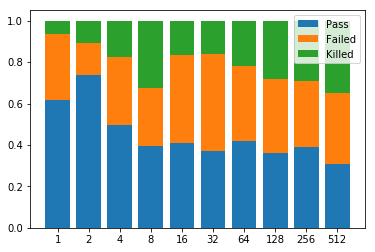

In [1188]:
analyze_status_per_ml_range(philly_df, col="core_hour", divi=3600)

14.538215881943437


,Pass,Failed,Killed
1,92105,21436,26257
2,4778,538,2235
4,1946,336,1477
8,2281,185,1175
16,965,113,838
32,956,124,612
64,1126,96,594
128,680,72,532
256,449,37,381
512,448,39,457


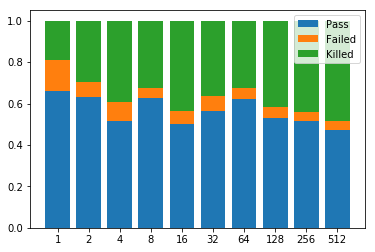

In [1189]:
analyze_status_per_ml_range(hl_df, col="core_hour", divi=3600)

13.114208395003965


,Pass,Failed,Killed
1,59018,16579,9162
2,10043,6424,1285
4,7826,4785,787
8,6198,5495,502
16,4367,5113,597
32,1190,2446,588
64,553,1381,328
128,547,1007,158
256,364,1618,195
512,348,2065,847


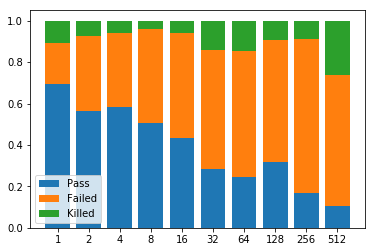

In [1081]:
analyze_status_per_ml_range(philly_df, col="wait_time", divi=600)

9.87908031177607


,Pass,Failed,Killed
1,79381,22118,33534
2,17168,118,225
4,2997,90,162
8,1641,199,133
16,2059,267,155
32,1655,98,173
64,566,55,121
128,248,29,40
256,14,2,14
512,5,0,1


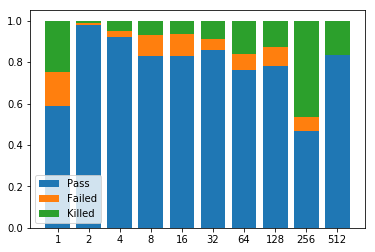

In [1082]:
analyze_status_per_ml_range(hl_df, col="wait_time", divi=600)

In [ ]:
analyze_status_per_ml_range(philly_df, col="gpu_num", divi=1)

7.0


,Pass,Failed,Killed
1,82786,29580,9921
2,1992,1055,388
4,2702,7795,1465
8,2486,6933,2277
16,373,1363,295
32,103,152,81
64,8,33,16
128,4,2,6
256,0,0,0
512,0,0,0


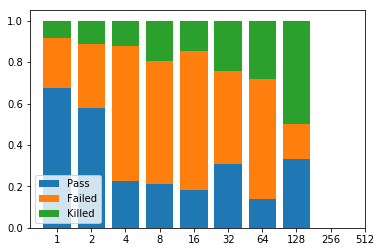

In [1070]:
analyze_status_per_ml_range(philly_df, col="gpu_num", divi=1)

7.643856189774724


,Pass,Failed,Killed
1,27732,10589,9902
2,1791,1639,2040
4,2788,1632,2166
8,10023,4027,5754
16,1673,454,1700
32,1229,283,1493
64,170,25,696
128,103,361,443
256,0,0,0
512,0,0,0


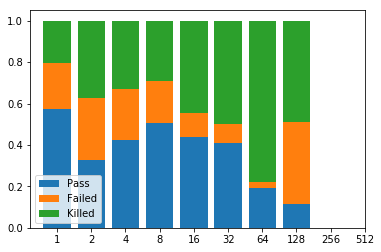

In [1071]:
analyze_status_per_ml_range(hl_df, col="gpu_num", divi=1)

13.081192417530817


,Pass,Failed,Killed
1,38242,25847,4839
2,16820,10574,1953
4,17009,1573,1160
8,6973,1441,1132
16,4243,2979,1287
32,2066,902,980
64,1896,876,1075
128,1508,963,562
256,958,855,474
512,739,903,987


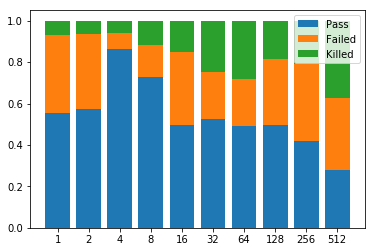

In [1079]:
analyze_status_per_ml_range(philly_df)

11.677039089258159


,Pass,Failed,Killed
1,83271,20611,22176
2,7416,1119,4827
4,4613,355,2095
8,2320,198,1307
16,2424,201,849
32,2249,123,749
64,1548,99,919
128,963,106,672
256,633,94,455
512,297,70,509


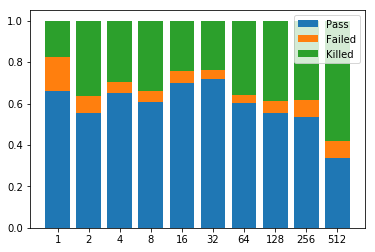

In [1080]:
analyze_status_per_ml_range(hl_df)

In [18]:
bw_df["new_status"] = bw_df.apply(func=update_status,axis=1)

In [1448]:
bw_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,wall_time,node_hour,new_status
0,9090703,USER272409U,GRP119081G,0,0,86464,2702,1539154542,11818241,233,43200,1021852389824,NM
1,9106378,USER272409U,GRP119081G,0,0,86464,2702,1539558167,12363931,242,43200,1069034929984,NM
2,9329046,USER330089U,GRP119109G,0,12,0,12,1544046589,2250476,57845,86400,432091392,NM
3,9329047,USER330089U,GRP119109G,0,12,0,12,1544046591,2308432,58188,86400,443218944,NM
4,9329048,USER330089U,GRP119109G,0,12,0,12,1544046593,2366688,57947,86400,454404096,NM
5,9329049,USER330089U,GRP119109G,0,12,0,12,1544046595,2424709,57111,86400,465544128,NM
6,9329050,USER330089U,GRP119109G,0,12,0,12,1544046597,2481879,57798,86400,476520768,NM
7,9329051,USER330089U,GRP119109G,0,12,0,12,1544046598,2539926,57690,86400,487665792,NM
8,9329052,USER330089U,GRP119109G,0,12,0,12,1544046600,2597789,61559,86400,498775488,NM
9,9329053,USER330089U,GRP119109G,0,12,0,12,1544046602,2659489,64501,86400,510621888,NM


In [19]:
mira_df_2["new_status"] = mira_df_2.apply(func=update_status,axis=1)

,Pass,Failed,Killed
ujWZX,31158,1074,8075
uJcI8,17580,517,1361
ucpfn,6106,708,169
uJjMX,3564,216,2178
uC0cS,4791,458,360
uaxcW,3569,826,924
ujQmo,2661,687,1069
u5Qp6,1695,859,1062
u7czv,1713,1026,659
uYlPU,564,956,1213


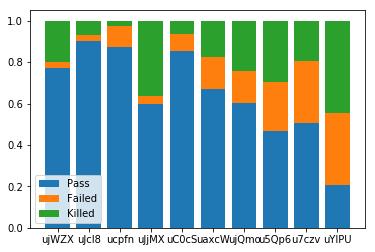

In [1020]:
analyze_status_per_ml("user", data=hl_df)

,Pass,Failed,Killed
vcaC7,33726,1763,8389
vcWoR,22546,3622,6296
vcEwI,11592,3965,3848
vcHvQ,6069,1609,1735
vcKrE,5415,960,1212
vc8Gr,4845,965,1684
vcvGl,3254,514,2330
vcKeu,3687,1111,1241
vcYVn,2697,1031,1284
vchA3,1144,954,802


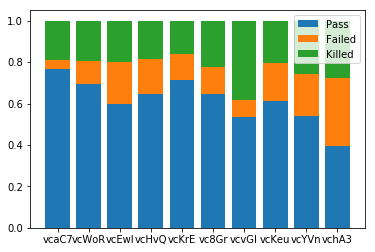

In [1021]:
analyze_status_per_ml("project", data=hl_df)

,Pass,Failed,Killed
ae8ed1,14033,1123,673
066e99,12078,903,0
e8d0f2,1449,10184,141
2c46d5,8410,907,904
4f257b,7382,334,2164
0067d1,7257,431,190
ba97e6,5473,364,119
bf8cc2,2351,3234,39
05bd59,4295,513,439
826467,3636,146,14


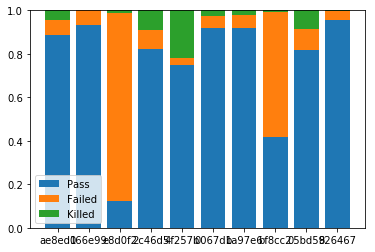

In [1022]:
analyze_status_per_ml("user", data=philly_df)

,Pass,Failed,Killed
6214e9,44316,19561,4635
11cb48,17344,4157,1056
6c71a0,11201,3583,3978
ee9e8c,2264,9677,1608
b436b2,7844,2429,1002
103959,2438,3245,42
0e4a51,1857,1669,651
7f04ca,875,736,600
ed69ec,1257,346,163
2869ce,600,826,330


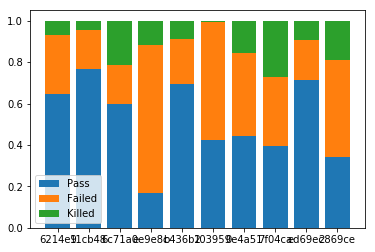

In [1023]:
analyze_status_per_ml("project", data=philly_df)

In [ ]:
analyze_status_per("user", data=mira_df_2)

In [ ]:
analyze_status_per("project", data=mira_df_2)

In [ ]:
analyze_status_per("user", data=bw_df)

In [ ]:
analyze_status_per("project", data=bw_df)

In [ ]:
analyze_attribute_per(u="user", data=mira_df_2) 

In [ ]:
analyze_attribute_per(u="project", data=mira_df_2) 

In [ ]:
analyze_attribute_per_ml(u="user", data=hl_df, status=["COMPLETED", "FAILED", "CANCELLED"]) 

In [ ]:
analyze_attribute_per_ml(u="project", data=hl_df, status=["COMPLETED", "FAILED", "CANCELLED"]) 

In [ ]:
analyze_attribute_per_ml(u="user", data=philly_df, status=["Pass", "Failed", "Killed"]) 

In [ ]:
analyze_attribute_per_ml(u="project", data=philly_df, status=["Pass", "Failed", "Killed"]) 

In [ ]:
analyze_attribute_per(u="project", data=hl_df) 

In [ ]:
aaa = pd.read_csv("trace-data/cluster_machine_list")
aaa[" number of GPUs"].sum()

In [13]:
columns

['job',
 'user',
 'project',
 'state',
 'gpu_num',
 'cpu_num',
 'node_num',
 'submit_time',
 'wait_time',
 'run_time',
 'wall_time',
 'node_hour']

In [15]:
file_string = []
with open("trace-data/cluster_job_log") as f:
    for line in f:
        file_string.append(line.strip())
philly_logs = json.loads("".join(file_string))
print(philly_logs[0])
philly_logs.sort(key=lambda x: date2stamp(x["submitted_time"]) if x != "None" else 0)
philly_df_data = []
for i in philly_logs:
    for j in i["attempts"]:
        if j["end_time"] != "None" and j["start_time"] != "None" and j["detail"]:
            time_diff = date2stamp(j["end_time"]) - date2stamp(j["start_time"])
            if time_diff >=0:
                temp = [i["jobid"],
                        i["user"],
                        i["vc"],
                        i["status"],
                        sum(len(k["gpus"]) for k in j["detail"]),
                        0,
                        len(j["detail"]),
                        date2stamp(i["submitted_time"]),
                        date2stamp(j["start_time"])-date2stamp(i["submitted_time"]),
                        time_diff,
                        0,
                        time_diff*len(j["detail"])
                       ]
                philly_df_data.append(temp)
philly_df = pd.DataFrame(philly_df_data, columns=columns)

{'status': 'Pass', 'vc': '11cb48', 'jobid': 'application_1506638472019_17235', 'attempts': [{'start_time': '2017-10-09 07:02:05', 'end_time': '2017-10-09 07:03:11', 'detail': [{'ip': 'm372', 'gpus': ['gpu0']}]}], 'submitted_time': '2017-10-09 07:01:55', 'user': '066e99'}


In [ ]:
analyze_attribute_per(u="user", data=philly_df) 

In [ ]:
analyze_attribute_per(u="project", data=philly_df) 

In [ ]:
philly_logs_wait = []
for i in philly_logs:
    for j in i["attempts"]:
        if j["start_time"] != "None" and i["submitted_time"] != "None" and j["end_time"] != "None" :
            time_diff = date2stamp(j["start_time"]) - date2stamp(i["submitted_time"])
            if time_diff >=0:
                philly_logs_wait.append(time_diff)
philly_logs_wait = np.array(philly_logs_wait)

In [ ]:
philly_logs_interval = []
prev = 0
for i in philly_logs:
    if prev == 0:
        prev = date2stamp(i["submitted_time"])
        continue        
    time_diff = date2stamp(i["submitted_time"]) - prev
    prev = date2stamp(i["submitted_time"])
    if time_diff >=0:
        philly_logs_interval.append(time_diff)
philly_logs_interval = np.array(philly_logs_interval)
print(len(philly_logs_interval))

In [ ]:
philly_logs_node = []
for i in philly_logs:
    for j in i["attempts"]:
        if j.get("detail", 0):
            for k in j["detail"]:
                philly_logs_node.append(len(k["gpus"]))
philly_logs_node = np.array(philly_logs_node)
print(len(philly_logs_node))

In [37]:
philly_logs_corehour = []
for i in philly_logs:
    for j in i["attempts"]:
        if j["end_time"] != "None" and j["start_time"] != "None":
            time_diff = date2stamp(j["end_time"]) - date2stamp(j["start_time"])
            if time_diff > 0:
                if j.get("detail", 0):
                    for k in j["detail"]:
                        philly_logs_corehour.append(len(k["gpus"])*(date2stamp(j["end_time"])-date2stamp(j["start_time"])))
philly_logs_corehour = np.array(philly_logs_corehour)
print(len(philly_logs_corehour))

171886


In [38]:
philly_logs_s_e_c = []
for i in philly_logs:
    for j in i["attempts"]:
        if j["end_time"] != "None" and j["start_time"] != "None":
            time_diff = date2stamp(j["end_time"]) - date2stamp(j["start_time"])
            if time_diff > 0:
                if j.get("detail", 0):
                    for k in j["detail"]:
                        philly_logs_s_e_c.append((int(date2stamp(j["start_time"])), int(date2stamp(j["end_time"])), len(k["gpus"]))) 
print(len(philly_logs_s_e_c))

171886


In [39]:
philly_logs[0]

{'status': 'Killed',
 'vc': '6214e9',
 'jobid': 'application_1501012364013_9680',
 'attempts': [{'start_time': 'None',
   'end_time': '2017-09-12 18:15:06',
   'detail': [{'ip': 'm345', 'gpus': ['gpu0']}]},
  {'start_time': '2017-09-12 18:15:16',
   'end_time': '2017-09-28 20:09:19',
   'detail': [{'ip': 'm180', 'gpus': ['gpu0']}]}],
 'submitted_time': '2017-08-07 10:03:01',
 'user': 'a547a3'}

In [12]:
from datetime import datetime
from collections import Counter
import os 
class Job:
    def __init__(self, string):
        self.d = {}
        self.type = "E"
        self.process(string)


    def process(self, string):
        slist = string.split()
        self.d['job_id'] = int(slist[1].split(";")[2].split(".")[0])
        self.type = slist[1][9]
        if self.type == "E":
            for i in slist:
                if "=" in i:
                    if "user" in i:
                        isplit = i.split("=")
                        self.d["user"] = "".join(isplit[1:])
                    else:
                        isplit = i.split("=")
                        self.d[isplit[0]] = "".join(isplit[1:])

def time2sec(string):
    h, m, s = string.split(":")
    return int(h)*3600+int(m)*60+int(s)
jobs = []
cpu_jobs = []
gpu_jobs = []
job_wall_time = []
job_run_time = []
cpu_job_wall_time = []
cpu_job_run_time = []
gpu_job_wall_time = []
gpu_job_run_time = []
c = Counter()
job_name_counter = Counter()
num = 0
for filename in os.listdir("2019"):
    with open(os.path.join("2019", filename)) as f:
        for line in f:
#             print(line)
            job = Job(line.strip())
            try:
                if job.type == "E" and "unique_node_count" in job.d:
                    if "xk" in job.d["Resource_List.nodes"]:
                        job.d["type"] = "gpu"
                        gpu_jobs.append(job)
                        gpu_job_wall_time.append(time2sec(job.d["Resource_List.walltime"]))
                        gpu_job_run_time.append(int(job.d["end"])-int(job.d["start"]))
                    else:
                        job.d["type"] = "cpu"
                        cpu_jobs.append(job) 
                        cpu_job_wall_time.append(time2sec(job.d["Resource_List.walltime"]))
                        cpu_job_run_time.append(int(job.d["end"])-int(job.d["start"]))
                    jobs.append(job)
                c[job.type] += 1
                
#             job_name_counter[job.d["jobname"]] += 1
#                 job_wall_time.append(time2sec(job.d["Resource_List.walltime"]))
#                 job_run_time.append(int(job.d["end"])-int(job.d["start"]))
            except:
                pass
    num += 1
    if num > 120:
        break
job_wall_time =  np.array(job_wall_time)
job_run_time =  np.array(job_run_time)
cpu_job_wall_time =  np.array(cpu_job_wall_time)
cpu_job_run_time =  np.array(cpu_job_run_time)
gpu_job_wall_time =  np.array(gpu_job_wall_time)
gpu_job_run_time =  np.array(gpu_job_run_time)
diff = job_wall_time - job_run_time
total_count = len(diff)
print(len(job_wall_time))
print(len(job_run_time))
print(c)
print(total_count)
assert len(job_wall_time) == len(job_run_time)

0
0
Counter({'Q': 420029, 'S': 361452, 'E': 358579, 'D': 139736, 'A': 4179})
0


In [ ]:
with open(os.path.join("2019", "20190101")) as f:
        for line in f:
            for i in line.split():
                print(i)
            break

In [13]:
# for i in cpu_jobs:
#     i.d["qtime"] = int(i.d["qtime"])
# for i in gpu_jobs:
#     i.d["qtime"] = int(i.d["qtime"])
for i in jobs:
    i.d["qtime"] = int(i.d["qtime"])
# cpu_jobs.sort(key=lambda x:x.d["qtime"])
# gpu_jobs.sort(key=lambda x:x.d["qtime"])
jobs.sort(key=lambda x:x.d["qtime"])


In [ ]:
jobs[0].d

In [14]:
bw_df_data = []
for i in jobs:
    timeout = 1 if int(i.d["end"]) - int(i.d["start"])>= time2sec(i.d["Resource_List.walltime"]) else 0
    temp = [i.d["job_id"], 
            i.d["user"],
            i.d["group"],
            timeout*1000 + int(i.d["Exit_status"]),
#             int(i.d["Exit_status"]),
            int(i.d["unique_node_count"]) if i.d["type"] == "gpu" else 0, 
            int(i.d["total_execution_slots"]) if i.d["type"] == "cpu" else 0, 
            int(i.d["unique_node_count"]),
            int(i.d["qtime"]),
            int(i.d["start"])-int(i.d["qtime"]),
            int(i.d["end"]) - int(i.d["start"]),
            time2sec(i.d["Resource_List.walltime"]),
            int(i.d["total_execution_slots"])*(int(i.d["start"])-int(i.d["qtime"]))]
    bw_df_data.append(temp)
bw_df = pd.DataFrame(bw_df_data, columns=columns)

In [ ]:
analyze_attribute_per(u="user", data=bw_df) 

In [ ]:
analyze_attribute_per(u="project", data=bw_df) 

In [ ]:
for i in [bw_df, mira_df_2, philly_df, hl_df]:
    i.sort_values(by=['submit_time'], inplace=True)
    i["slowdown"] = i.apply(lambda row: row["wait_time"]/(row["run_time"]+10), axis=1)

In [1450]:
hl_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,node_hour,wall_time,core_hour
0,582026,u4TfD,vcWoR,COMPLETED,1,1,1,1.590638e+09,0.0,84.0,84.0,0,84.0
1,582027,u4TfD,vcWoR,COMPLETED,1,1,1,1.590638e+09,0.0,87.0,87.0,0,87.0
2,582028,u4TfD,vcWoR,COMPLETED,1,1,1,1.590639e+09,0.0,83.0,83.0,0,83.0
3,582029,ubfUm,vcJLV,FAILED,1,1,1,1.590639e+09,0.0,30.0,30.0,0,30.0
4,582030,uqOcl,vchbv,COMPLETED,8,40,1,1.590639e+09,0.0,656.0,656.0,0,5248.0
5,582031,uDfFG,vcHvQ,FAILED,0,1,1,1.590639e+09,0.0,2.0,2.0,0,0.0
6,582032,uDfFG,vcHvQ,COMPLETED,0,1,1,1.590639e+09,0.0,42.0,42.0,0,0.0
7,582033,u7czv,vcP2J,CANCELLED,1,1,1,1.590639e+09,0.0,2115.0,2115.0,0,2115.0
8,582034,u4TfD,vcWoR,COMPLETED,1,1,1,1.590639e+09,0.0,84.0,84.0,0,84.0
9,582035,ubfUm,vcJLV,FAILED,1,1,1,1.590639e+09,0.0,25.0,25.0,0,25.0


In [ ]:
job_interval = np.diff([int(i.d["qtime"]) for i in jobs])
cpu_job_interval = np.diff([int(i.d["qtime"]) for i in cpu_jobs])
gpu_job_interval = np.diff([int(i.d["qtime"]) for i in gpu_jobs])

In [ ]:
job_request_node = [int(i.d["total_execution_slots"]) for i in jobs if "total_execution_slots" in i.d]
print(len(job_request_node))

In [182]:
cpu_job_request_node = [int(i.d["total_execution_slots"]) for i in cpu_jobs if "total_execution_slots" in i.d]
gpu_job_request_node = [int(i.d["total_execution_slots"]) for i in cpu_jobs if "total_execution_slots" in i.d]

In [183]:
job_core_hour = [int(i.d["total_execution_slots"])*(int(i.d["end"])-int(i.d["start"])) for i in jobs if "total_execution_slots" in i.d]
job_core_hour = np.array(job_core_hour)
print(len(job_core_hour))

603594


In [230]:
cpu_job_core_hour = [int(i.d["total_execution_slots"])*(int(i.d["end"])-int(i.d["start"])) for i in cpu_jobs if "total_execution_slots" in i.d]
gpu_job_core_hour = [int(i.d["total_execution_slots"])*(int(i.d["end"])-int(i.d["start"])) for i in gpu_jobs if "total_execution_slots" in i.d]


In [204]:
def get_wait_time(job):
    return int(job.d["start"]) - int(job.d["qtime"])
def get_run_time(job):
    return int(job.d["end"]) - int(job.d["start"])
for job in jobs:
    job.wait_time = get_wait_time(job)
    job.run_time = get_run_time(job)

In [205]:
for job in cpu_jobs:
    job.wait_time = get_wait_time(job)
    job.run_time = get_run_time(job)
for job in gpu_jobs:
    job.wait_time = get_wait_time(job)
    job.run_time = get_run_time(job)

In [1056]:
list(hl_df)

['job',
 'user',
 'project',
 'state',
 'gpu_num',
 'cpu_num',
 'node_num',
 'submit_time',
 'wait_time',
 'run_time',
 'node_hour']

In [1087]:
scaler.fit_transform(temp_df[["submit_time", "node_num"]].values)

array([[-2.20968088, -0.16308336],
       [-2.20964466, -0.16308336],
       [-2.20958648, -0.16308336],
       ...,
       [ 1.88463513, -0.16308336],
       [ 1.88471989,  1.75570773],
       [ 1.88479309, -0.16308336]])

In [1093]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
ratio = 0.2
features = ["user", "project", "gpu_num", "submit_time", "wait_time"]
temp_df = mira_df_2[mira_df_2["user"]==94435408522577].copy()
temp_df["user"] = temp_df.astype('category')["user"].cat.codes
temp_df["project"] = temp_df.astype('category')["project"].cat.codes
temp_df["state"] = temp_df.astype('category')["state"].cat.codes
temp_df[features] = scaler.fit_transform(temp_df[features])
train = temp_df[:-int(len(temp_df)*ratio)]
test = temp_df[-int(len(temp_df)*ratio):]
clf = LogisticRegression(random_state=0).fit(train[features],train["state"])
ypreds = clf.predict(test[features])
acc = accuracy_score(test["state"], ypreds)
f1 = precision_recall_fscore_support(test["state"], ypreds, average="weighted")
print(acc)
print(f1)

0.9912170639899623
(0.9825112679448812, 0.9912170639899623, 0.9868449660391558, None)


/home/dzhang16/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


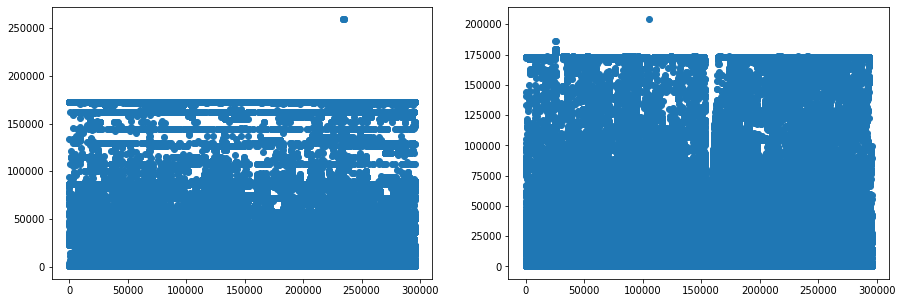

In [73]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.scatter(range(len(job_wall_time)), job_wall_time)
ax2.scatter(range(len(job_wall_time)), job_run_time)

(array([1.79224e+05, 4.27530e+04, 1.81860e+04, 1.19290e+04, 1.64990e+04,
        3.87400e+03, 6.04100e+03, 3.98700e+03, 1.32920e+04, 3.00000e+00]),
 array([1.00000e+00, 2.04060e+04, 4.08110e+04, 6.12160e+04, 8.16210e+04,
        1.02026e+05, 1.22431e+05, 1.42836e+05, 1.63241e+05, 1.83646e+05,
        2.04051e+05]),
 <BarContainer object of 10 artists>)

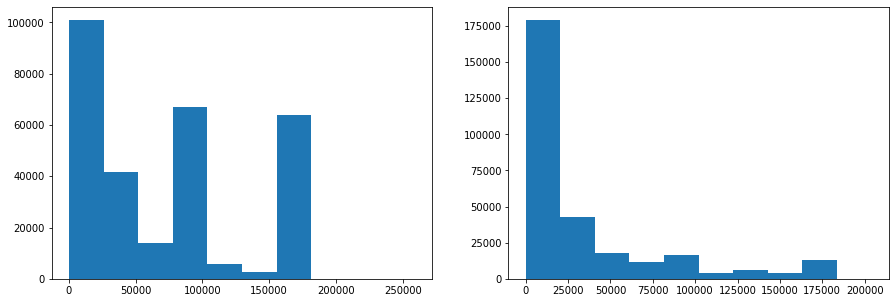

In [74]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.hist(job_wall_time)
ax2.hist(job_run_time)

(array([4.50000e+01, 1.40191e+05, 3.65850e+04, 2.24270e+04, 2.17060e+04,
        3.58420e+04, 3.07500e+03, 6.68000e+03, 3.85200e+03, 2.53850e+04]),
 array([-31251., -10846.,   9559.,  29964.,  50369.,  70774.,  91179.,
        111584., 131989., 152394., 172799.]),
 <BarContainer object of 10 artists>)

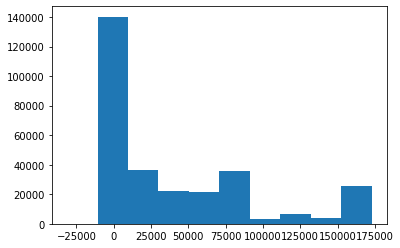

In [75]:
plt.hist(diff)

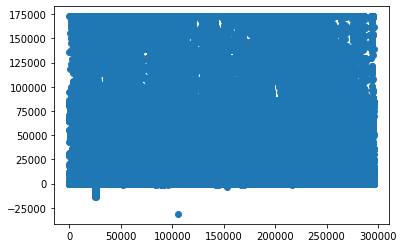

In [76]:
plt.scatter(range(len(diff)), diff)

In [16]:
le0 = diff[diff<=0]
gt0 = diff[diff>0]
le0where = np.argwhere(diff <= 0)
gt0where = np.argwhere(diff > 0)
print("Wall time <= Run time: {:.2%}".format(len(le0)/total_count))
print("Wall time > Run time: {:.2%}".format(len(gt0)/total_count))

Wall time <= Run time: 13.39%
Wall time > Run time: 86.61%


(array([1.07244e+05, 4.17160e+04, 1.19810e+04, 7.25930e+04, 7.68700e+03,
        4.21700e+03, 6.51270e+04, 0.00000e+00, 0.00000e+00, 6.00000e+00]),
 array([   300.,  26190.,  52080.,  77970., 103860., 129750., 155640.,
        181530., 207420., 233310., 259200.]),
 <a list of 10 Patch objects>)

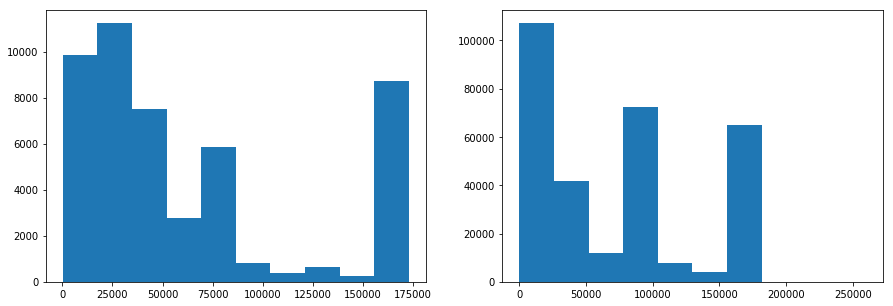

In [237]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.hist(np.take(job_wall_time, le0where))
ax2.hist(np.take(job_wall_time, gt0where))

In [192]:

#plot_cdf([0.2,0.1,0.1,0.2,0.1,0.3])

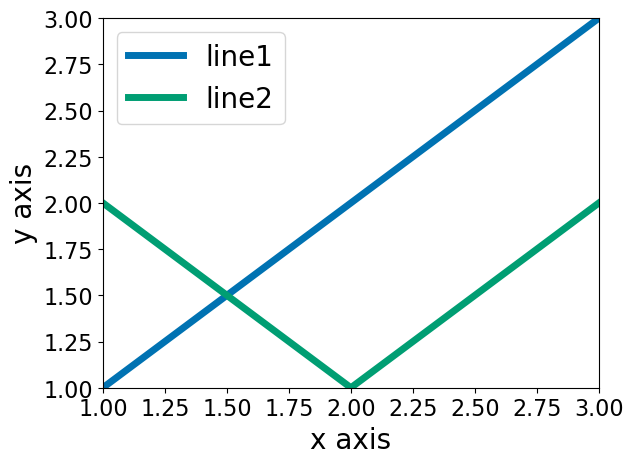

In [46]:
import matplotlib
# params = {
#    'axes.labelsize': 8,
# #    'text.fontsize': 8,
#    'legend.fontsize': 10,
#    'xtick.labelsize': 10,
#    'ytick.labelsize': 10,
#    'text.usetex': False,
#    'figure.figsize': [4.5, 4.5]
#    }
# print(matplotlib.rcParams.keys())
# matplotlib.rcParams.update(params)
# matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.style.use('seaborn-colorblind')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.rc('legend',fontsize=20)
x1 = [1, 2, 3]
y1 = [1, 2, 3]
x2 = [1, 2, 3]
y2 = [2, 1, 2]
plt.plot(x1, y1, linewidth=5)
plt.plot(x2, y2, linewidth=5)
plt.xlabel("x axis", fontsize=20)
plt.ylabel("y axis", fontsize=20)
plt.margins(0)
plt.legend(["line1","line2"])

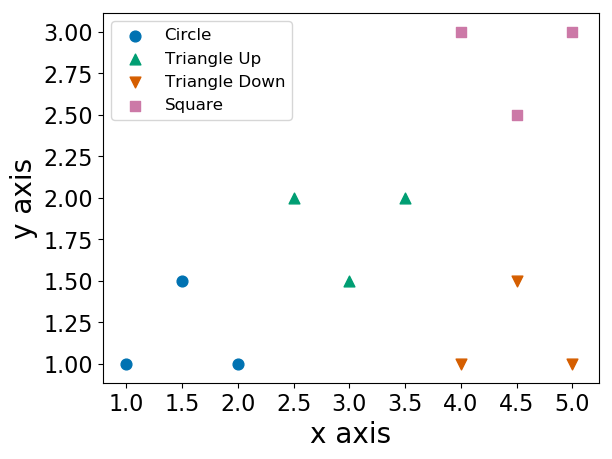

In [61]:
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.rc('legend',fontsize=12)
plt.scatter([1,1.5,2], [1,1.5,1], marker="o",s=60)
plt.scatter([2.5,3,3.5], [2,1.5,2], marker="^",s=60)
plt.scatter([4,4.5,5], [1,1.5,1], marker="v",s=60)
plt.scatter([4,4.5,5], [3,2.5,3], marker="s",s=60)
plt.xlabel("x axis", fontsize=20)
plt.ylabel("y axis", fontsize=20)
plt.legend(["Circle","Triangle Up", "Triangle Down", "Square"])

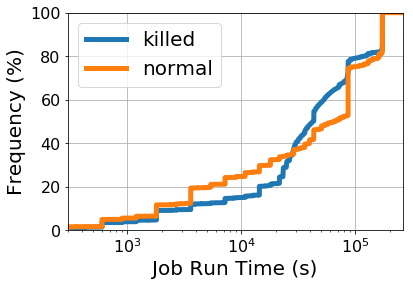

In [17]:
plot_cdf(np.take(job_wall_time, le0where), 500, "")
plot_cdf(np.take(job_wall_time, gt0where), 500, "Job Run Time (s)")
plt.legend(["killed","normal"])
plt.xscale("log")

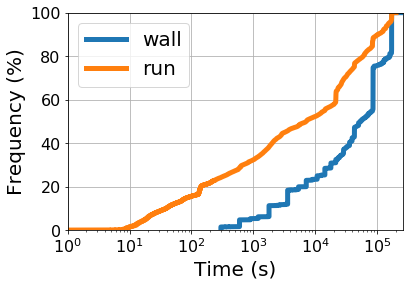

In [18]:
plot_cdf(job_wall_time, 5000,"")
plot_cdf(job_run_time, 5000,"Time (s)")
plt.legend(["wall","run"])
plt.xscale("log")


[      0.      151307.7947  302615.5894  453923.3841  605231.1788
  756538.9735  907846.7682 1059154.5629 1210462.3576 1361770.1523]
[147560   2298    952    495    275    227    134     94     59     70]
[96.66430836 98.16969316 98.79333386 99.11760082 99.29774913 99.44645337
 99.53423473 99.5958127  99.6344627  99.68031863]
0.18834342163876006


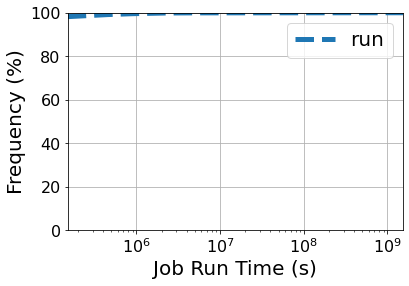

In [368]:
plot_cdf(philly_logs_duration, 10000,"Job Run Time (s)")
plt.legend(["run"])
plt.xscale("log")
tl = len(philly_logs_duration)
lt60s = len(philly_logs_duration[philly_logs_duration < 60])
print(lt60s/tl)

[300.   343.38 386.76 430.14 473.52 516.9  560.28 603.66 647.04 690.42]
[ 255    6    3    0    6   10 1269    0    1   38]
[0.44193342 0.45233185 0.45753107 0.45753107 0.4679295  0.48526022
 2.68452886 2.68452886 2.68626194 2.75211868]
[ 21.      64.4444 107.8888 151.3332 194.7776 238.222  281.6664 325.1108
 368.5552 411.9996]
[ 131  534 2387 1806 1191  853  847  553  370  336]
[ 0.22703246  1.15249302  5.28933641  8.41926483 10.48335384 11.96166444
 13.42957661 14.38796555 15.02920227 15.61151453]


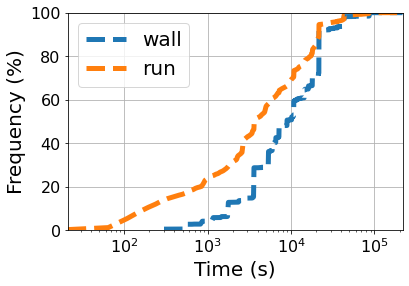

In [384]:
plot_cdf(mira_df["WallTimeRequested"], 5000,"Time (s)")
plot_cdf(mira_df["Runtime"], 5000,"Time (s)")
plt.legend(["wall","run"])
plt.xscale("log")

In [240]:
import numpy as np
length = 128
stride = 128
def get_mean_std(a, count):
    z = []
    for i in range(0, len(a), stride):
        z.append((np.mean(a[i:i+length]), np.std(a[i:i+length])))
    return z[:count]

def clustering(a):
    count = 10
    for index in range(len(a)):
        a[index] = get_mean_std(a[index], count)
    markers = "o^vs*h"
    for i, marker in zip(a, markers):
        plt.scatter(*list(zip(*i)),marker=marker,s=60)


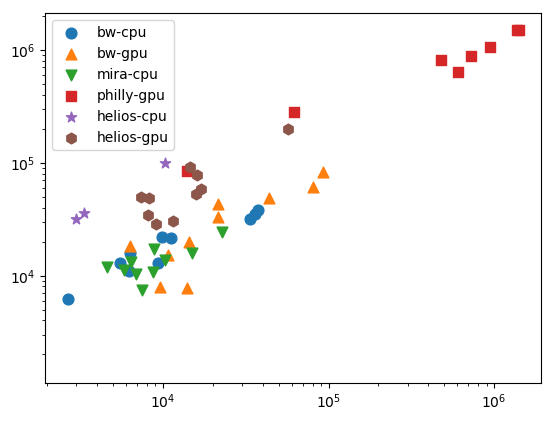

In [241]:
clustering([cpu_job_run_time, gpu_job_run_time, mira_df["Runtime"], philly_logs_duration, df_cpu["duration"], df_gpu["duration"]])
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")
plt.yscale("log")

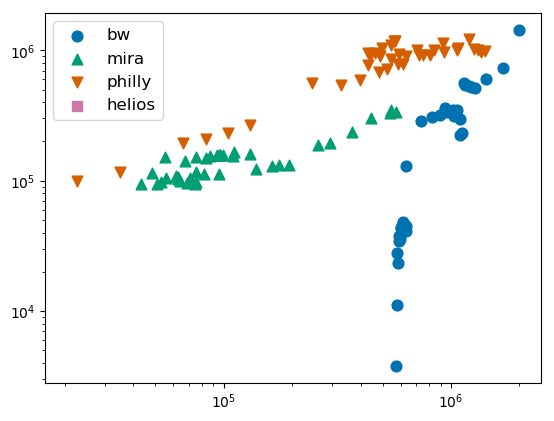

In [139]:
clustering([i.wait_time for i in jobs], mira_df["EligibleQueueTime"], philly_logs_wait, df["wait_time"])
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")

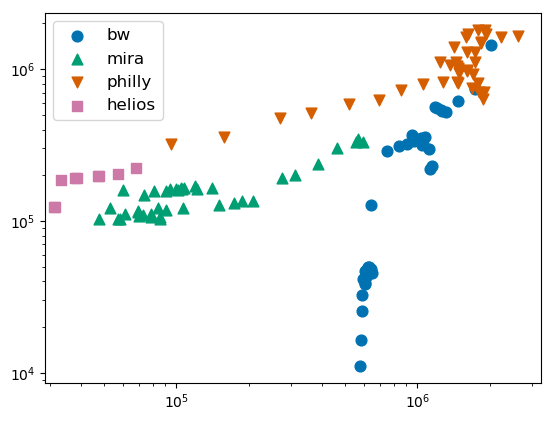

In [140]:
clustering(np.array([i.wait_time for i in jobs])+np.array(job_run_time), mira_df["EligibleQueueTime"]+mira_df["Runtime"], 
           np.array(philly_logs_wait[:152516])+np.array(philly_logs_duration), df["wait_time"]+df["duration"])
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")

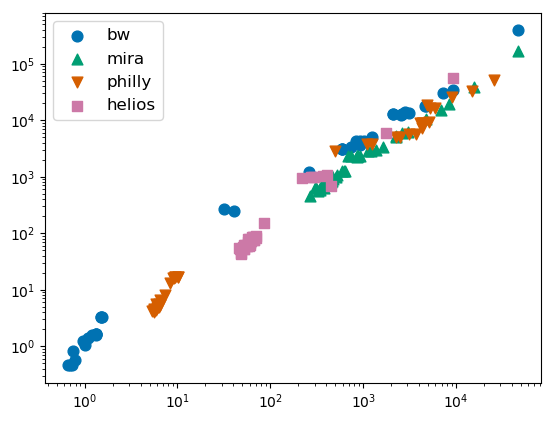

In [141]:
clustering(job_interval, mira_submit_diff[1:], 
           philly_logs_interval, df_submit_diff[1:])
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")

(1, 1000000)

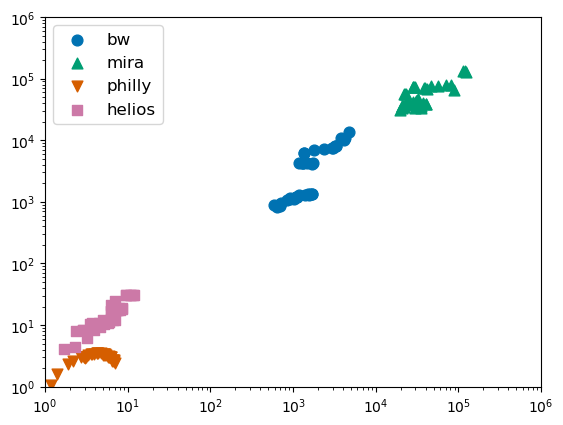

In [142]:
clustering(job_request_node, mira_df["#CoresRequested"], 
           philly_logs_node, df["cpu_num"])
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")
plt.xlim(1, 10**6)
plt.ylim(1, 10**6)

(1, 1000000)

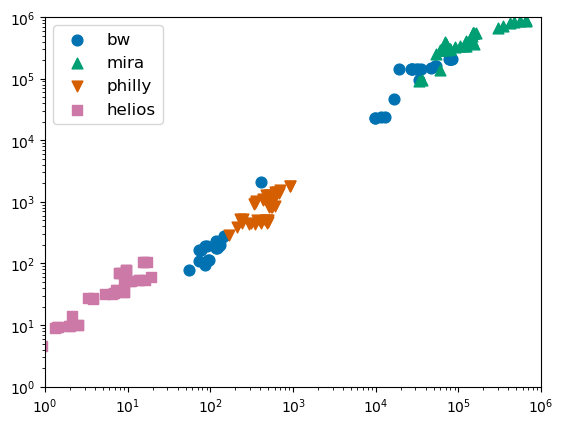

In [145]:
clustering(job_core_hour/3600, mira_df["#CoreSecondsUsed"]/3600, 
           philly_logs_corehour/3600, df["core_hour"]/3600)
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")
plt.xlim(1, 10**6)
plt.ylim(1, 10**6)

(1, 1000000)

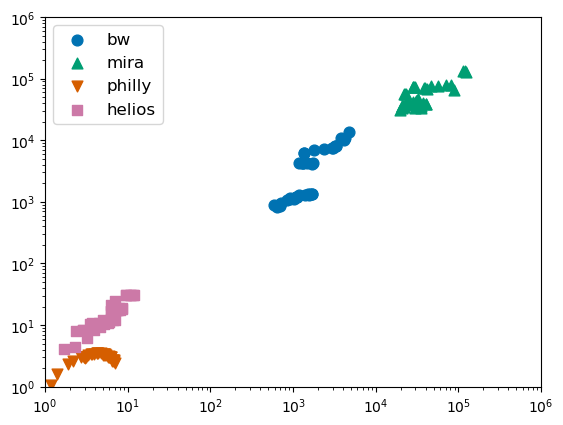

In [144]:
clustering(job_request_node, mira_df["#CoresRequested"], 
           philly_logs_node, df["cpu_num"])
plt.legend(["bw", "mira", "philly","helios"])
plt.xscale("log")
plt.yscale("log")
plt.xlim(1, 10**6)
plt.ylim(1, 10**6)

In [467]:
def plot_cdf(x,bins ,xlabel, ylabel="Frequency (%)",color="", linestyle="--"):
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    #y, x = np.histogram(y, bins=bins, range=None, normed=None, weights=None, density=None)
#     y = [1]*len(x)
#     cdf = np.cumsum(y)
#     cdf = 100*cdf/cdf[-1]
    x = np.sort(x)
    cdf = 100*np.arange(len(x)) / float(len(x))
    if color:
        plt.plot(x, cdf, linestyle=linestyle, linewidth=5, color=color)
    else:
        plt.plot(x, cdf, linestyle=linestyle, linewidth=5)
    plt.xlabel(xlabel, fontsize=20)
    plt.ylabel(ylabel, fontsize=20)
    plt.margins(0)
    plt.ylim(0, 100)
    plt.grid(True)


In [370]:
def plot_cdf_attribute(attr="run_time"):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0][attr], 100000,"Time (s)")
    plot_cdf(bw_df[bw_df["gpu_num"]!=0][attr], 100000,"Time (s)")
    plot_cdf(mira_df_2[attr], 100000,"Time (s)")
    plot_cdf(philly_df[attr], 100000,"Job Run Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0][attr], 100000,"Job Run Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0][attr], 100000,"Job Run Time (s)")
    plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
    plt.xscale("log")
def plot_cdf_attribute_cpu(attr="run_time", label=""):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0][attr], 100000,"Time (s)")
    plot_cdf(mira_df_2[attr], 100000,"Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0][attr], 100000,label)
    plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
    plt.xscale("log")
def plot_cdf_attribute_gpu(attr="run_time", label=""):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]!=0][attr], 100000,"Time (s)")
    plot_cdf(philly_df[attr], 100000,"Job Run Time (s)", color="red")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0][attr], 100000,label,color="green")
    plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
    plt.xscale("log")

In [378]:
def plot_cdf_attribute_user(attr="run_time", label=""):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0].groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(bw_df[bw_df["gpu_num"]!=0].groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(mira_df_2.groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(philly_df.groupby("user").median()[attr], 100000,"Job Run Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0].groupby("user").median()[attr], 100000,"Job Run Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0].groupby("user").median()[attr], 100000, label)
    plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
    plt.xscale("log")
def plot_cdf_attribute_cpu_user(attr="run_time", label=""):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0].groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(mira_df_2.groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0].groupby("user").median()[attr], 100000,label)
    plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
    plt.xscale("log")
def plot_cdf_attribute_gpu_user(attr="run_time", label=""):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]!=0].groupby("user").median()[attr], 100000,"Time (s)")
    plot_cdf(philly_df.groupby("user").median()[attr], 100000,"Job Run Time (s)", color="red")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0].groupby("user").median()[attr], 100000,label, color="green")
    plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
    plt.xscale("log")

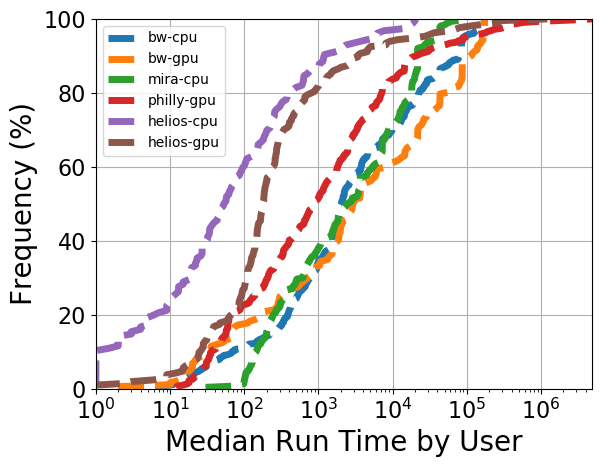

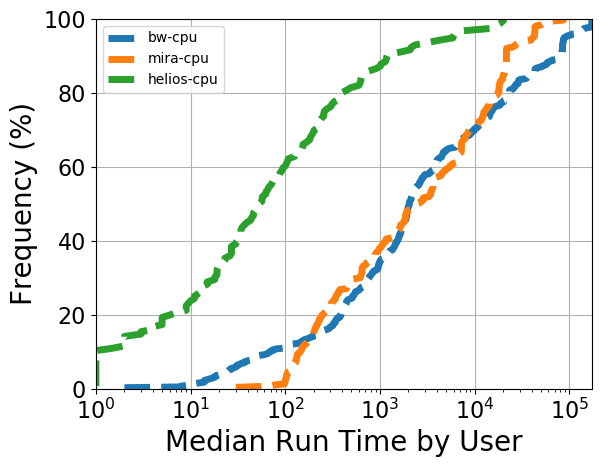

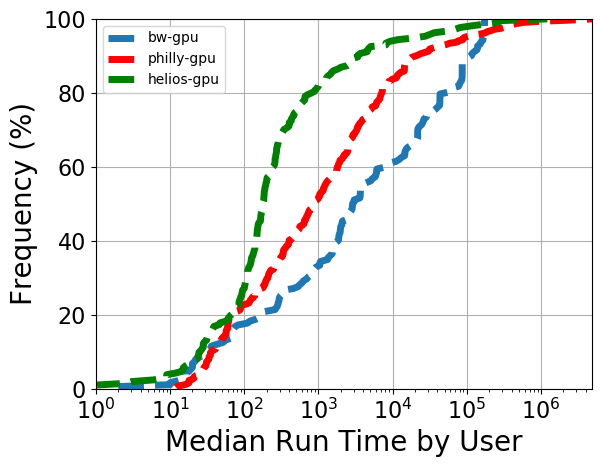

In [379]:
plot_cdf_attribute_user(attr="run_time", label="Median Run Time by User")
plot_cdf_attribute_cpu_user(attr="run_time", label="Median Run Time by User")
plot_cdf_attribute_gpu_user(attr="run_time", label="Median Run Time by User")

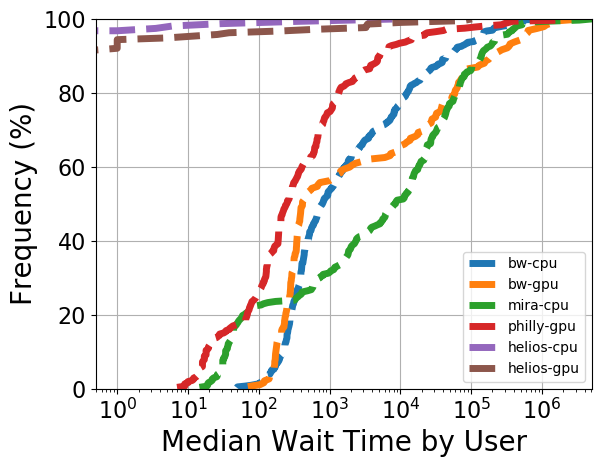

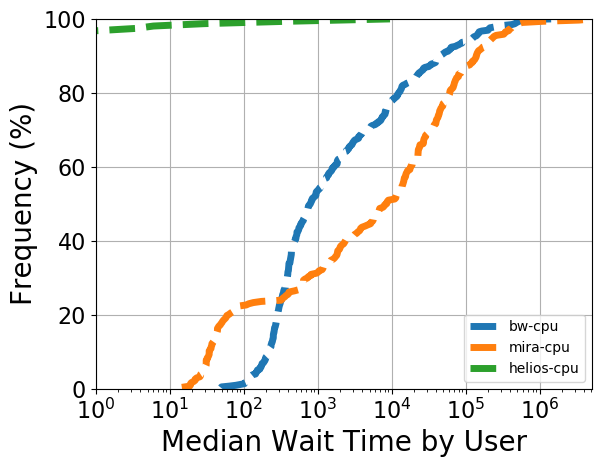

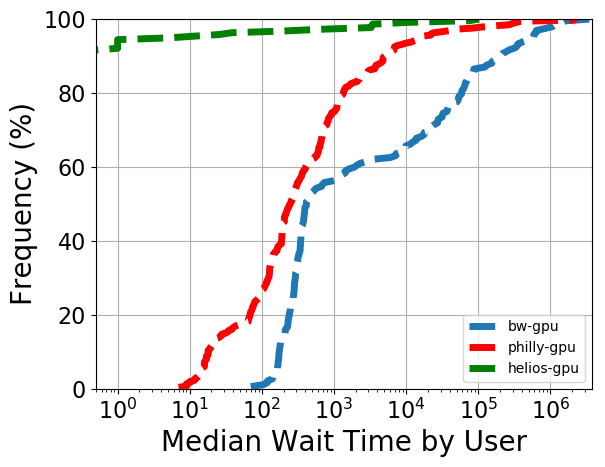

In [380]:
plot_cdf_attribute_user(attr="wait_time", label="Median Wait Time by User")
plot_cdf_attribute_cpu_user(attr="wait_time", label="Median Wait Time by User")
plot_cdf_attribute_gpu_user(attr="wait_time", label="Median Wait Time by User")

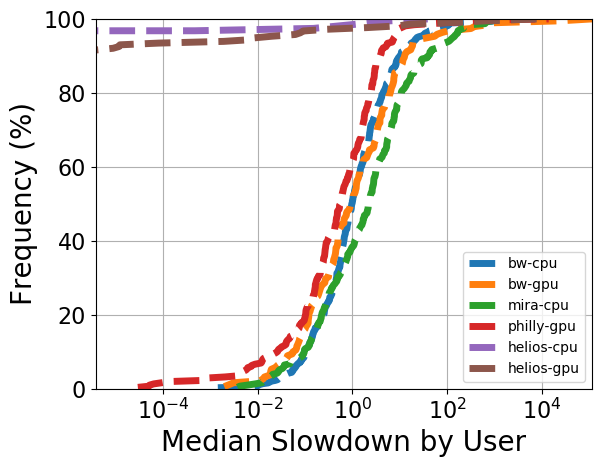

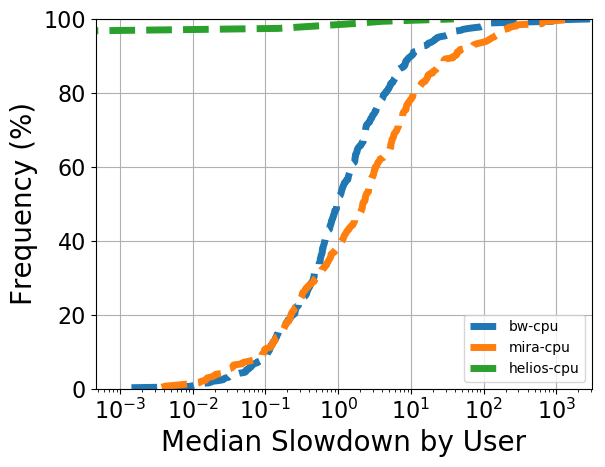

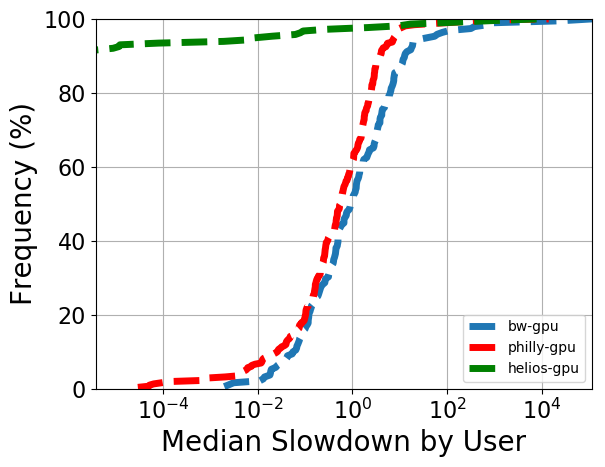

In [386]:
plot_cdf_attribute_user(attr="slowdown", label="Median Slowdown by User")
plot_cdf_attribute_cpu_user(attr="slowdown", label="Median Slowdown by User")
plot_cdf_attribute_gpu_user(attr="slowdown", label="Median Slowdown by User")

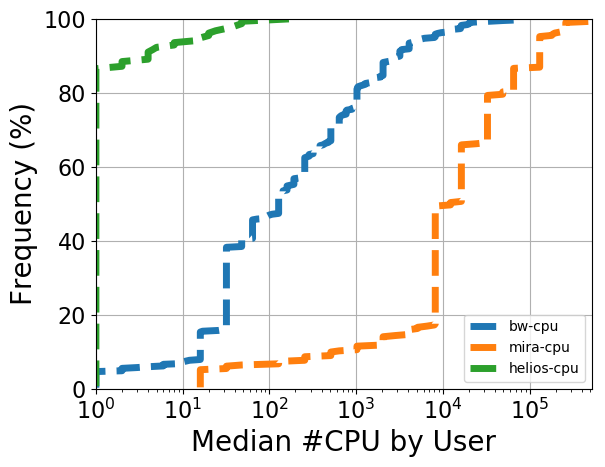

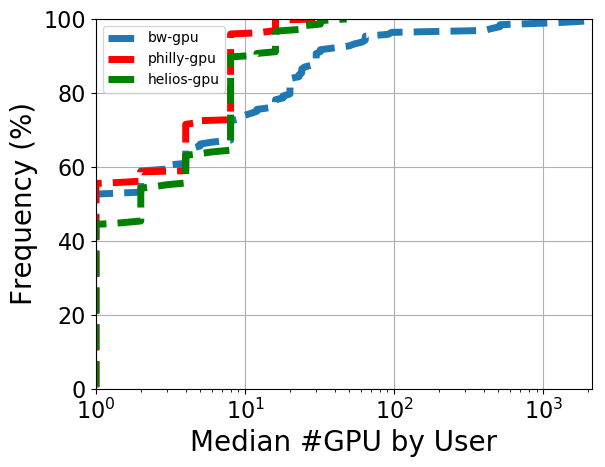

In [388]:
# plot_cdf_attribute_user(attr="slowdown", label="Median Slowdown by User")
plot_cdf_attribute_cpu_user(attr="cpu_num", label="Median #CPU by User")
plot_cdf_attribute_gpu_user(attr="gpu_num", label="Median #GPU by User")

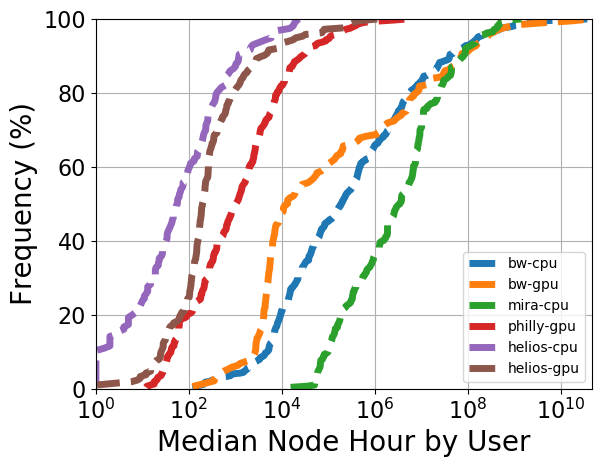

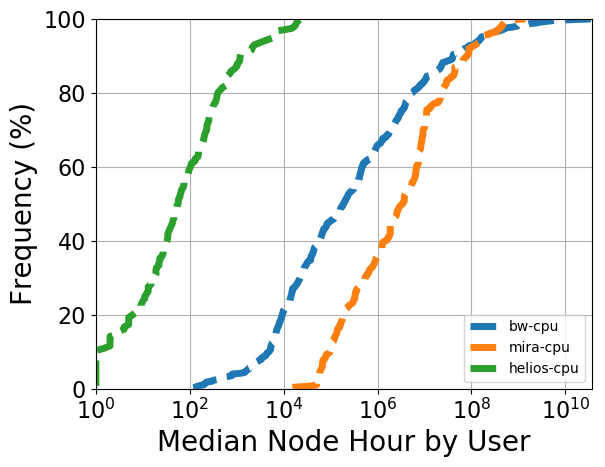

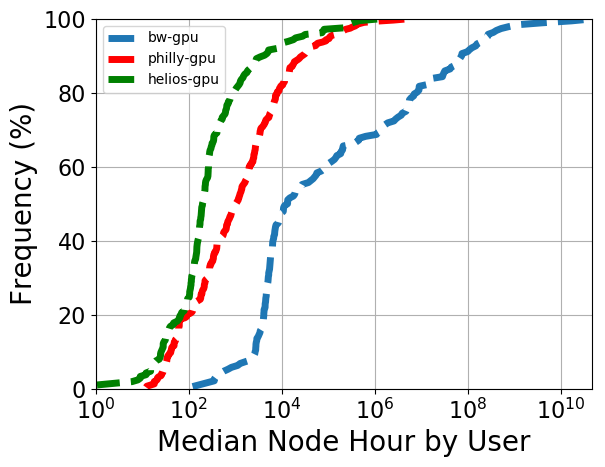

In [389]:
plot_cdf_attribute_user(attr="node_hour", label="Median Node Hour by User")
plot_cdf_attribute_cpu_user(attr="node_hour", label="Median Node Hour by User")
plot_cdf_attribute_gpu_user(attr="node_hour", label="Median Node Hour by User")

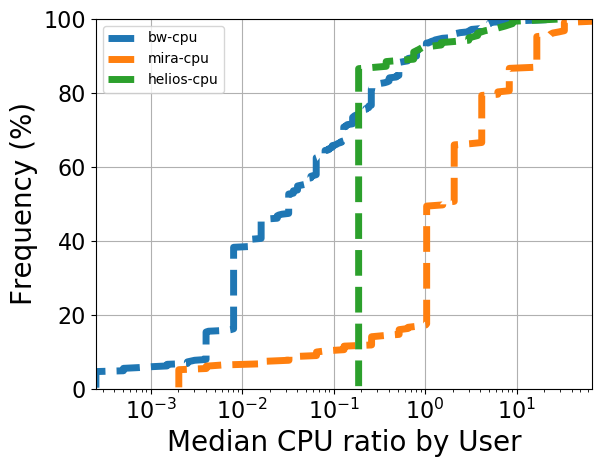

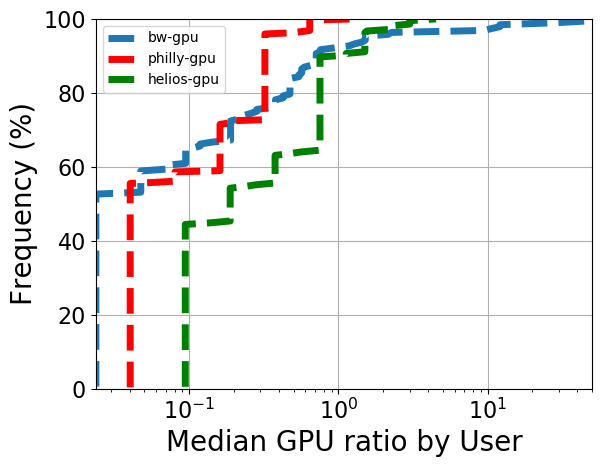

In [394]:
def plot_cdf_attribute_cpu_ratio(attr="cpu_num", label="Median CPU ratio by User"):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0].groupby("user").median()[attr]/396000*100, 100000,"Time (s)")
    plot_cdf(mira_df_2.groupby("user").median()[attr]/786432*100, 100000,"Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0].groupby("user").median()[attr]/532*100, 100000,label)
    plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
    plt.xscale("log")
def plot_cdf_attribute_gpu_ratio(attr="gpu_num", label="Median GPU ratio by User"):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]!=0].groupby("user").median()[attr]/4228*100, 100000,"Time (s)")
    plot_cdf(philly_df.groupby("user").median()[attr]/2490*100, 100000,"Job Run Time (s)", color="red")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0].groupby("user").median()[attr]/1064*100, 100000,label,color="green")
    plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
    plt.xscale("log")
plot_cdf_attribute_cpu_ratio()
plot_cdf_attribute_gpu_ratio()

In [ ]:
def plot_cdf_attribute_cpu_ratio_user(attr="cpu_num", label="CPU ratio"):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]==0][attr]/396000*100, 100000,"Time (s)")
    plot_cdf(mira_df_2[attr]/786432*100, 100000,"Time (s)")
    plot_cdf(hl_df[hl_df["gpu_num"]==0][attr]/532*100, 100000,label)
    plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
    plt.xscale("log")
def plot_cdf_attribute_gpu_ratio_user(attr="gpu_num", label="GPU ratio"):
    plt.figure()
    plot_cdf(bw_df[bw_df["gpu_num"]!=0][attr]/4228*100, 100000,"Time (s)")
    plot_cdf(philly_df[attr]/2490*100, 100000,"Job Run Time (s)", color="red")
    plot_cdf(hl_df[hl_df["gpu_num"]!=0][attr]/1064*100, 100000,label,color="green")
    plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
    plt.xscale("log")
plot_cdf_attribute_cpu_ratio_user()
plot_cdf_attribute_gpu_ratio_user()

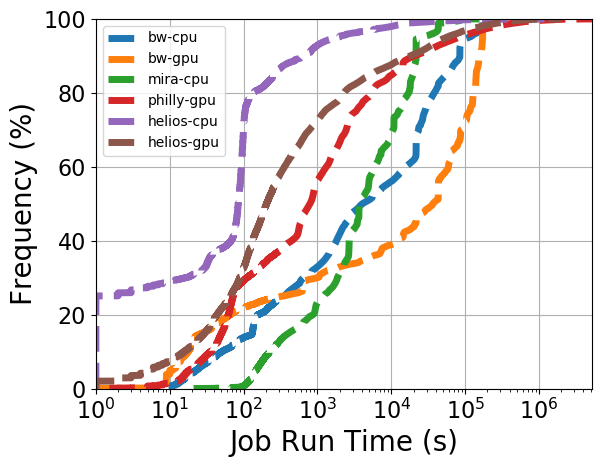

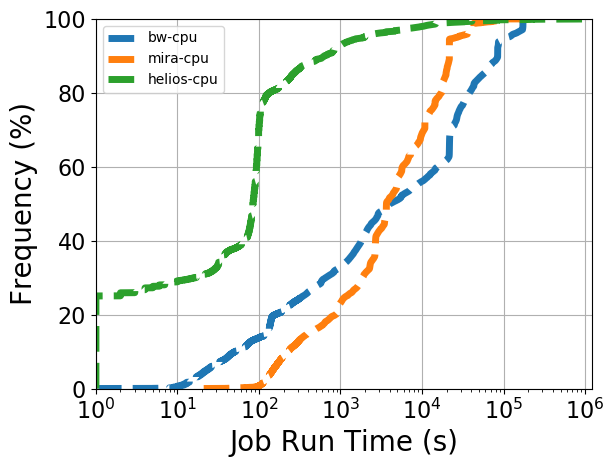

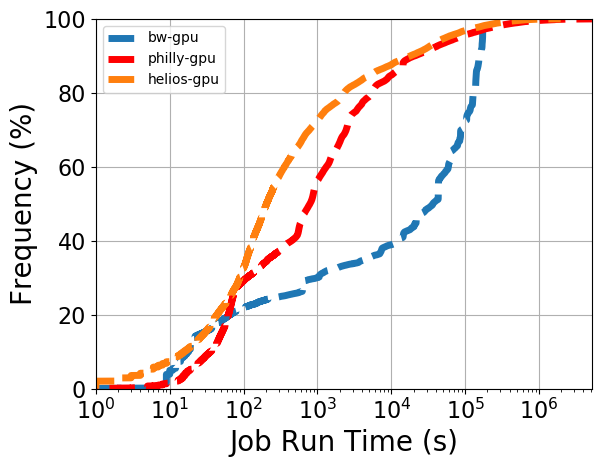

In [353]:
plot_cdf_attribute()
plot_cdf_attribute_cpu()
plot_cdf_attribute_gpu()

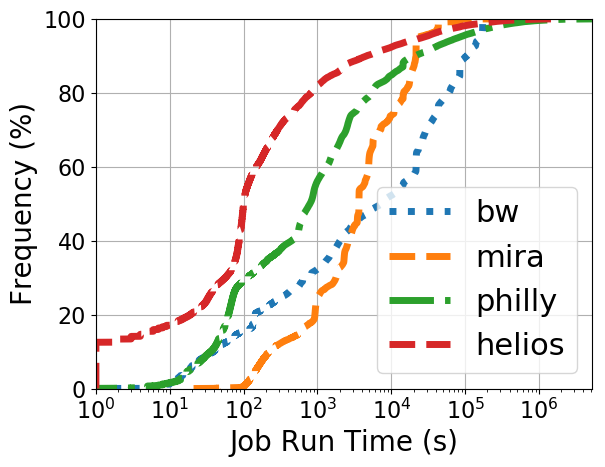

In [1251]:
plt.style.use("default")
plot_cdf(bw_df["run_time"], 1000,"Time (s)", linestyle=":")
plot_cdf(mira_df_2["run_time"], 1000,"Time (s)", linestyle="--")
plot_cdf(philly_df["run_time"], 1000,"Time (s)", linestyle="-.")
plot_cdf(hl_df["run_time"], 10009999,"Job Run Time (s)", linestyle="--")
plt.rc('legend',fontsize=22)
plt.legend(["bw", "mira", "philly","helios"])

# plt.rc("legend", "default")
plt.xscale("log")

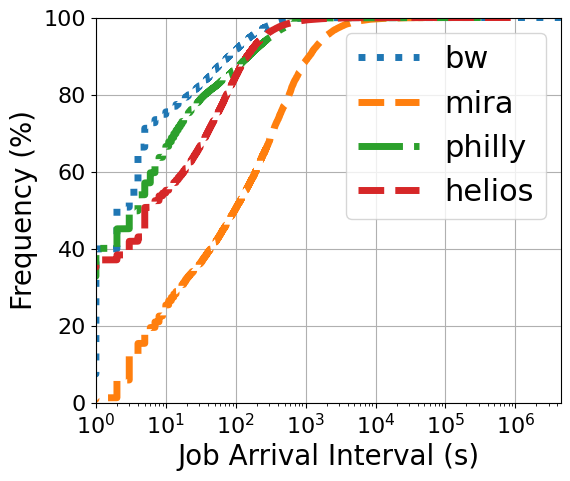

In [474]:
def get_interval(a, peak=False):
    def get_time_of_day2(time):
        time = datetime.fromtimestamp(time)
        return (time.hour + (time.minute>30))%24
    if peak:
        z = a.apply(get_time_of_day2)
#         print((z>=8) & (z<=17))
        b = a-a.shift(1)
        c = b[(z>=8) & (z<=17)]
        return c
    return a-a.shift(1)
plt.style.use("default")
plt.figure(figsize=[6.,5])
plot_cdf(get_interval(bw_df["submit_time"]), 1000,"Time (s)", linestyle=":")
plot_cdf(get_interval(mira_df_2["submit_time"]), 1000,"Time (s)", linestyle="--")
plot_cdf(get_interval(philly_df["submit_time"]), 1000,"Time (s)", linestyle="-.")
plot_cdf(get_interval(hl_df["submit_time"]), 10009999,"Job Arrival Interval (s)", linestyle="--")
plt.rc('legend',fontsize=22)
plt.legend(["bw", "mira", "philly","helios"])
# plt.legend(["bw", "mira", "philly","helios", ], prop={'size': 14},bbox_to_anchor=(0, 1, 1., .102),loc='lower left',
#           ncol=4, fancybox=True, shadow=True)
# plt.rc("legend", "default")
plt.xscale("log")

In [1306]:
philly_df["submit_time"]-philly_df["submit_time"].shift(-1)

0        -395146.0
1        -257893.0
2              0.0
3              0.0
4        -195071.0
5          -7949.0
6              0.0
7              0.0
8         -63543.0
9              0.0
10            -1.0
11             0.0
12            -2.0
13             0.0
14        -22619.0
15             0.0
16          -885.0
17         -1806.0
18             0.0
19             0.0
20        -46122.0
21             0.0
22             0.0
23       -201694.0
24             0.0
25       -190752.0
26             0.0
27        -56364.0
28        -78404.0
29       -197456.0
            ...   
151786      -323.0
151787      -582.0
151788       -18.0
151789      -142.0
151790      -415.0
151791         0.0
151792         0.0
151793         0.0
151794         0.0
151795       -42.0
151796       -12.0
151797         0.0
151798         0.0
151799         0.0
151800         0.0
151801      -588.0
151802      -215.0
151803      -126.0
151804      -135.0
151805        -2.0
151806       -14.0
151807      

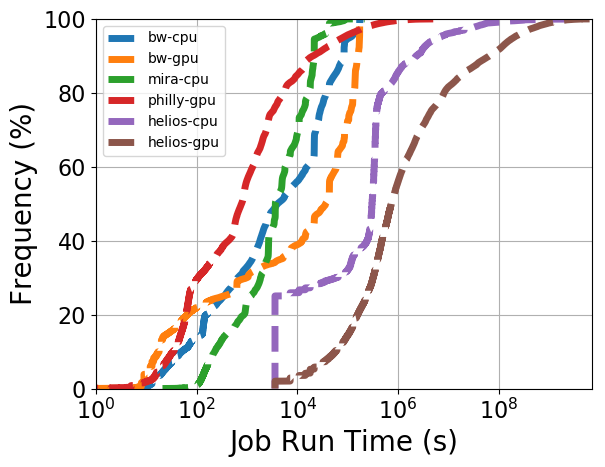

In [326]:
plt.style.use("default")
plot_cdf(cpu_job_run_time, 100000,"Time (s)")
plot_cdf(gpu_job_run_time, 100000,"Time (s)")
plot_cdf(mira_df["Runtime"], 100000,"Time (s)")
plot_cdf(philly_logs_duration, 100000,"Job Run Time (s)")
plot_cdf(df_cpu["duration"], 100000,"Job Run Time (s)")
plot_cdf(df_gpu["duration"], 100000,"Job Run Time (s)")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

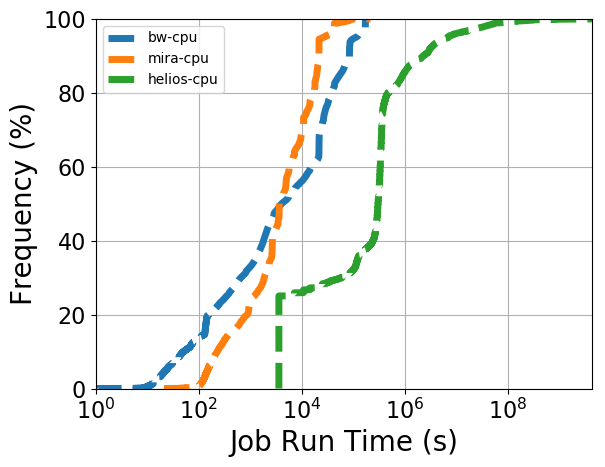

In [327]:
plot_cdf(cpu_job_run_time, 100000,"Time (s)")
# plot_cdf(gpu_job_run_time, 100000,"Time (s)")
plot_cdf(mira_df["Runtime"], 100000,"Time (s)")
# plot_cdf(philly_logs_duration, 100000,"Job Run Time (s)")
plot_cdf(df_cpu["duration"]*3600, 100000,"Job Run Time (s)")
# plot_cdf(df_gpu["duration"], 100000,"Job Run Time (s)")
plt.legend(["bw-cpu","mira-cpu", "helios-cpu"])
plt.xscale("log")

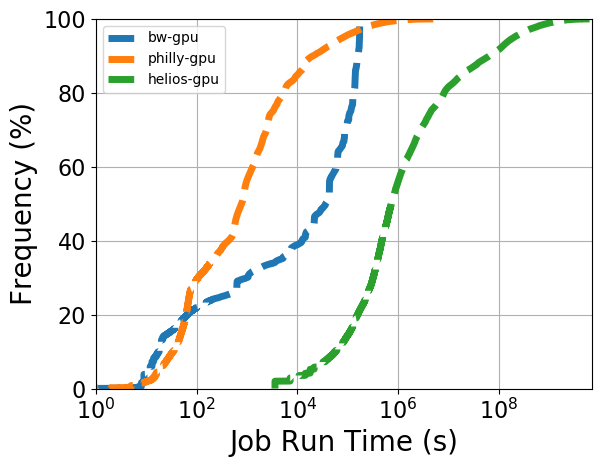

In [328]:
#plot_cdf(cpu_job_run_time, 100000,"Time (s)")
plot_cdf(gpu_job_run_time, 100000,"Time (s)")
#plot_cdf(mira_df["Runtime"], 100000,"Time (s)")
plot_cdf(philly_logs_duration, 100000,"Job Run Time (s)")
#plot_cdf(df_cpu["duration"], 100000,"Job Run Time (s)")
plot_cdf(df_gpu["duration"]*3600, 100000,"Job Run Time (s)")
plt.legend(["bw-gpu","philly-gpu", "helios-gpu"])
plt.xscale("log")

[4.00000000e+00 2.47678540e+03 4.94957080e+03 7.42235620e+03
 9.89514160e+03 1.23679270e+04 1.48407124e+04 1.73134978e+04
 1.97862832e+04 2.22590686e+04]
[125736  19463  12282   9408   7027   6214   4951   4412   4209   3593]
[42.50882389 49.08887446 53.24117273 56.42182915 58.79751714 60.89834611
 62.57218007 64.06378893 65.48676755 66.7014889 ]


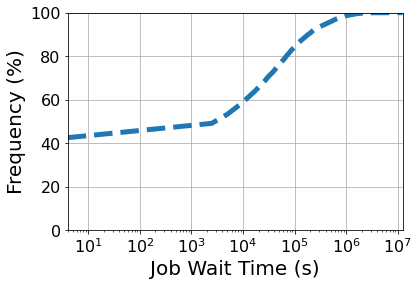

In [387]:
plot_cdf([i.wait_time for i in jobs], 5000, "Job Wait Time (s)")
plt.xscale("log")

[   0.     1015.3214 2030.6428 3045.9642 4061.2856 5076.607  6091.9284
 7107.2498 8122.5712 9137.8926]
[23229  2556  1704  1141   979   831   685   600   612   574]
[40.25753453 44.68726712 47.64042218 49.61785758 51.31453528 52.75471829
 53.94187276 54.98171609 56.04235628 57.03713974]


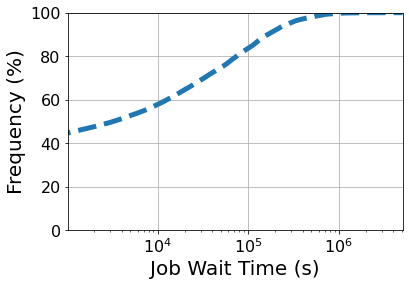

In [389]:
plot_cdf(mira_df["EligibleQueueTime"], 5000, "Job Wait Time (s)")
plt.xscale("log")

[1.0000000e+00 1.0650236e+03 2.1290472e+03 3.1930708e+03 4.2570944e+03
 5.3211180e+03 6.3851416e+03 7.4491652e+03 8.5131888e+03 9.5772124e+03]
[95931 11525  6780  4668  3576  2888  2851  2422  1999  2172]
[60.25248877 67.49112835 71.74952109 74.68140565 76.92742518 78.74132462
 80.53198505 82.05319851 83.30873347 84.67292655]


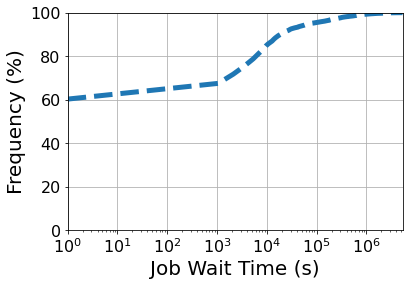

In [391]:
plot_cdf(philly_logs_wait, 5000, "Job Wait Time (s)")
plt.xscale("log")

[   0.      113.0006  226.0012  339.0018  452.0024  565.003   678.0036
  791.0042  904.0048 1017.0054]
[202363   5216   3785   2392   2175   1721   1838   1781   1772   1827]
[82.02530927 84.13954959 85.67375197 86.64331923 87.52492826 88.22251407
 88.96752436 89.68943042 90.40768844 91.14824002]


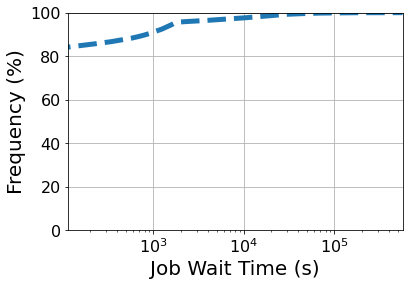

In [388]:
plot_cdf(df["wait_time"], 5000, "Job Wait Time (s)")
plt.xscale("log")

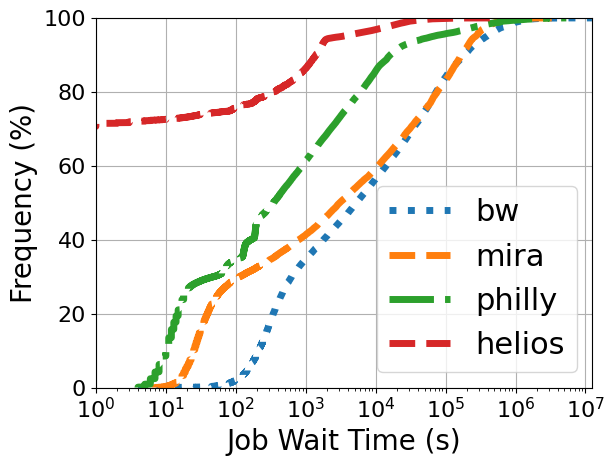

In [491]:
plot_cdf(bw_df["wait_time"], 100000, "Job Wait Time (s)", linestyle=":")
plot_cdf(mira_df_2["wait_time"], 100000, "Job Wait Time (s)", linestyle="--")
plot_cdf(philly_df["wait_time"], 100000, "Job Wait Time (s)", linestyle="-.")
plot_cdf(hl_df["wait_time"], 100000, "Job Wait Time (s)", linestyle="--")
plt.legend(["bw","mira", "philly","helios"])
plt.xscale("log")
plt.rc('legend',fontsize=23)
# plot_cdf(get_interval(bw_df["submit_time"]), 1000,"Time (s)", linestyle=":")
# plot_cdf(get_interval(mira_df_2["submit_time"]), 1000,"Time (s)", linestyle="--")
# plot_cdf(get_interval(philly_df["submit_time"]), 1000,"Time (s)", linestyle="-.")
# plot_cdf(get_interval(hl_df["submit_time"]), 10009999,"Job Arrival Interval (s)", linestyle="--")

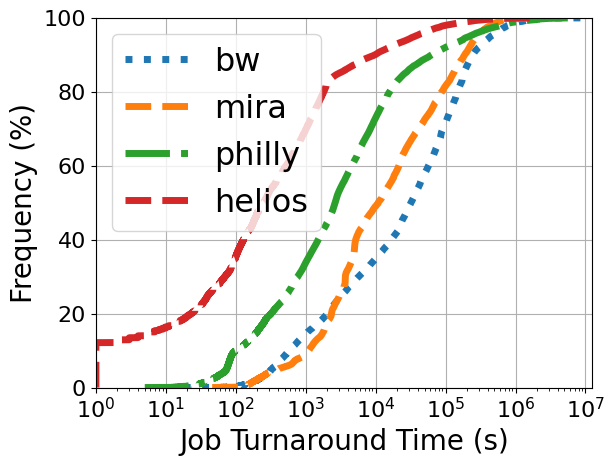

In [493]:
plot_cdf(bw_df["wait_time"]+bw_df["run_time"], 100000, "Job Wait Time (s)", linestyle=":")
plot_cdf(mira_df_2["wait_time"]+mira_df_2["run_time"], 100000, "Job Wait Time (s)", linestyle="--")
plot_cdf(philly_df["wait_time"]+philly_df["run_time"], 100000, "Job Wait Time (s)", linestyle="-.")
plot_cdf(hl_df["wait_time"]+hl_df["run_time"], 100000, "Job Turnaround Time (s)", linestyle="--")
plt.legend(["bw","mira", "philly","helios"])
plt.xscale("log")
plt.rc('legend',fontsize=23)

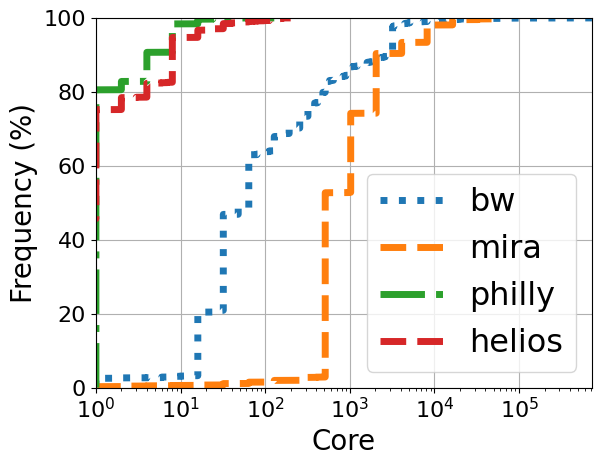

In [500]:
plot_cdf([row["cpu_num"] if row["cpu_num"] != 0 else row["gpu_num"]*16 for _, row in bw_df.iterrows()], 100000, "Job Wait Time (s)", linestyle=":")
plot_cdf(mira_df_2["node_num"], 100000, "Job Wait Time (s)", linestyle="--")
plot_cdf(philly_df["gpu_num"], 100000, "Job Wait Time (s)", linestyle="-.")
plot_cdf(hl_df["gpu_num"], 100000, "Core", linestyle="--")
plt.legend(["bw","mira", "philly","helios"])
plt.xscale("log")
plt.rc('legend',fontsize=23)

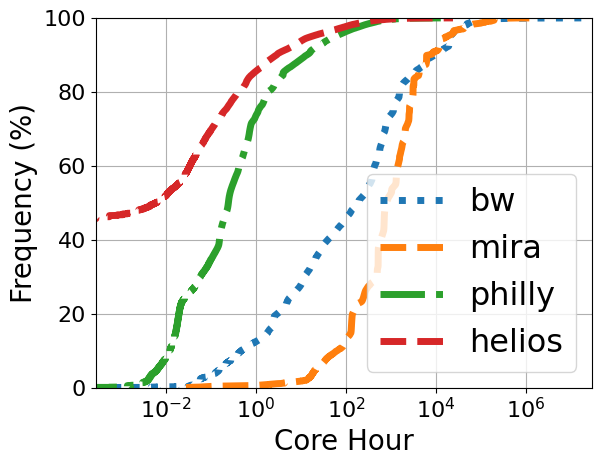

In [502]:
plot_cdf(bw_df.apply(lambda row:row["cpu_num"] if row["cpu_num"]!=0 else row["gpu_num"]*16, axis=1)*bw_df["run_time"]/3600, 100000, "Job Wait Time (s)", linestyle=":")
plot_cdf(mira_df_2["node_num"]*mira_df_2["run_time"]/3600, 100000, "Job Wait Time (s)", linestyle="--")
plot_cdf(philly_df["gpu_num"]*philly_df["run_time"]/3600, 100000, "Job Wait Time (s)", linestyle="-.")
plot_cdf(hl_df["gpu_num"]*hl_df["run_time"]/3600, 100000, "Core Hour", linestyle="--")
plt.legend(["bw","mira", "philly","helios"])
plt.xscale("log")
plt.rc('legend',fontsize=23)

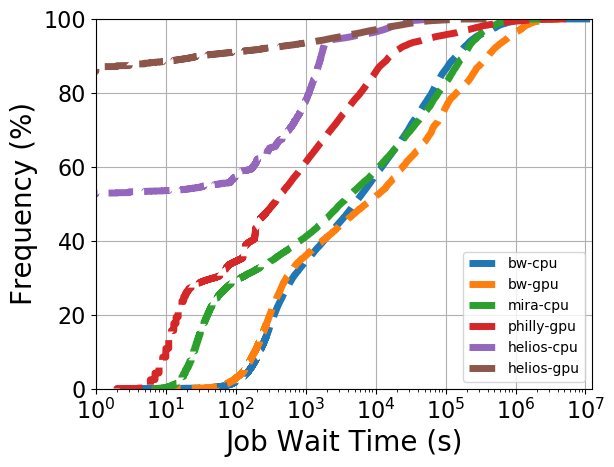

In [198]:
plot_cdf([i.wait_time for i in cpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf([i.wait_time for i in gpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(mira_df["EligibleQueueTime"], 100000, "Job Wait Time (s)")
plot_cdf(philly_logs_wait, 100000, "Job Wait Time (s)")
plot_cdf(df_cpu["wait_time"], 100000, "Job Wait Time (s)")
plot_cdf(df_gpu["wait_time"], 100000, "Job Wait Time (s)")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

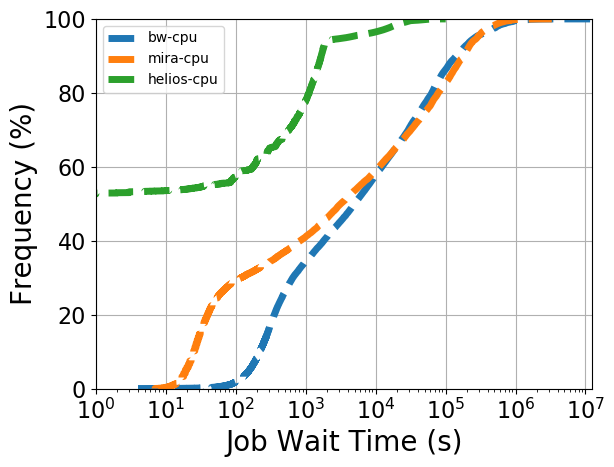

In [199]:
plot_cdf([i.wait_time for i in cpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(mira_df["EligibleQueueTime"], 100000, "Job Wait Time (s)")
plot_cdf(df_cpu["wait_time"], 100000, "Job Wait Time (s)")
plt.legend(["bw-cpu", "mira-cpu", "helios-cpu"])
plt.xscale("log")

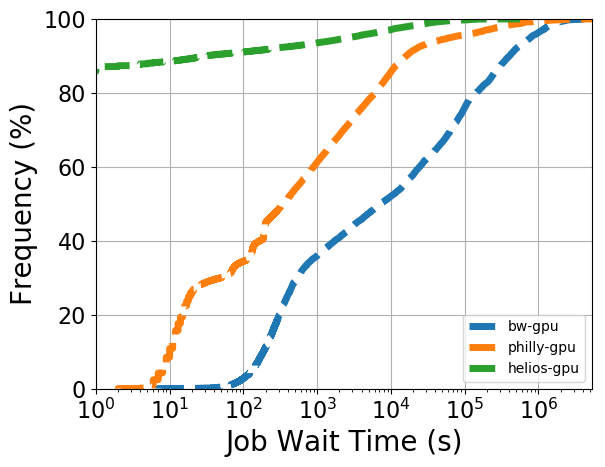

In [200]:
plot_cdf([i.wait_time for i in gpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(philly_logs_wait, 100000, "Job Wait Time (s)")
plot_cdf(df_gpu["wait_time"], 100000, "Job Wait Time (s)")
plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
plt.xscale("log")

/home/dzhang16/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


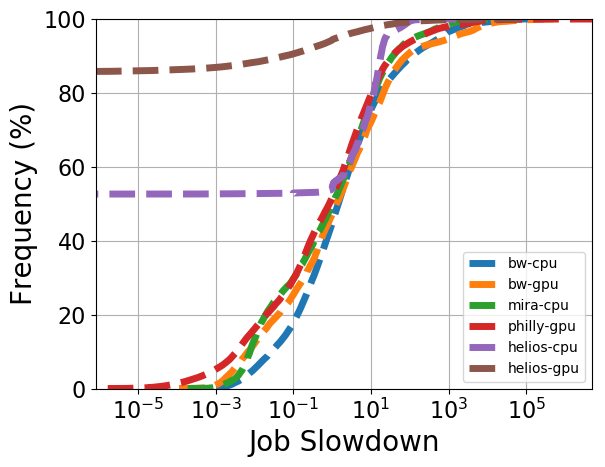

In [208]:
plot_cdf([i.wait_time/i.run_time for i in cpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf([i.wait_time/i.run_time for i in gpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(mira_df["EligibleQueueTime"]/mira_df["Runtime"], 100000, "Job Wait Time (s)")
plot_cdf(np.array(philly_logs_wait[:152516])/np.array(philly_logs_duration), 100000, "Job Wait Time (s)")
plot_cdf(df_cpu["wait_time"]/df_cpu["duration"], 100000, "Job Wait Time (s)")
plot_cdf(df_gpu["wait_time"]/df_gpu["duration"], 100000, "Job Slowdown")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

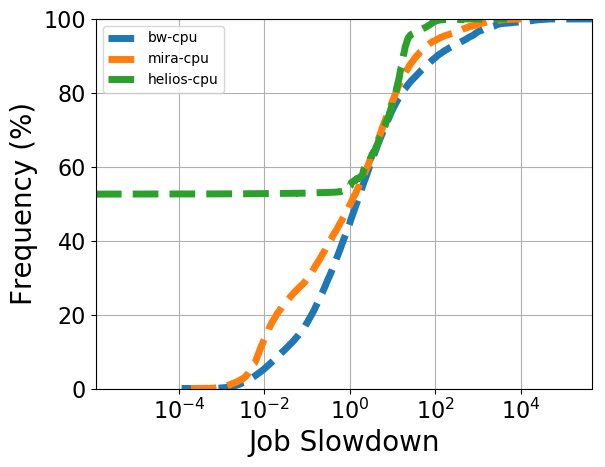

In [210]:
plot_cdf([i.wait_time/i.run_time for i in cpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(mira_df["EligibleQueueTime"]/mira_df["Runtime"], 100000, "Job Wait Time (s)")
plot_cdf(df_cpu["wait_time"]/df_cpu["duration"], 100000, "Job Slowdown")
plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
plt.xscale("log")

/home/dzhang16/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


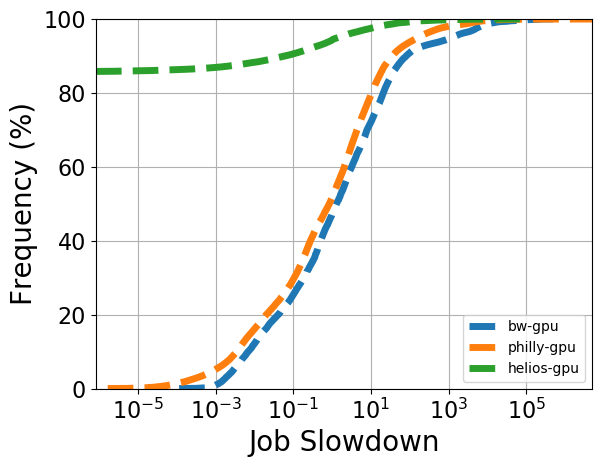

In [211]:
plot_cdf([i.wait_time/i.run_time for i in gpu_jobs], 100000, "Job Wait Time (s)")
plot_cdf(np.array(philly_logs_wait[:152516])/np.array(philly_logs_duration), 100000, "Job Wait Time (s)")
plot_cdf(df_gpu["wait_time"]/df_gpu["duration"], 100000, "Job Slowdown")
plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
plt.xscale("log")

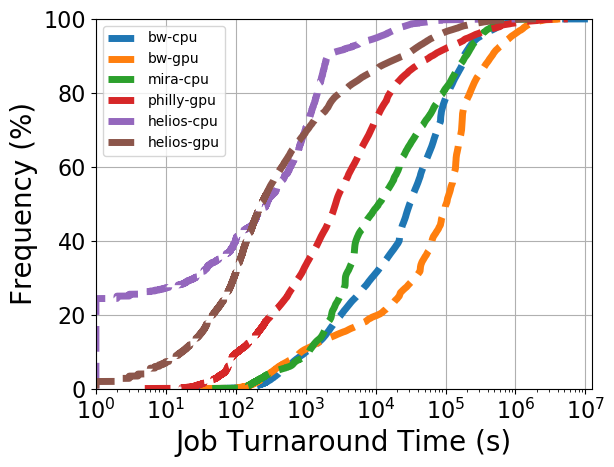

In [201]:
plot_cdf(np.array([i.wait_time for i in cpu_jobs])+np.array(cpu_job_run_time), 100000, "Job Wait Time (s)")
plot_cdf(np.array([i.wait_time for i in gpu_jobs])+np.array(gpu_job_run_time), 100000, "Job Wait Time (s)")
plot_cdf(mira_df["EligibleQueueTime"]+mira_df["Runtime"], 100000, "Job Wait Time (s)")
plot_cdf(np.array(philly_logs_wait[:152516])+np.array(philly_logs_duration), 100000, "Job Wait Time (s)")
plot_cdf(df_cpu["wait_time"]+df_cpu["duration"], 100000, "Job Turnaround Time (s)")
plot_cdf(df_gpu["wait_time"]+df_gpu["duration"], 100000, "Job Turnaround Time (s)")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

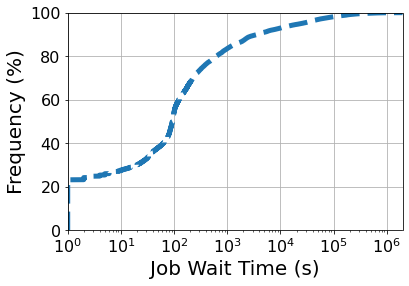

In [69]:
plot_cdf(df["duration"], 200000, "Job Wait Time (s)")
plt.xscale("log")

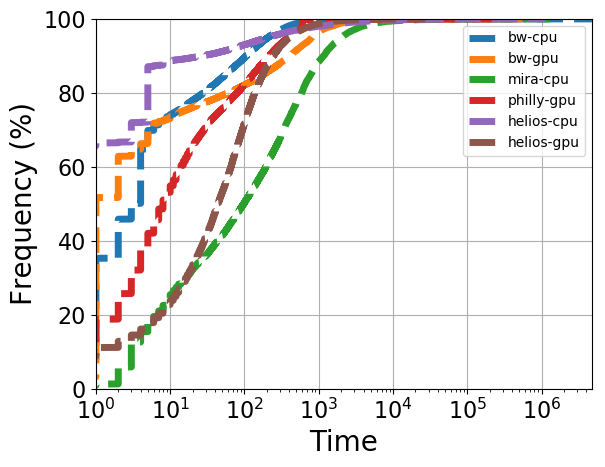

In [219]:
plot_cdf(cpu_job_interval, 100000, xlabel="Time")
plot_cdf(gpu_job_interval, 100000, xlabel="Time")
plot_cdf(mira_submit_diff[1:], 100000, xlabel="Time")
plot_cdf(philly_logs_interval, 100000, xlabel="Time")
plot_cdf(df_cpu_submit_diff[1:], 100000, xlabel="Time")
plot_cdf(df_gpu_submit_diff[1:], 100000, xlabel="Time")

plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

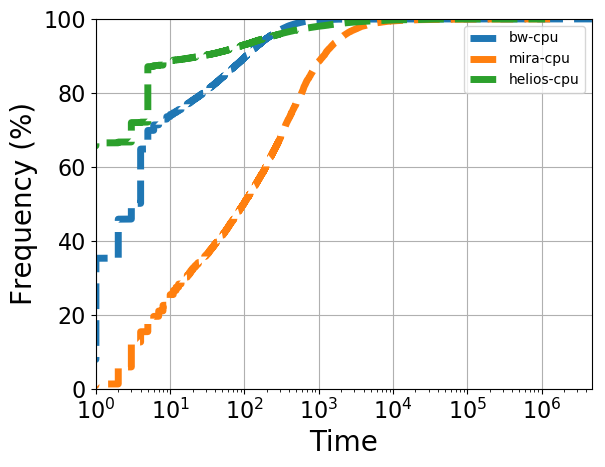

In [220]:
plot_cdf(cpu_job_interval, 100000, xlabel="Time")
plot_cdf(mira_submit_diff[1:], 100000, xlabel="Time")
plot_cdf(df_cpu_submit_diff[1:], 100000, xlabel="Time")

plt.legend(["bw-cpu", "mira-cpu","helios-cpu"])
plt.xscale("log")

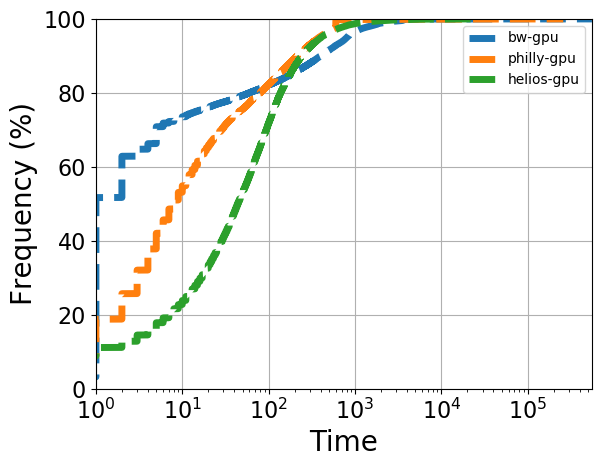

In [221]:
plot_cdf(gpu_job_interval, 100000, xlabel="Time")
plot_cdf(philly_logs_interval, 100000, xlabel="Time")
plot_cdf(df_gpu_submit_diff[1:], 100000, xlabel="Time")

plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
plt.xscale("log")

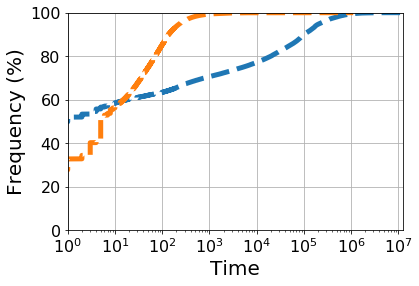

In [28]:
plot_cdf(job_interval, 100000, xlabel="Time")
plot_cdf(df_submit_diff[1:], 100000, xlabel="Time")
plt.xscale("log")

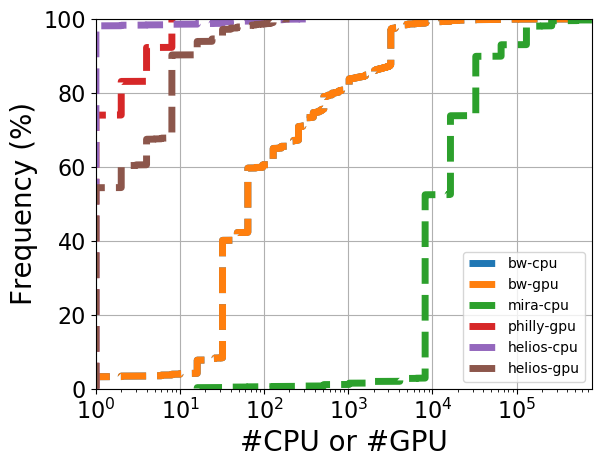

In [223]:
#plt.figure(figsize=(15, 5))
plot_cdf(cpu_job_request_node, 100000, xlabel="Time")
plot_cdf(gpu_job_request_node, 100000, xlabel="Time")
plot_cdf(mira_df["#CoresRequested"], 10000, xlabel="Time")
plot_cdf(philly_logs_node, 100000, xlabel="Time")
plot_cdf(df_cpu["cpu_num"], 100000, xlabel="Core")
plot_cdf(df_gpu["gpu_num"], 100000, xlabel="#CPU or #GPU")
#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

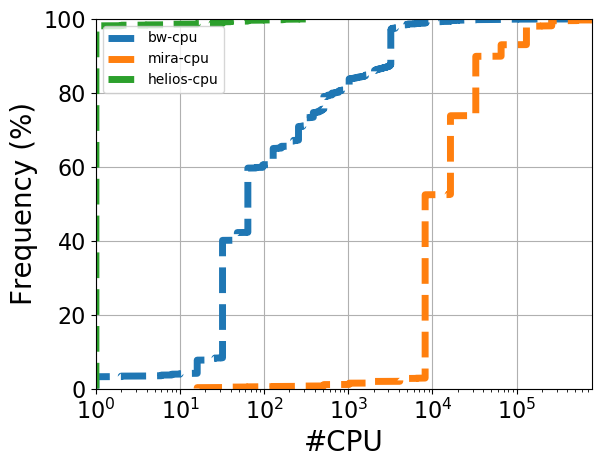

In [225]:
plot_cdf(cpu_job_request_node, 100000, xlabel="Time")
plot_cdf(mira_df["#CoresRequested"], 10000, xlabel="Time")
plot_cdf(df_cpu["cpu_num"], 100000, xlabel="#CPU")
#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-cpu", "mira-cpu", "helios-cpu"])
plt.xscale("log")

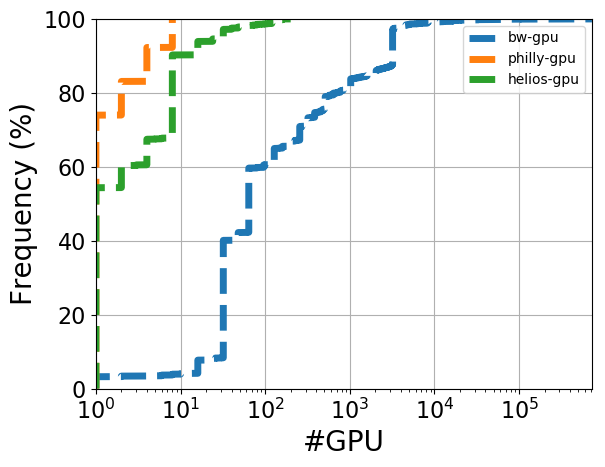

In [226]:
plot_cdf(gpu_job_request_node, 100000, xlabel="Time")
plot_cdf(philly_logs_node, 100000, xlabel="Time")
plot_cdf(df_gpu["gpu_num"], 100000, xlabel="#GPU")
#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-gpu", "philly-gpu","helios-gpu"])
plt.xscale("log")

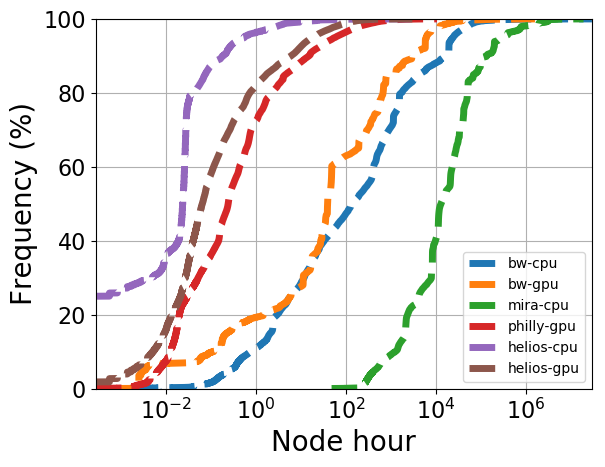

In [231]:
plot_cdf(np.array(cpu_job_core_hour)/3600, 1000000, xlabel="Time")
plot_cdf(np.array(gpu_job_core_hour)/3600, 1000000, xlabel="Time")
plot_cdf(mira_df["#CoreSecondsUsed"]/3600, 10000, xlabel="Time")
plot_cdf(philly_logs_corehour/3600, 100000, xlabel="Time")
plot_cdf(df_cpu["core_hour"]/3600, 100000, xlabel="Core hour")
plot_cdf(df_gpu["core_hour"]/3600, 100000, xlabel="Node hour")

#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-cpu","bw-gpu", "mira-cpu", "philly-gpu","helios-cpu","helios-gpu"])
plt.xscale("log")

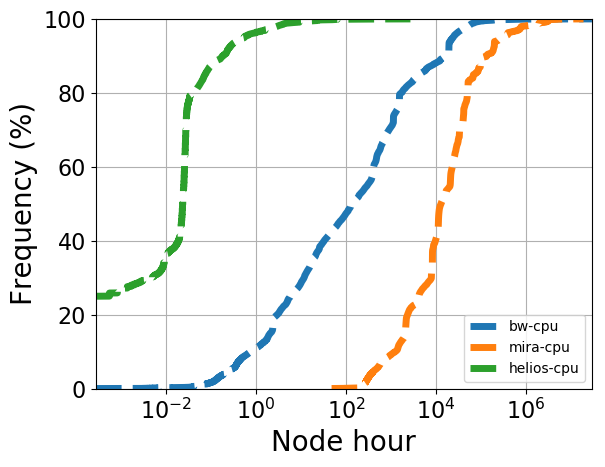

In [233]:
plot_cdf(np.array(cpu_job_core_hour)/3600, 1000000, xlabel="Time")
plot_cdf(mira_df["#CoreSecondsUsed"]/3600, 10000, xlabel="Time")
plot_cdf(df_cpu["core_hour"]/3600, 100000, xlabel="Node hour")

#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-cpu", "mira-cpu", "helios-cpu"])
plt.xscale("log")

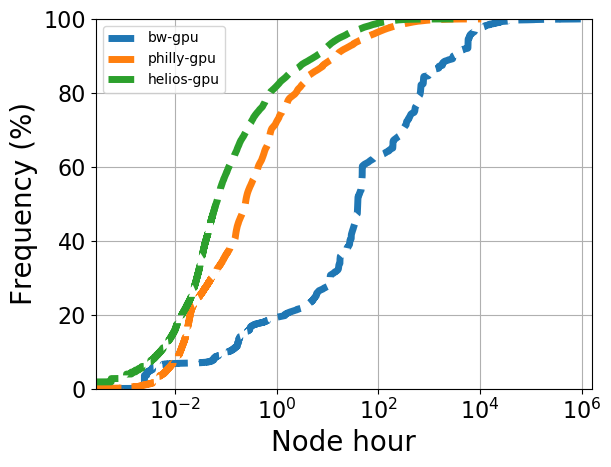

In [234]:
plot_cdf(np.array(gpu_job_core_hour)/3600, 1000000, xlabel="Time")
plot_cdf(philly_logs_corehour/3600, 100000, xlabel="Time")
plot_cdf(df_gpu["core_hour"]/3600, 100000, xlabel="Node hour")
#plot_cdf(df["gpu_num"], 100000, xlabel="Core")
plt.legend(["bw-gpu",  "philly-gpu","helios-gpu"])
plt.xscale("log")

In [184]:
# start, end, core
def utilization(job, total_cores):
    unit = 24*3600
    start = float('inf')
    for i in job:
        start = min(start, i[0])
    end = 0
    for i in job:
        end = max(end, i[1])
    res = [0]*((end-start+unit-1)//unit)
    for i in job:
        if (i[1] - start)//unit == (i[0]-start)//unit:
            res[(i[0]-start)//unit] += (i[1]-i[0])*i[2]
        else:
            res[(i[0]-start)//unit] += (((i[1] - start)//unit*unit+start)-i[0])*i[2]
            res[(i[1]-start)//unit] += (i[1]-((i[1] - start)//unit*unit+start))*i[2]
    res = np.array(res)
    res = res/(total_cores*unit)
    res2 = [0]*7
    c = [0]*7
    i = 0
    while i < len(res):
        for j in range(7):
            if i < len(res):
                res2[j] += res[i]
                c[j] += 1
            i += 1
    out = [i/j for i,j in zip(res2, c)]
    out = out + out
    day = datetime.fromtimestamp(start).weekday()
    return out[day:day+7]


In [179]:
datetime.now().weekday()

4

In [183]:
datetime.fromtimestamp(1546151279)

datetime.datetime(2018, 12, 30, 1, 27, 59)

In [169]:
job_s_e_c = [(int(i.d["start"]), int(i.d["end"]), int(i.d["total_execution_slots"])) for i in jobs if "total_execution_slots" in i.d]

(0, 1)

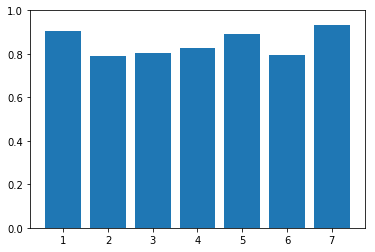

In [190]:
res = utilization(job_s_e_c, 22636*32+ 4228*16)
plt.bar(range(1, 8),res)
plt.ylim(0,1)
# plt.bar(range(1, 8), res[2:9])

(1514758996, 1514793090, 131072)


<BarContainer object of 7 artists>

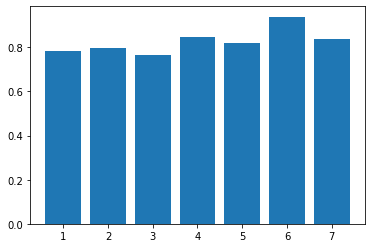

In [560]:
res = utilization([*zip(mira_df["StartTimestamp"].astype(int), mira_df["EndTimestamp"].astype(int), mira_df["#CoresRequested"].tolist())], 49152*16)
plt.bar(range(1, 8), res[2:9])

(0, 1)

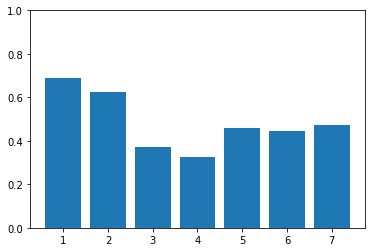

In [192]:
res = utilization(philly_logs_s_e_c, 2490)
# plt.bar(range(1, 8), res[10:17])
plt.bar(range(1, 8),res)
plt.ylim(0,1)

(0, 1)

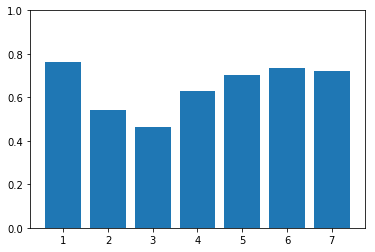

In [193]:
res = utilization([*zip(df["start_time"].astype(int), df["end_time"].astype(int), df["gpu_num"].tolist())], 1064)
# plt.bar(range(1, 8), res[10:17])
plt.bar(range(1, 8),res)
plt.ylim(0,1)

In [ ]:
philly_logs_s_e_c

In [404]:
def plot_duration_wait(duration, wait, xlabel, ylabel="Job Wait Time (hours)"):
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    dd = defaultdict(list)
    for i, j in zip(duration, wait):
        dd[int(i//3600)].append(int(j//3600))
    keys = sorted(dd.keys())
    plt.bar(keys, [np.median(dd[j]) for j in keys], width=10000)
    plt.xlabel(xlabel, fontsize=20)
    plt.ylabel(ylabel, fontsize=20)
    plt.margins(0)
    plt.ylim(bottom=0)
    plt.grid("both")
    plt.rc('legend',fontsize=20)

In [241]:
job_wait_time = [i.wait_time for i in jobs]

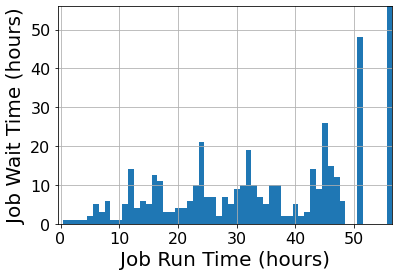

In [230]:
plot_duration_wait(job_run_time, job_wait_time, xlabel="Job Run Time (hours)")

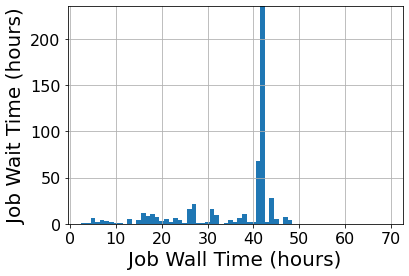

In [242]:
plot_duration_wait(job_wall_time, job_wait_time, xlabel="Job Wall Time (hours)")

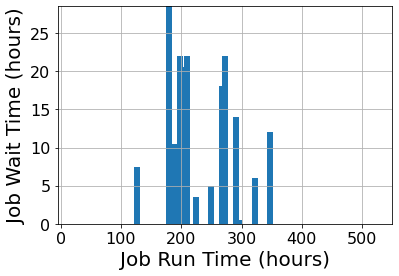

In [235]:
plot_duration_wait(df["duration"], df["wait_time"], xlabel="Job Run Time (hours)")

152652
152520


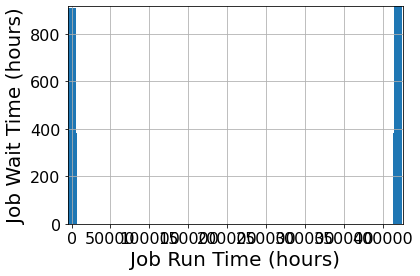

In [409]:
print(len(philly_logs_duration))
print(len(philly_logs_wait))
plot_duration_wait(philly_logs_duration[:len(philly_logs_wait)], philly_logs_wait, xlabel="Job Run Time (hours)")

In [250]:
def plot_time_wait(time, wait, xlabel, ylabel="Job Wait Time (hours)"):
    time, days = list(zip(*time))
    dd = defaultdict(list)
    for i, j in zip(time, wait):
        dd[i].append(j/3600)
    keys = sorted(dd.keys())
    n = len(set(days))
    plt.plot(keys, [np.median(dd[j]) for j in keys], marker="o", linewidth=3, markersize=12)
    

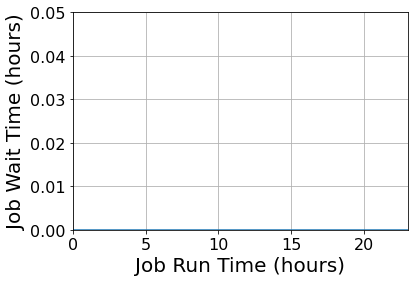

In [250]:
plot_time_wait([get_time_of_day(i) for i in df["submit_time"]],df["wait_time"], xlabel="Hour of the Day")

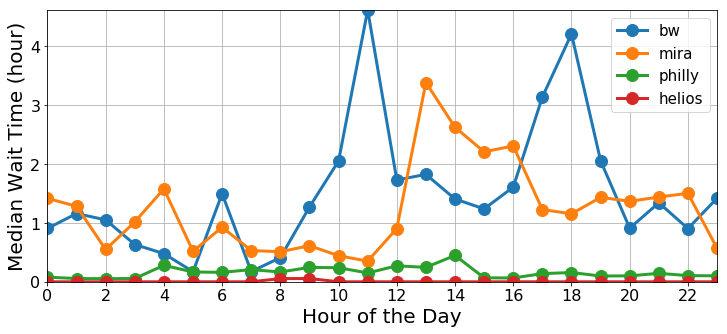

In [251]:
plt.figure(figsize=(12,5))
plt.xticks(fontsize=16)
plt.yticks(fontsize=16) 
plot_time_wait([get_time_of_day(int(i.d["ctime"]), timestamp=True) for i in jobs],job_wait_time, xlabel="Hour of the Day")
plot_time_wait([get_time_of_day(i, timestamp=True) for i in mira_df["QueuedTimestamp"]],mira_df["EligibleQueueTime"], xlabel="Hour of the Day")
plot_time_wait([get_time_of_day(i["submitted_time"], timestamp=False) for i in philly_logs],philly_logs_wait, xlabel="Hour of the Day")
plot_time_wait([get_time_of_day(i, timestamp=True) for i in df["submit_time"]],df["wait_time"], xlabel="Hour of the Day")
plt.xlabel("Hour of the Day", fontsize=20)
plt.ylabel("Median Wait Time (hour)", fontsize=20)
plt.margins(0)
plt.ylim(bottom=0)
plt.xlim(0, 23)
plt.grid(True)
plt.xticks(range(0, 24, 2))
plt.rc('legend',fontsize=20)
plt.legend(["bw", "mira", "philly","helios", ], prop={'size': 15})

In [1293]:
philly_df

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,node_hour,wall_time,core_hour
0,application_1501012364013_9680,a547a3,6214e9,Killed,1,0,1,1.502115e+09,3139935.0,1389243.0,1389243.0,0,1389243.0
1,application_1501012364013_13894,e90b30,b436b2,Failed,8,0,4,1.502510e+09,2933963.0,14405.0,57620.0,0,115240.0
2,application_1501012364013_16024,a4559a,6214e9,Killed,1,0,1,1.502768e+09,1570682.0,66336.0,66336.0,0,66336.0
3,application_1501012364013_16024,a4559a,6214e9,Killed,1,0,1,1.502768e+09,1637023.0,1042044.0,1042044.0,0,1042044.0
4,application_1501012364013_16024,a4559a,6214e9,Killed,1,0,1,1.502768e+09,2679080.0,2504635.0,2504635.0,0,2504635.0
5,application_1501012364013_19495,e90b30,b436b2,Failed,8,0,1,1.502963e+09,2395238.0,100547.0,100547.0,0,804376.0
6,application_1501012364013_19529,a547a3,6214e9,Failed,1,0,1,1.502971e+09,1999769.0,478477.0,478477.0,0,478477.0
7,application_1501012364013_19529,a547a3,6214e9,Failed,1,0,1,1.502971e+09,2478258.0,816099.0,816099.0,0,816099.0
8,application_1501012364013_19529,a547a3,6214e9,Failed,1,0,1,1.502971e+09,3294370.0,120018.0,120018.0,0,120018.0
9,application_1501012364013_19938,a547a3,6214e9,Killed,1,0,1,1.503034e+09,1304119.0,1064989.0,1064989.0,0,1064989.0


In [1292]:
get_time_of_day(philly_df["submit_time"][0])

(10, '2017-08-07')

In [480]:
def get_time_of_day(time, timestamp=True):
    if timestamp:
        time = datetime.fromtimestamp(time)
    else:
        time = datetime.strptime(time, '%Y-%m-%d %H:%M:%S')
    return (time.hour + (time.minute>30))%24, datetime.strftime(time, '%Y-%m-%d')

def get_day_of_week(time):
    time = datetime.fromtimestamp(time)
    return time.isocalendar()[2], time.isocalendar()[1]
    
def plot_time_submit(submit_time, xlabel, ylabel="Number of Submitted Jobs", week=False, marker="o"):
    if week == True:
        time, days = list(zip(*[get_time_of_day(i) for i in submit_time]))
        dd = Counter()
        for i in time:
            dd[i] += 1
        keys = sorted(dd.keys())
        n = len(set(days))
    else:
        days, weeks = list(zip(*[get_day_of_week(i) for i in submit_time]))
        dd = Counter()
        for i in days:
            dd[i] += 1
        keys = sorted(dd.keys())
        n = len(set(weeks))
    plt.plot(keys, [np.array(dd[j])/n for j in keys], marker=marker, linewidth=3, markersize=12)
    

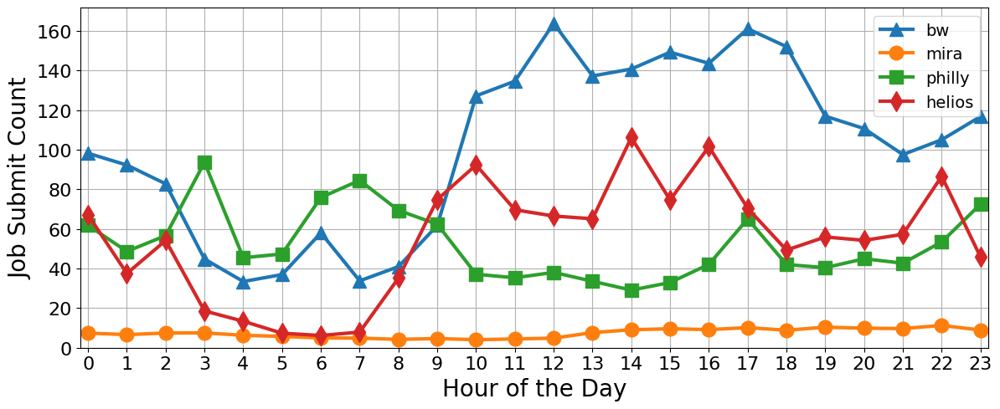

In [487]:
plt.figure(figsize=(12,5))
plt.xticks(fontsize=16)
plt.yticks(fontsize=16) 
plot_time_submit(bw_df["submit_time"], xlabel="Hour of the Day", week=True,marker="^")
plot_time_submit(mira_df_2["submit_time"], xlabel="Hour of the Day", week=True,marker="o")
plot_time_submit(philly_df["submit_time"], xlabel="Hour of the Day", week=True,marker="s")
plot_time_submit(hl_df["submit_time"], xlabel="Hour of the Day", week=True,marker="d")
plt.xlabel("Hour of the Day", fontsize=20)
plt.ylabel("Job Submit Count", fontsize=20)
# plt.margins(1)
plt.ylim(bottom=0)
plt.tight_layout()
plt.xlim(-0.2, 23.2)
plt.grid(True)
plt.legend(["bw", "mira", "philly","helios", ],  prop={'size': 14})
# plt.legend(["bw", "mira", "philly","helios", ], prop={'size': 12},bbox_to_anchor=(0, 1, 1., .102),loc='lower left',
#           ncol=4, fancybox=True, shadow=True)
plt.xticks(range(0, 24, 1))
plt.rc('legend',fontsize=20)

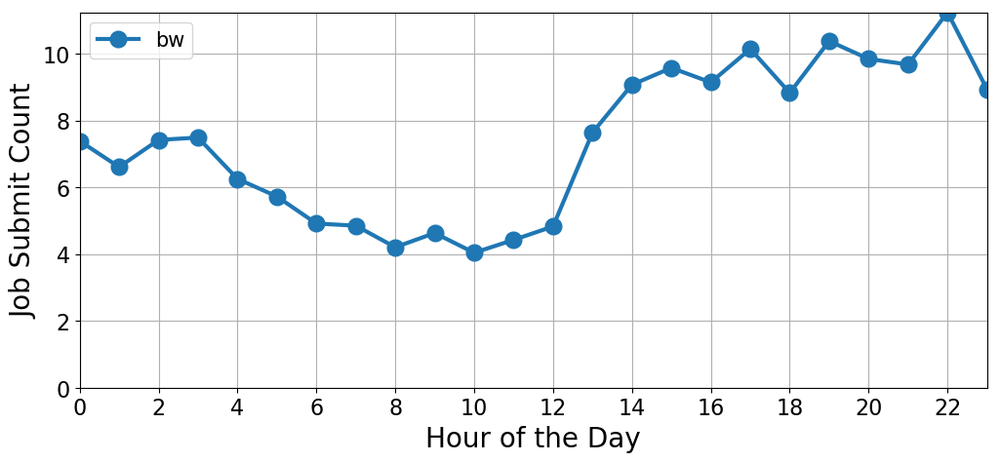

In [1298]:
plt.figure(figsize=(12,5))
plt.xticks(fontsize=16)
plt.yticks(fontsize=16) 
# plot_time_submit(bw_df["submit_time"], xlabel="Hour of the Day",marker="^")
plot_time_submit(mira_df_2["submit_time"], xlabel="Hour of the Day",marker="o")
# plot_time_submit(philly_df["submit_time"], xlabel="Hour of the Day",marker="s")
# plot_time_submit(hl_df["submit_time"], xlabel="Hour of the Day",marker="d")
plt.xlabel("Hour of the Day", fontsize=20)
plt.ylabel("Job Submit Count", fontsize=20)
plt.margins(0)
plt.ylim(bottom=0)
plt.xlim(0, 23)
plt.grid(True)
plt.legend(["bw", "mira", "philly","helios", ], prop={'size': 15})
plt.xticks(range(0, 24, 2))
plt.rc('legend',fontsize=20)

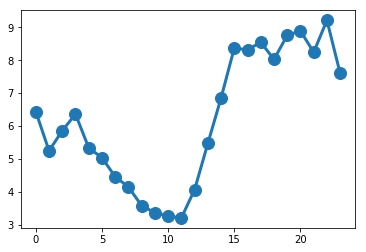

In [252]:
plot_time_submit([get_time_of_day(i, timestamp=True) for i in mira_df["QueuedTimestamp"]], xlabel="Hour of the Day")


Text(0.5,0,'Job Run Time (s)')

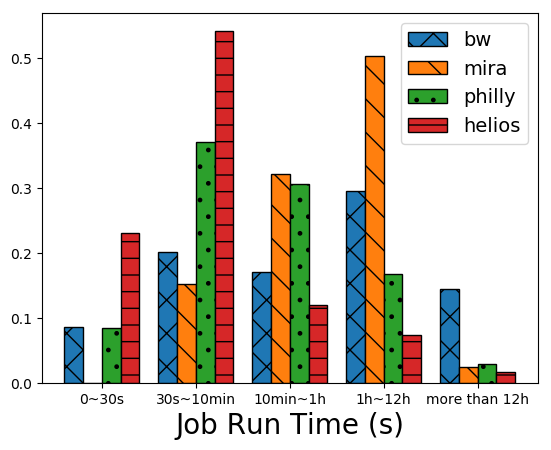

In [1254]:
def lt_xs(data, t1, t2):
    lt10min_jobs_num = len(data[data<t2][data>=t1])
    all_jobs_num = len(data)
    return lt10min_jobs_num/all_jobs_num
    #print("{:.2%}".format(lt10min_jobs_num/all_jobs_num))
def lt_xs_all(t1, t2):
    res = []
    res.append(lt_xs(bw_df["run_time"], t1, t2))
    res.append(lt_xs(mira_df_2["run_time"], t1, t2))
    res.append(lt_xs(philly_df["run_time"], t1, t2))
    res.append(lt_xs(hl_df["run_time"], t1, t2))
    return res
x = [0, 30, 600, 3600, 12*3600, 100000]
x_value = np.array([1, 2, 3, 4, 5])
labels = ['0~30s', '30s~10min', '10min~1h', '1h~12h', "more than 12h"]
bw = []
mr = []
ply = []
hl = []
width = 0.2
for i in range(1, len(x)):
    res = lt_xs_all(x[i-1], x[i])
    bw.append(res[0])
    mr.append(res[1])
    ply.append(res[2])
    hl.append(res[3])
plt.bar(x_value-3*width/2, bw, width, edgecolor='black', hatch="x")
plt.bar(x_value-width/2, mr, width,edgecolor='black', hatch="\\")
plt.bar(x_value+width/2, ply, width,edgecolor='black', hatch=".")
plt.bar(x_value+3*width/2, hl, width,edgecolor='black', hatch="-")

plt.xticks(x_value, labels)
plt.legend(["bw", "mira", "philly","helios", ], prop={'size': 14})
plt.xlabel("Job Run Time (s)", fontsize=20)
# plt.grid()

In [300]:
cancel_jobs_helios = df[df["state"] == "CANCELLED"]
print(np.mean(cancel_jobs_helios["duration"]))
print(np.median(cancel_jobs_helios["duration"]))
print(np.max(cancel_jobs_helios["duration"]))
print(len(cancel_jobs_helios))
print(len(df))
print("{:.2%}".format(len(cancel_jobs_helios)/len(df)))
print(len(df[df["duration"]<262]))

16097.769130178933
262.0
1433675
45883
246708
18.60%
177084
30103


0.1327775298524619
[ 300.  645.  990. 1335. 1680. 2025. 2370. 2715. 3060. 3405.]
[1264  134  435    0 2488    1    6   13   51 1067]
[ 3.21841422  3.55960686  4.66720986  4.66720986 11.00218974 11.00473596
 11.02001324 11.05311402 11.18297092 13.89978103]
0.8610021897438509


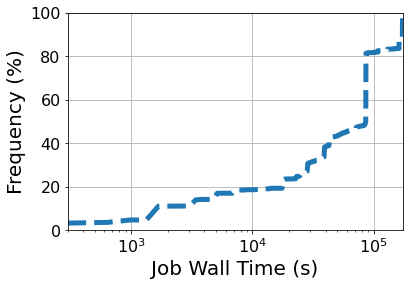

In [333]:
lt60pos = np.argwhere(job_run_time[job_run_time<60])
print(len(lt60pos)/len(job_run_time))
rs = np.take(job_wall_time, lt60pos)
plot_cdf(rs, 500, "Job Wall Time (s)")
plt.xscale("log")
print(len(rs[rs>3600])/len(rs))
#plt.hist(np.take(job_wall_time, lt60pos), bins=50)

In [828]:
new_bw_df[["run_time", "wall_time", "predict_time"]]

,run_time,wall_time,predict_time
0,233,43200,0.0
1,242,43200,116.5
2,57845,86400,0.0
3,58188,86400,28922.5
4,57947,86400,58016.5
5,57111,86400,58067.5
6,57798,86400,57529.0
7,57690,86400,57454.5
8,61559,86400,0.0
9,64501,86400,30779.5


In [5]:
print(len(jobs))
# linear_pred, xgboost_pred, mlp_pred, tobit_pred

980118


In [1180]:
import importlib
import sys
importlib.reload(sys.modules['HPCSched'])
importlib.reload(sys.modules['job_pandas'])
# importlib.reload(sys.modules['cluster'])
from HPCSched import *
from job_pandas import *
import time

#print(sum(env.schedule_curr_sequence_reset(env.sjf_score).values()))

In [353]:
import importlib
importlib.reload(sys.modules['HPCSched_update'])

from HPCSched_update import HPCEnv as HPCEnv_fast
importlib.reload(sys.modules['job_pandas'])
env = HPCEnv_fast(batch_job_slice=0,job_score_type=3, backfil=False)
env.seed(0)
env.my_init(philly_df,2490,2490)
env.reset_for_test(151816, 0)
sum(env.schedule_curr_sequence_reset(env.fcfs_score).values())

Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
0
151816


-0.2570778339056882

In [842]:
for job_score_type in [0, 1, 3]:
    #for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
    for model_name in ["wall_time"]:

        for is_ori in ["",]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_bw_df,26864,26864, predict=model_name+is_ori)
            def schedule_new_bw_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_bw_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time  42.886322313608325
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time  8711.410680000008
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
3 wall_time  -0.7270055646021245


In [936]:
# for job_score_type in [0, 1, 3]:
#     for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
#     #for model_name in ["tobit_pred"]:

#         for is_ori in ["", "_ori"]:
#             env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
#             a = []
#             env.seed(0)
#             env.my_init(new_mira_df,49152,49152, predict=model_name+is_ori)
#             def schedule_new_mira_backfill(algo=env.fcfs_score):
#                 for i in range(5):
#                     env.reset_for_test(10000, 0)
#                     a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
#             schedule_new_mira_backfill()
#             print(job_score_type, model_name, is_ori, sum(a)/len(a))
for job_score_type in [3]:
    for model_name in ["run_time", "wall_time", "predict_time", "linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in [""]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_mira_df,49152,49152, predict=model_name+is_ori)
            def schedule_new_mira_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_mira_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 run_time  -0.8815874520350013
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 wall_time  -0.8788521677520615
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 predict_time  -0.853901550950128
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 linear_pred  -0.8411730319931303
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 xgboost_pred  -0.8610271098884121
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
3 mlp_pred  -0.8324537207940507
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49

In [804]:
for job_score_type in [1, 3]:
    for model_name in ["predict_time", "linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in ["", "_ori"]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_philly_df,2490,2490, predict=model_name+is_ori)
            def schedule_new_philly_backfill(algo=env.fcfs_score):
                for i in range(1):
                    env.reset_for_test(100000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_philly_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
1 predict_time  163.4192100000006
Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
1 predict_time _ori 163.4192100000006
Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
1 linear_pred  163.4192100000006
Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
1 linear_pred _ori 163.4192100000006
Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751
1 xgboost_pred  163.4192100000006
Initialize Simple HPC Env
Max Allocated Processors: 128 ;max node: 2490 ;max procs: 2490 ;max execution time: 5199751


KeyboardInterrupt: 

In [1089]:
for job_score_type in [0, 1, 3]:
    for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred", "predict_time"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in ["", "_ori"]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_philly_bw_df,26864,26864, predict=model_name+is_ori)
            def schedule_new_mira_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_mira_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 5190886
0 linear_pred  118.33101204676159
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 5190886


AssertionError: 

In [1090]:
for job_score_type in [0, 1, 3]:
    for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred", "predict_time"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in ["", "_ori"]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_hl_mira_df,49152,49152, predict=model_name+is_ori)
            def schedule_new_mira_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_mira_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 linear_pred  376.60468572400083
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 linear_pred _ori 487.9752978213634
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 xgboost_pred  253.59559532699404
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 xgboost_pred _ori 332.99342586193995
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 mlp_pred  436.0873516280616
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 744027
0 mlp_pred _ori 442.9969691621227
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max no

In [1179]:
for job_score_type in [0,1, 3]:
    for model_name in ["linear_pred"]:#"linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred", "predict_time"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in [""]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_philly_mira_df,49152,49152, predict=model_name+is_ori)
            def schedule_new_mira_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 3000*i)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_mira_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
0 linear_pred  428.1246612404226
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
1 linear_pred  271514.0355600002
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
3 linear_pred  -0.6346341171916203


In [ ]:
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
0 wall_time2  59.120992229723164
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
1 wall_time2  45548.53550000004
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 5190886
3 wall_time2  -0.5344618590832564

In [1142]:
for job_score_type in [0, 1, 3]:
    for model_name in ["wall_time2"]:#["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred", "predict_time"]:
    #for model_name in ["tobit_pred"]:

        for is_ori in [""]:
            env = HPCEnv(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
            a = []
            env.seed(0)
            env.my_init(new_hl_bw_df,26864,26864, predict=model_name+is_ori)
            def schedule_new_mira_backfill(algo=env.fcfs_score):
                for i in range(5):
                    env.reset_for_test(10000, 0)
                    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
            schedule_new_mira_backfill()
            print(job_score_type, model_name, is_ori, sum(a)/len(a))

Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
0 wall_time2  174.78003570305447
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
1 wall_time2  20125.290720000008
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
3 wall_time2  -0.8796724815410506


In [ ]:
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
0 predict_time  141.10505041288292
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
1 predict_time  18659.05548
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 1046059
3 predict_time  -0.8911899567875752

In [910]:
# Length of Waiting queue impact backfilling.

In [1003]:
from HPCSched_relax import HPCEnv as HPCEnv_relax
importlib.reload(sys.modules['HPCSched_relax'])

<module 'HPCSched_relax' from '/home/dzhang16/batsim/HPCSched_relax.py'>

In [965]:
for job_score_type in [0,1,3]:
    #for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
    for model_name in ["wall_time"]:
        for queue_factor in [True, False]:
            for factor in [1, 1.1, 1.2, 1.4, 1.8]:
                env = HPCEnv_relax(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
                a = []
                b = []
                c = []
                env.seed(0)
                env.my_init(new_mira_df,49152,49152, predict=model_name+is_ori, factor=factor, max_queue_len=263, queue_factor=queue_factor)
                def schedule_new_bw_backfill(algo=env.fcfs_score):
                    for i in range(5):
                        env.reset_for_test(10000, 0)
                        a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
                        b.append(env.delay_sec)
                        c.append(env.back_times)
                schedule_new_bw_backfill()
                print(job_score_type, model_name, factor, queue_factor, sum(a)/len(a), sum(b)/len(b), sum(c)/len(c), sum(b)/len(b)/(sum(c)/len(c)))

Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time 1 True 50.0849411238371 293457.4 1634.6 179.52856968065583
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time 1.1 True 39.40538957011363 355797.4 1031.6 344.89860411012023
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time 1.2 True 34.75609655362659 877359.6 661.2 1326.9201451905624
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time 1.4 True 31.199005694168648 1335233.6 541.4 2466.260805319542
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time 1.8 True 33.286089409753586 2010831.4 342.6 5869.326911850554
Initialize Simple HPC Env
Max

In [1004]:
for job_score_type in [0, 1,3]:
    #for model_name in ["linear_pred", "xgboost_pred", "mlp_pred", "tobit_pred"]:
    for model_name in ["wall_time"]:
        for queue_factor in [True, False]:
            for factor in [1.1, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0, 3.2]:
                a = []
                b = []
                c = []
                env = HPCEnv_relax(batch_job_slice=0,job_score_type=job_score_type, backfil=True)
                env.my_init(new_bw_df,26864,26864, predict=model_name+is_ori, factor=factor, max_queue_len=5879, queue_factor=queue_factor)
                env.seed(0)
                def schedule_new_bw_backfill(algo=env.fcfs_score):
                    for i in range(5):
                        env.reset_for_test(10000, 0)
                        a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
                        b.append(env.delay_sec)
                        c.append(env.back_times)
                schedule_new_bw_backfill()
                print(job_score_type, model_name, factor, queue_factor, sum(a)/len(a), sum(b)/len(b), sum(c)/len(c), sum(b)/len(b)/(sum(c)/len(c)))

Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.1 True 40.70271877511682 482416.8 388.4 1242.0617919670444
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.2 True 39.01617666892628 504248.8 402.8 1251.8589870903675
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.4 True 38.231716302915586 463480.4 368.4 1258.0901194353964
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.6 True 36.78355802349194 543921.4 342.2 1589.4839275277616
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.8 True 34.12268886462932 450286.0 319.2 1410.670426065163
Initialize Simple HPC Env
Max 

1 wall_time 2.2 False 5524.019080000002 619783.2 258.2 2400.3996901626647
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time 2.4 False 5328.450159999993 559146.6 224.6 2489.5218165627784
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time 2.6 False 4466.849140000013 528014.4 200.6 2632.1754735792624
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time 2.8 False 4158.474400000005 543349.0 201.6 2695.183531746032
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time 3.0 False 4251.723839999999 304392.8 190.2 1600.3827549947423
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
1 wall_time 3.2 False 3703

In [981]:
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.1 True 35.239019039487374 676953.4 283.0 2392.06148409894
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.2 True 32.386111497142124 594515.6 268.0 2218.341791044776
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.4 True 26.730069733733796 579830.4 263.8 2197.9924184988627
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.8 True 22.62978319921334 516665.6 203.6 2537.650294695481
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.1 False 32.79463041965667 588881.8 268.6 2192.4117647058824
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.2 False 27.566429991761737 619783.2 258.2 2400.3996901626647
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.4 False 27.919740170615466 559146.6 224.6 2489.5218165627784
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 2.8 False 22.15966378219123 543349.0 201.6 2695.183531746032
# plt.scatter(new_bw_df["run_time"], new_bw_df["wall_time"], s=1)
# plt.scatter(new_bw_df["run_time"], new_bw_df["linear_pred"], s=1)

,job,user,project,state,gpu_num,cpu_num,node_num,submit_time,wait_time,run_time,...,predict_time,predict_time_ori,linear_pred_ori,linear_pred,xgboost_pred_ori,xgboost_pred,mlp_pred_ori,mlp_pred,tobit_pred_ori,tobit_pred
0,9090703,USER272409U,GRP119081G,0,0,86464,2702,1539154542,11818241,233,...,0.0,0.0,2245.213198,0.000000,27719.406250,4747.036133,64.883541,350.422047,6868.937047,4957.575218
1,9106378,USER272409U,GRP119081G,0,0,86464,2702,1539558167,12363931,242,...,116.5,116.5,2364.788158,0.000000,5488.487305,236.181885,189.687394,350.274685,6983.958473,5071.760197
2,9329046,USER330089U,GRP119109G,0,12,0,12,1544046589,2250476,57845,...,0.0,0.0,2245.213198,0.000000,27719.406250,4747.036133,64.883541,350.422047,6868.937047,4957.575218
3,9329047,USER330089U,GRP119109G,0,12,0,12,1544046591,2308432,58188,...,28922.5,28922.5,31931.108453,24051.710897,65457.824219,39958.921875,38042.037450,41557.105046,35424.363556,33305.344000
4,9329048,USER330089U,GRP119109G,0,12,0,12,1544046593,2366688,57947,...,58016.5,58016.5,46922.844646,38582.183939,50285.121094,32432.269531,43477.057427,44538.071499,49356.819583,47148.496417
5,9329049,USER330089U,GRP119109G,0,12,0,12,1544046595,2424709,57111,...,58067.5,58067.5,56537.097098,48363.364841,54658.246094,42425.785156,54857.588830,58169.077744,59513.005161,57322.790569
6,9329050,USER330089U,GRP119109G,0,12,0,12,1544046597,2481879,57798,...,57529.0,57529.0,56103.558908,47946.758972,54658.246094,44758.234375,54487.356919,57800.622384,59103.412883,56916.671727
7,9329051,USER330089U,GRP119109G,0,12,0,12,1544046598,2539926,57690,...,57454.5,57454.5,56201.797430,48039.342543,54658.246094,41553.375000,54529.042682,57814.237157,59201.173356,57013.164780
8,9329052,USER330089U,GRP119109G,0,12,0,12,1544046600,2597789,61559,...,0.0,57744.0,56182.864902,58283.235652,54658.246094,54759.148438,54472.891024,57812.649262,59163.996103,59632.606927
9,9329053,USER330089U,GRP119109G,0,12,0,12,1544046602,2659489,64501,...,30779.5,61559.0,58255.373120,60293.524776,56201.695312,56191.414062,56373.900729,59736.566206,61169.311909,61624.408844


In [ ]:
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1 False 42.886322313608325 421291.0 393.6 1070.353150406504
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.1 False 40.68631326664434 482212.4 392.4 1228.8797145769624
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.2 False 39.01841437435816 503589.8 400.2 1258.3453273363318
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.4 False 38.211400882771414 464053.8 371.6 1248.7992465016146
Initialize Simple HPC Env
Max Allocated Processors: 26864 ;max node: 26864 ;max procs: 26864 ;max execution time: 204051
0 wall_time 1.8 False 34.05936530149871 452752.4 320.8 1411.3229426433916

In [ ]:
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time  1 42.0774500193751 231051.2 1457.2 158.55833104584136
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time  1.1 37.8178028549266 564135.4 841.6 670.3129752851711
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time  1.2 32.477761431526154 967672.6 618.0 1565.813268608414
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time  1.4 31.902607111403114 1578848.6 484.0 3262.083884297521
Initialize Simple HPC Env
Max Allocated Processors: 49152 ;max node: 49152 ;max procs: 49152 ;max execution time: 217243
0 wall_time  1.8 31.614608285997964 2125425.4 340.4 6243.905405405406

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 26864 ;max procs: 792000 ;max execution time: 268124
2095725.1651522452
13.747009038925171


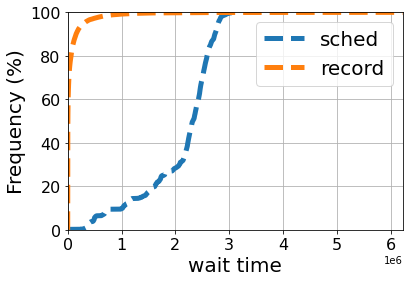

In [11]:
st = time.time()
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(900000,0)
print(sum(env.schedule_curr_sequence_reset(env.fcfs_score).values()))
real_wait_time1 = []
record_wait_time = []
for i in env.loads:
    if i.scheduled_time != -1:
        real_wait_time1.append(i.scheduled_time-i.submit_time)
        record_wait_time.append(i.wait_time)
plot_cdf(real_wait_time1, bins=0, xlabel="0")
plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.legend(["sched", "record"])
print(time.time()-st)

In [12]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(900000,0)
print(sum(env.schedule_curr_sequence_reset(env.sjf_score).values()))
sjf = []
for i in env.loads:
    if i.scheduled_time != -1:
        sjf.append(i.scheduled_time-i.submit_time)

Initialize Simple HPC Env


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 26864 ;max procs: 792000 ;max execution time: 268124
1126004.7849822042


In [13]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(900000,0)
print(sum(env.schedule_curr_sequence_reset(env.smallest_score).values()))
smallest = []
for i in env.loads:
    if i.scheduled_time != -1:
        smallest.append(i.scheduled_time-i.submit_time)

Initialize Simple HPC Env


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 26864 ;max procs: 792000 ;max execution time: 268124
478273.16256772954


In [14]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(900000,0)
print(sum(env.schedule_curr_sequence_reset(env.largest_score).values()))
largest = []
for i in env.loads:
    if i.scheduled_time != -1:
        largest.append(i.scheduled_time-i.submit_time)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 26864 ;max procs: 792000 ;max execution time: 268124
5726107.228051933


In [15]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(900000,0)
print(sum(env.schedule_curr_sequence_reset(env.f1_score).values()))
f1 = []
for i in env.loads:
    if i.scheduled_time != -1:
        f1.append(i.scheduled_time-i.submit_time)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 26864 ;max procs: 792000 ;max execution time: 268124
481670.11427770613


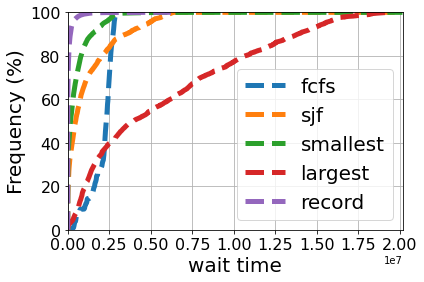

In [18]:
plot_cdf(real_wait_time1, bins=0, xlabel="0")
plot_cdf(sjf, bins=0, xlabel="0")
plot_cdf(smallest, bins=0, xlabel="0")
plot_cdf(largest, bins=0, xlabel="0")
#plot_cdf(f1, bins=0, xlabel="0")
plot_cdf(record_wait_time, bins=0, xlabel="wait time")

plt.legend(["fcfs","sjf","smallest","largest", "record"])

In [ ]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
env.seed(0)
env.my_init(jobs,26864,792000)
env.reset_for_test(30000,0)
print(sum(env.schedule_curr_sequence_reset(env.mtfct_score).values()))
mtfct = []
for i in env.loads:
    if i.scheduled_time != -1:
        mtfct.append(i.scheduled_time-i.submit_time)

In [ ]:
plot_cdf(mtfct, bins=0, xlabel="0")
plot_cdf(record_wait_time, bins=0, xlabel="wait time")

In [ ]:
env = HPCEnv(batch_job_slice=len(jobs),job_score_type=1)
def schedule_bw(algo=env.sjf_score):
    env.seed(0)
    env.my_init(jobs,26864,792000)
    env.reset_for_test(900000,0)
    print(sum(env.schedule_curr_sequence_reset(env.sjf_score).values()))
    sjf = []
    for i in env.loads:
        if i.scheduled_time != -1:
            sjf.append(i.scheduled_time-i.submit_time)
    return sjf
plot_cdf(real_wait_time1, bins=0, xlabel="0")
plot_cdf(sjf, bins=0, xlabel="0")
plot_cdf(smallest, bins=0, xlabel="0")
plot_cdf(largest, bins=0, xlabel="0")
record_wait_time = []
for i in env.loads:
    if i.scheduled_time != -1:
        record_wait_time.append(i.wait_time)
plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.xscale("log")
plot_cdf(record_wait_time, bins=0, xlabel="wait time")

plt.legend(["fcfs","sjf","smallest","largest", "record"])

In [47]:
print(len(hl_jobs))

246708


Initialize Simple HPC Env
loading workloads from dataset: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 116 ;max node: 968 ;max procs: 968 ;max execution time: 1964673
0
246708
25.572480000000496
loading workloads from dataset: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 116 ;max node: 968 ;max procs: 968 ;max execution time: 1964673
0
246708


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Max Allocated Processors: 116 ;max node: 968 ;max procs: 968 ;max execution time: 1964673
0
246708
25.572480000000496
loading workloads from dataset: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 116 ;max node: 968 ;max procs: 968 ;max execution time: 1964673
0
246708
25.574990000000497


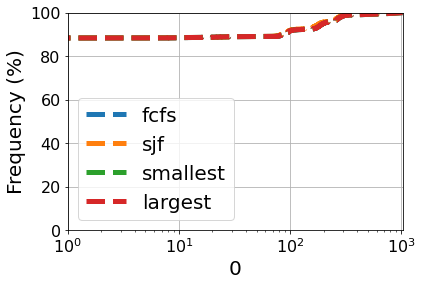

In [15]:
for j in hl_jobs:
    j.d["qtime"] = int(j.d["qtime"])
hl_jobs.sort(key=lambda x:x.d["qtime"])
env = HPCEnv(batch_job_slice=len(hl_jobs),job_score_type=1)

def schedule_hl(algo=env.sjf_score):
    env.seed(0)
    env.my_init(hl_jobs,968,968)
    env.reset_for_test(200000,0)
    print(sum(env.schedule_curr_sequence_reset(algo).values()))
    sjf = []
    for i in env.loads:
        if i.scheduled_time != -1:
            sjf.append(i.scheduled_time-i.submit_time)
    return sjf
plot_cdf(schedule_hl(env.fcfs_score), bins=0, xlabel="0")
plot_cdf(schedule_hl(env.sjf_score), bins=0, xlabel="0")
plot_cdf(schedule_hl(env.smallest_score), bins=0, xlabel="0")
plot_cdf(schedule_hl(env.largest_score), bins=0, xlabel="0")
#plot_cdf(f1, bins=0, xlabel="0")
# record_wait_time = []
# for i in env.loads:
#     if i.scheduled_time != -1:
#         record_wait_time.append(i.wait_time)
# plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.xscale("log")
plt.legend(["fcfs","sjf","smallest","largest", "record"])

In [93]:
# class MX_Job:
#     def __init__(self, row):
#         self.d = {"job_id":row["job_id"], "qtime":row["submit_time"], "start":row["start_time"], "end":row["end_time"],
#             "total_execution_slots":row["node_num"], "unique_node_count":row['node_num'], "Resource_List.walltime":time2hour(row["duration"]),
#                  "queue":"high"}
import random
from copy import deepcopy
for i in jobs:
    i.d["qtime"] = int(i.d["qtime"])
for i in hl_jobs:
    i.d["qtime"] = int(i.d["qtime"])
jobs.sort(key=lambda x:x.d["qtime"])
hl_jobs.sort(key=lambda x:x.d["qtime"])
start = int(jobs[0].d["qtime"])
end = int(jobs[-1].d["qtime"])
# hpc, ml, uniform
interval_type = "uniform"
resource_type = "more"
def update_hl_jobs(hl_jobs):
    new_q_time = start
    hl_jobs_new = deepcopy(hl_jobs)
    for job in hl_jobs_new:
        wait_time = int(job.d["start"]) - int(job.d["qtime"])
        run_time = int(job.d["end"]) - int(job.d["start"])
        if interval_type == "uniform":
            new_q_time = random.randint(start, end)
        elif interval_type == "hpc":
            new_q_time = new_q_time + random.choice(job_interval)
        elif interval_type == "ml":
            new_q_time = new_q_time + random.choice(df_submit_diff)
        else:
            raise NotImplementedError
        if resource_type == "original":
            pass
        elif resource_type == "more":
            job.d["unique_node_count"] = min(20000, 200*job.d["unique_node_count"])
        elif resource_type == "less":
            job.d["unique_node_count"] //= 2
        else:
            raise NotImplementedError
        job.d["qtime"] = new_q_time
        job.d["start"] = new_q_time + wait_time
        job.d["end"] = job.d["start"] + run_time
    return hl_jobs_new

def get_mx_jobs(jobs, hl_jobs):
    new_hl_jobs = update_hl_jobs(hl_jobs)
    mx_jobs = jobs[:200000]+new_hl_jobs[:25000]
    mx_jobs.sort(key=lambda x:x.d["qtime"])
    return mx_jobs

mx_jobs = get_mx_jobs(jobs, hl_jobs)

In [102]:
print(len(jobs))
print(len(hl_jobs))
# 20w, 5w
# 20w, 10w
# 10w, 20w
# 5w, 20w

358581
246708


In [103]:
hl_ids = set(int(i.d["job_id"]) for i in hl_jobs)
bw_ids = set(int(i.d["job_id"]) for i in jobs)
assert (hl_ids & bw_ids) == set()

In [138]:
mx_jobs.sort(key=lambda x:x.d["qtime"])
env = HPCEnv(batch_job_slice=len(mx_jobs),job_score_type=1)
a = []
def schedule_hl(algo=env.sjf_score):
    env.seed(0)
    env.my_init(mx_jobs,27832,792000)
    env.reset_for_test(len(mx_jobs)-5000,0)
    a.append(np.median(list(env.schedule_curr_sequence_reset(algo).values()))*(len(mx_jobs)-5000))
    #a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
    sjf = []
    for i in env.loads:
        if i.scheduled_time != -1:
            #print(i.scheduled_time, i.submit_time)
            sjf.append(i.scheduled_time-i.submit_time)
    return sjf

fcfs = schedule_hl(env.fcfs_score)
largest = schedule_hl(env.largest_score)
sjf = schedule_hl(env.sjf_score)
wfp3 = schedule_hl(env.wfp_score)
UNICEF = schedule_hl(env.uni_score)
print(a)
for i in a:
    print("{:d}".format(int(i)))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998
[94042.0, 134867.0, 5308.0, 1209.0, 38183.0]
94042
134867
5308
1209
38183


In [126]:
for i in a:
    print("{:d}".format(int(i)))

40094
42950
1121
336
10021


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Max Allocated Processors: 724352 ;max node: 27832 ;max procs: 792000 ;max execution time: 1209626
0
224998
[401700.8116409097, 775410.229136366, 136243.32941363537, 498727.1116090938, 841561.8256363571]


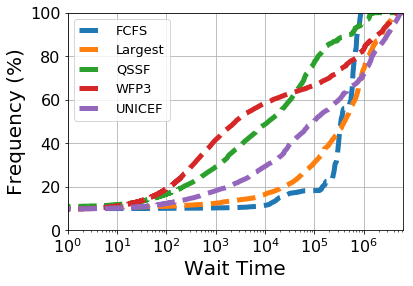

In [94]:
mx_jobs.sort(key=lambda x:x.d["qtime"])
env = HPCEnv(batch_job_slice=len(mx_jobs),job_score_type=1)
a = []
def schedule_hl(algo=env.sjf_score):
    env.seed(0)
    env.my_init(mx_jobs,27832,792000)
    env.reset_for_test(len(mx_jobs)-5000,0)
    a.append(sum(env.schedule_curr_sequence_reset(algo).values()))
    sjf = []
    for i in env.loads:
        if i.scheduled_time != -1:
            #print(i.scheduled_time, i.submit_time)
            sjf.append(i.scheduled_time-i.submit_time)
    return sjf

fcfs = schedule_hl(env.fcfs_score)
largest = schedule_hl(env.largest_score)
sjf = schedule_hl(env.sjf_score)
wfp3 = schedule_hl(env.wfp_score)
UNICEF = schedule_hl(env.uni_score)
print(a)
plot_cdf(fcfs, bins=0, xlabel="0")
plot_cdf(largest, bins=0, xlabel="0")
plot_cdf(sjf, bins=0, xlabel="0")
plot_cdf(wfp3, bins=0, xlabel="0")
plot_cdf(UNICEF, bins=0, xlabel="Wait Time")
#plot_cdf(f1, bins=0, xlabel="0")
# record_wait_time = []
# for i in env.loads:
#     if i.scheduled_time != -1:
#         record_wait_time.append(i.wait_time)
# plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.xscale("log")
plt.legend(["FCFS","Largest", "QSSF","WFP3", "UNICEF"], prop={'size': 13})

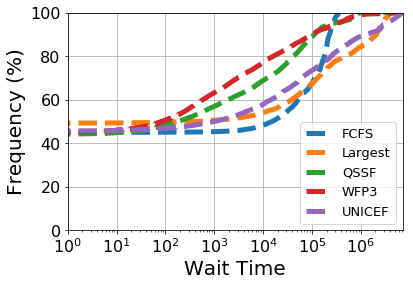

In [74]:

plot_cdf(fcfs, bins=0, xlabel="0")
plot_cdf(largest, bins=0, xlabel="0")
plot_cdf(sjf, bins=0, xlabel="0")
plot_cdf(wfp3, bins=0, xlabel="0")
plot_cdf(UNICEF, bins=0, xlabel="Wait Time")
#plot_cdf(f1, bins=0, xlabel="0")
# record_wait_time = []
# for i in env.loads:
#     if i.scheduled_time != -1:
#         record_wait_time.append(i.wait_time)
# plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.xscale("log")
plt.legend(["FCFS","Largest", "QSSF","WFP3", "UNICEF"], prop={'size': 13})

In [91]:
a = [(i.d["end"]-i.d["start"], index) for index, i in enumerate(hl_jobs)]
print(hl_jobs[a[0][1]].d)
print(max(a)[0]-min(a)[0])
print(max(a)[1])
print(min(a)[1])

{'job_id': 594681, 'qtime': 1539154607, 'start': 1539154607, 'end': 1539154649, 'total_execution_slots': 4, 'unique_node_count': 4, 'Resource_List.walltime': '0:0:42', 'queue': 'high'}
1964672
233864
9


c:\users\di\pycharmprojects\pythonproject\venv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


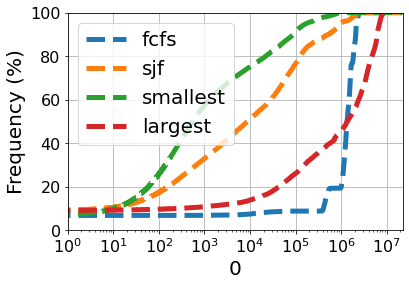

In [110]:
plot_cdf(fcfs, bins=0, xlabel="0")
plot_cdf(sjf, bins=0, xlabel="0")
plot_cdf(smallest, bins=0, xlabel="0")
plot_cdf(largest, bins=0, xlabel="0")
#plot_cdf(f1, bins=0, xlabel="0")
# record_wait_time = []
# for i in env.loads:
#     if i.scheduled_time != -1:
#         record_wait_time.append(i.wait_time)
# plot_cdf(record_wait_time, bins=0, xlabel="wait time")
plt.xscale("log")
plt.legend(["fcfs","sjf","smallest","largest"])

In [1155]:
new_philly_mira_df[new_philly_mira_df["job"]=="application_1504131676014_22233"]["run_time"]

4163    18848.0
4161    44171.0
4160    55502.0
4162    55743.0
4159    45065.0
Name: run_time, dtype: float64